# [1] Necessary imports

In [3]:
# NAME: loader.py
# DESCRIPTION: data loader for raw kitti data

import os
import sys
# sys.path.append('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/deepSfm_ori/FME')

import numpy as np 
import scipy.misc
import os
import cv2
from glob import glob

from path import Path
from tqdm import tqdm
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)

from torch.utils.data import Dataset

# for test
# from config import get_config
# config, unparsed = get_config()

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import argparse
from pebble import ProcessPool

# [2] Dump (Do not run; run the command below instead)

> python dump_img.py --dump --with_pose --with_X --with_sift --static_frames_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt --test_scene_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/test_scenes.txt --dataset_dir /data/kitti/raw --dump_root /home/ruizhu/Documents/Datasets/kitti/kitti_dump/corr_dump_siftIdx_npy_speed05_delta1235 --num_threads=1

In [123]:
parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dataset_dir", type=str, default="/data/KITTI/raw_meta/", help="path to dataset")   
parser.add_argument("--num_threads", type=int, default=1, help="number of thread to load data")
parser.add_argument("--img_height", type=int, default=128, help="number of thread to load data")
parser.add_argument("--img_width", type=int, default=416, help="number of thread to load data")
parser.add_argument("--static_frames_file", type=str, default="ref/static_frames.txt", help="static data file path")
parser.add_argument("--test_scene_file", type=str, default="ref/test_scenes_eigen.txt", help="test data file path")
parser.add_argument('--dump', action='store_true', default=False)
parser.add_argument("--with_X", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with_pose", action='store_true', default=True,
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
parser.add_argument("--with_sift", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store SIFT points ground truth along with images, for validation")
parser.add_argument("--dump_root", type=str, default='dump', help="Where to dump the data")

args = parser.parse_args('--dump --with_X --with_pose --with_sift \
    --static_frames_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt \
    --test_scene_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/test_scenes.txt \
    --dataset_dir /home/ruizhu/Documents/Datasets/kitti/raw \
    --dump_root /home/ruizhu/Documents/Datasets/kitti/corr_dump'.split())
print(args)

%reload_ext autoreload
%autoreload 2
from kitti_raw_loader import KittiRawLoader

data_loader = KittiRawLoader(args.dataset_dir,
                             static_frames_file=args.static_frames_file,
                             test_scene_file=args.test_scene_file,
                             img_height=args.img_height,
                             img_width=args.img_width,
                             get_X=args.with_X,
                             get_pose=args.with_pose,
                             get_sift=args.with_sift)

drive_path_test = data_loader.get_drive_path('2011_09_26', '0005')
data_loader.scenes = [drive_path_test]

n_scenes = len(data_loader.scenes)
print('Found {} potential scenes'.format(n_scenes))

args_dump_root = Path(args.dump_root)
args_dump_root.mkdir_p()

print('== Retrieving frames')
def dump_scenes_from_drive(args, drive_path):
    scene_list = data_loader.collect_scenes(drive_path)
    data_loader.dump_drive(args, drive_path, scene_list)
    return scene_list

if args.num_threads == 1:
    for drive_path in tqdm (data_loader.scenes):
        scene_list = dump_scenes_from_drive(args, drive_path)
else:
    with ProcessPool(max_workers=args.num_threads) as pool:
        tasks = pool.map(dump_scenes_from_drive, [args]*n_scenes, data_loader.scenes)
        try:
            for _ in tqdm(tasks.result(), total=n_scenes):
                pass
        except KeyboardInterrupt as e:
            tasks.cancel()
            raise e
    
print('== Generating train val lists')
np.random.seed(8964)
val_ratio = 0.0
# to avoid data snooping, we will make two cameras of the same scene to fall in the same set, train or val
subdirs = args_dump_root.dirs() # e.g. Path('./data/kitti_dump/2011_09_30_drive_0034_sync_02')
canonic_prefixes = set([subdir.basename()[:-2] for subdir in subdirs]) # e.g. '2011_09_28_drive_0039_sync_'
with open(args_dump_root / 'train.txt', 'w') as tf:
    with open(args_dump_root / 'val.txt', 'w') as vf:
        for pr in tqdm(canonic_prefixes):
            corresponding_dirs = args_dump_root.dirs('{}*'.format(pr)) # e.g. [Path('./data/kitti_dump/2011_09_30_drive_0033_sync_03'), Path('./data/kitti_dump/2011_09_30_drive_0033_sync_02')]
            if np.random.random() < val_ratio:
                for s in corresponding_dirs:
                    vf.write('{}\n'.format(s.name))
            else:
                for s in corresponding_dirs:
                    tf.write('{}\n'.format(s.name))

Namespace(dataset_dir='/home/ruizhu/Documents/Datasets/kitti/raw', dump=True, dump_root='/home/ruizhu/Documents/Datasets/kitti/corr_dump', img_height=128, img_width=416, num_threads=1, seed=0, static_frames_file='/home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt', test_scene_file='/home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/test_scenes.txt', with_X=True, with_pose=True, with_sift=True)


# [3] Sequence read

In [4]:
%reload_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.autograd import Variable
import torch.backends.cudnn as cudnn
import torch.optim
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data

parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dump-root", type=str, default='dump', help="Where to dump the data")
parser.add_argument('--sequence-length', type=int, metavar='N', help='sequence length for training', default=2)
parser.add_argument('--delta_ij', type=int, metavar='N', help='increments (e.g. [0, 2, 4], delta_ij=2)', default=1)
parser.add_argument('-b', '--batch_size', default=1, type=int, metavar='N', 
                    help='mini-batch size')
parser.add_argument('--epoch-size', default=0, type=int, metavar='N',
                    help='manual epoch size (will match dataset size if not set)')
parser.add_argument('--epochs', default=1, type=int, metavar='N',
                    help='number of total epochs to run')
parser.add_argument("--with_X", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with_pose", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
parser.add_argument("--with_sift", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store SIFT points ground truth along with images, for validation")
parser.add_argument("--load_h5", action='store_true', default=False,
                    help="Load from npy files (Default) or h5 files")
parser.add_argument('--seed', default=0, type=int, help='seed for random functions, and network initialization')
parser.add_argument('-j', '--workers', default=12, type=int, metavar='N', 
                    help='number of data loading workers')

args = parser.parse_args('--with_X --with_pose --with_sift --dump-root /home/ruizhu/Documents/Datasets/kitti/kitti_dump/corr_dump_siftIdx_npy_speed05 --sequence-length 2 --delta_ij 1'.split())
print(args)

# best_error = -1
# n_iter = 0
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

from sequence_folders import SequenceLoader

train_set = SequenceLoader(
        args.dump_root,
        transform=None,
        seed=args.seed,
        train=True,
        sequence_length=args.sequence_length,
        delta_ij=args.delta_ij,
        get_X=args.with_X,
        get_pose=args.with_pose,
        get_sift=args.with_sift,
        load_h5 = args.load_h5
)
np.set_printoptions(precision=8, suppress=True)
print('{} samples found in {} train scenes'.format(len(train_set), len(train_set.scenes)))
# imgs, intrinsics, scene_name, frame_ids, Xs, sift_kps, sift_deses, scene_poses = train_set.__getitem__(0)
# print(scene_name, frame_ids, len(imgs))


train_loader = torch.utils.data.DataLoader(
        train_set, batch_size=args.batch_size, shuffle=False,
        num_workers=args.workers, pin_memory=True)
if args.epoch_size == 0:
    args.epoch_size = len(train_loader) # len(scenes)//batch_size

def train_one_epoch(args, train_loader, epoch_size, count):
    global n_iter, device

    for i, (imgs, intrinsics, scene_name, frame_ids, Xs, sift_kps, sift_deses, scene_poses, matches_all, matches_good, get_flags) in tqdm(enumerate(train_loader)):
        count = max(matches_good.size()[1], count)
        print(count)
#         print([match_good.shape[0] for match_good in matches_good])
        imgs = [img.to(device) for img in imgs]
#         intrinsics = intrinsics.to(device)
#         frame_ids = [frame_id.to(device) for frame_id in frame_ids]
        if args.with_X:
            Xs = [X.to(device) for X in Xs]
        if args.with_sift:
            sift_kps = [sift_kp.to(device) for sift_kp in sift_kps]
            sift_deses = [sift_des.to(device) for sift_des in sift_deses]
            matches_all = [match_all.to(device) for match_all in matches_all]
            matches_good = [match_good.to(device) for match_good in matches_good]
        if args.with_pose:
            scene_poses = [scene_pose.to(device) for scene_pose in scene_poses]
            
        print(scene_poses[1].size())
        break
        
for epoch in range(args.epochs):
    count = -1
    train_loss, count = train_one_epoch(args, train_loader, args.epoch_size, count)

Namespace(batch_size=1, delta_ij=1, dump_root='/home/ruizhu/Documents/Datasets/kitti/kitti_dump/corr_dump_siftIdx_npy_speed05', epoch_size=0, epochs=1, load_h5=False, seed=0, sequence_length=2, with_X=True, with_pose=True, with_sift=True, workers=12)
cuda
20416 samples found in 29 train scenes


0it [00:00, ?it/s]


ValueError: too many values to unpack (expected 11)

2011_09_26_drive_0095_sync_02 ['0000000158', '0000000159'] 2
Reading from input list of param_list=[K, im_shape].


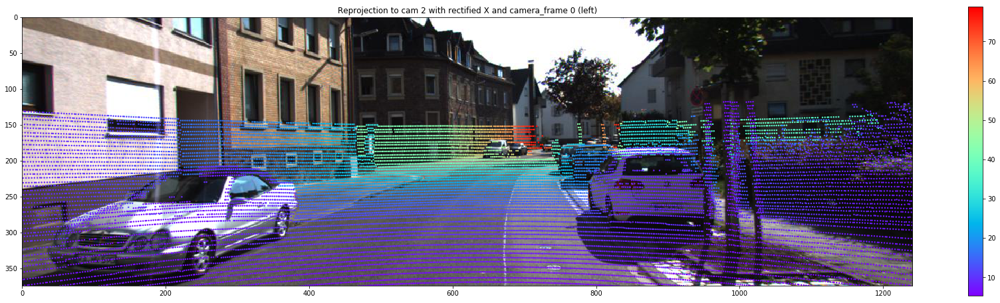

Reading from input list of param_list=[K, im_shape].


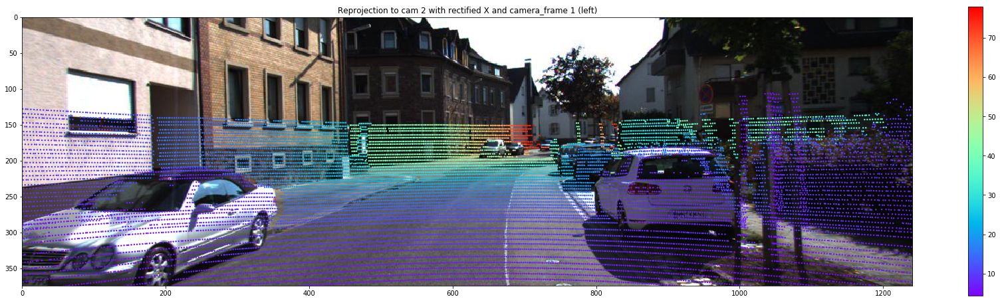

(2000, 4)


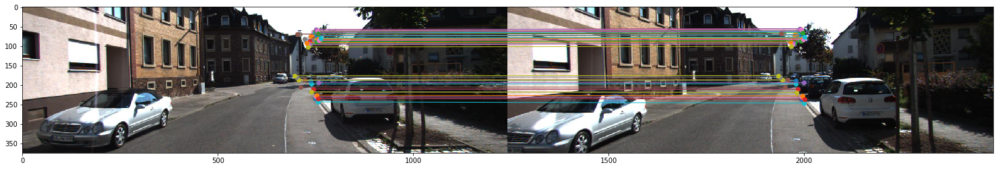

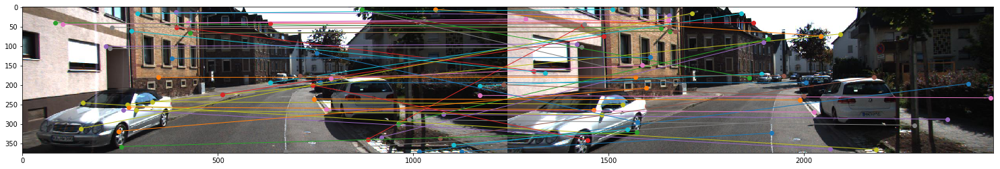

In [21]:
imgs, intrinsics, scene_name, frame_ids, Xs, sift_kps, sift_deses, scene_poses, matches_all, matches_good, get_flags = train_set.__getitem__(7)
print(scene_name, frame_ids, len(imgs))
import sys
sys.path.append("/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils")
sys.path.append("/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/dsac_tools")
import utils_vis, utils_misc
if get_flags['sifts']:
    delta_Rtij = utils_misc.Rt_depad(scene_poses[-1]) # scene motion
    val_inds_i = utils_vis.reproj_and_scatter(utils_misc.identity_Rt(), Xs[0], imgs[0].astype(np.uint8), visualize=True, title_appendix='frame %d (left)'%0, param_list = [intrinsics, imgs[0].shape[:2]])
    val_inds_j = utils_vis.reproj_and_scatter(delta_Rtij, Xs[0], imgs[-1].astype(np.uint8), visualize=True, title_appendix='frame %d (left)'%1, param_list = [intrinsics, imgs[0].shape[:2]])

if get_flags['matches']:
    print(matches_all.shape)
    utils_vis.draw_corr(imgs[0].astype(np.uint8), imgs[-1].astype(np.uint8), matches_good[:50, :2], matches_good[:50, 2:], linewidth=1)
    utils_vis.draw_corr(imgs[0].astype(np.uint8), imgs[-1].astype(np.uint8), matches_all[:50, :2], matches_all[:50, 2:], linewidth=1)

# In/outlier test

In [92]:
import yaml
import random
import os, sys
sys.path.append('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils')
import dsac_tools.utils_F as utils_F # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'
import dsac_tools.utils_opencv as utils_opencv # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'
import dsac_tools.utils_vis as utils_vis # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'
import dsac_tools.utils_misc as utils_misc # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'

with open('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/deepSfm_ori/configs/kitti_corr.yaml', 'r') as f:
    config = yaml.load(f)

gtW_errors = {}
opencv_5point_errors = {}
opencv_8point_errors = {}

from IPython.display import clear_output

for i, sample in enumerate(train_loader):
#     clear_output()
#     if i<7:
#         continue
    print(i)
    imgs = sample['imgs'] # [batch_size, H, W, 3]
    Ks = sample['K'] # [batch_size, 3, 3]
    scene_names = sample['scene_name']
    frame_ids = sample['frame_ids']
    # if config['data']['read_what']['with_pose']: # always true
    scene_poses = sample['scene_poses'] # list of sequence_length tensors, which with size [batch_size, 4, 4]; the first being identity, the rest are [[R; t], [0, 1]]
    Xs = sample['Xs'] # list of [batch_size, 3, Ni]; only support batch_size=1 because of variable points Ni for each sample
    # if config['data']['read_what']['with_sift']: # always true
    sift_kps, sift_deses = sample['sift_kps'], sample['sift_deses']
    assert sample['get_flags']['have_matches'][0].numpy(), 'Did not find the corres files!'
    matches_all, matches_good = sample['matches_all'], sample['matches_good']

    delta_Rtijs_4_4 = scene_poses[1] # [batch_size, 4, 4], asserting we have 2 frames where scene_poses[0] are all identities
    E_gts_list = []
    F_gts_list = []
    for delta_Rtij, K in zip(delta_Rtijs_4_4, Ks):
        E_gt_th, F_gt_th = utils_F._E_F_from_Rt(delta_Rtij[:3, :3], delta_Rtij[:3, 3:4], K.to(torch.float64), tensor_input=True)    
        E_gts_list.append(E_gt_th)
        F_gts_list.append(F_gt_th)
    E_gts = torch.stack(E_gts_list) # [batch_size, 3, 3]
    F_gts = torch.stack(F_gts_list) # [batch_size, 3, 3]
    delta_Rs = delta_Rtijs_4_4[:, :3, :3] # [batch_size, 3, 3]
    delta_ts = delta_Rtijs_4_4[:, :3, 3:4] # [batch_size, 3, 1]
    delta_ts_normalized = F.normalize(delta_ts, p=2, dim=1)
    
    # Get and Normalize points
    matches_use = matches_good
    x1, x2 = matches_use[:, :, :2], matches_use[:, :, 2:] # [batch_size, N, 2(W, H)]
    x1_normalizedK = utils_misc._de_homo(torch.matmul(torch.inverse(Ks), utils_misc._homo(x1).transpose(1, 2)).transpose(1, 2)) # [batch_size, N, 2(W, H)], min/max_X=[-W/2/f, W/2/f]
    x2_normalizedK = utils_misc._de_homo(torch.matmul(torch.inverse(Ks), utils_misc._homo(x2).transpose(1, 2)).transpose(1, 2)) # [batch_size, N, 2(W, H)], min/max_X=[-W/2/f, W/2/f]
        
    # Test epipolar
    F_gts_normalized = Ks.transpose(1, 2)@F_gts.to(torch.float32)@Ks
    K = Ks[0].numpy()
#     utils_opencv.show_epipolar_normalized(x1_normalizedK[0].numpy(), x2_normalizedK[0].numpy(), im1, im2, F_gts_normalized[0].numpy(), [K[1, 2]/K[1, 1], K[0, 2]/K[0, 0]])
# #     utils_opencv.show_epipolar_opencv(x1[0].numpy()[:20], x2[0].numpy()[:20], im1, im2, F_gts.to(torch.float32)[0].numpy())
#     utils_opencv.show_epipolar_rui(x1[0].numpy(), x2[0].numpy(), im1, im2, F_gts.to(torch.float32)[0].numpy(), im1.shape[:2])
    
    # Geometric distance
#     geo_dist = utils_F._sampson_dist
    geo_dist = utils_F._sym_epi_dist
    geo_dists = geo_dist(F_gts_normalized.to(torch.float32), x1_normalizedK, x2_normalizedK)
    dists = geo_dists.numpy().flatten()
    geo_thres = 5e-5
    
    # Visualization
#     delta_Rtij = scene_poses[-1].numpy()[0, :3, :] # scene motion 
#     im1 = imgs[0].numpy().astype(np.uint8)[0]
#     im2 = imgs[1].numpy().astype(np.uint8)[0]
#     X1 = Xs[0].numpy()[0]
# #     matches_good = matches_good.numpy()[0]
# #     matches_all = matches_all.numpy()[0]
#     matches_use = matches_use.numpy()[0]
#     intrinsics = Ks[0].numpy()
# #     val_inds_i = utils_vis.reproj_and_scatter(utils_misc.identity_Rt(), X1, im1, visualize=True, title_appendix='frame %d (left)'%0, param_list = [intrinsics, im1.shape[:2]], set_lim=False)
# #     val_inds_j = utils_vis.reproj_and_scatter(delta_Rtij, X1, im2, visualize=True, title_appendix='frame %d (left)'%1, param_list = [intrinsics, im1.shape[:2]], set_lim=False)
# #     utils_vis.draw_corr(im1, im2, matches_good[:50, :2], matches_good[:50, 2:], linewidth=2)
    
#     inlier_mask = dists<geo_thres
#     inlier_sort_idx = np.argsort(dists[inlier_mask])[::-1]
#     inlier_num = inlier_sort_idx.shape[0]
#     print('%d/%d inliers.'%(inlier_num, matches_use.shape[0]))
#     inlier_show_top = 20
# #     inlier_show_idx = random.sample(range(sum(inlier_mask)), inlier_show_top)
#     inlier_sort_idx = inlier_sort_idx[:inlier_show_top]
# #     utils_vis.draw_corr_widths(im1, im2, matches_use[show_idx, :2], matches_use[show_idx, 2:], linewidth=np.ones_like(dists_show[show_idx]), rescale=False, scale=5.)
#     print(dists[inlier_mask][inlier_sort_idx]/thres)
    
#     utils_vis.draw_corr_widths(im1, im2, matches_use[inlier_mask][inlier_sort_idx, :2], matches_use[inlier_mask][inlier_sort_idx, 2:], \
#                                linewidth=dists[inlier_mask][inlier_sort_idx]+thres, rescale=False, scale=2./thres)
    
#     outlier_mask = dists>geo_thres
#     outlier_sort_idx = np.argsort(dists[outlier_mask])
#     outlier_num = outlier_sort_idx.shape[0]
#     print('%d/%d outliers.'%(outlier_num, matches_use.shape[0]))
#     outlier_show_top = min(outlier_num, 20)
#     outlier_sort_idx = outlier_sort_idx[:outlier_show_top]
#     print(dists[outlier_mask][outlier_sort_idx]/thres)
#     dists[dists>5*thres] = 5*thres
    
#     utils_vis.draw_corr_widths(im1, im2, matches_use[outlier_mask][outlier_sort_idx, :2], matches_use[outlier_mask][outlier_sort_idx, 2:], \
#                                linewidth=dists[outlier_mask][outlier_sort_idx]+thres, rescale=False, scale=2./thres)
    
    # Quantitative
    idx = 0
    K = Ks[idx]
    x1_single, x2_single = x1[idx], x2[idx]
    w = (geo_dists<geo_thres).float()[idx]
    E_est_th = utils_F._E_from_XY(x1_single, x2_single, K, torch.diag(w))
    print('+++++++++++++++++++++++++++++++++++++ inliers with GT w', torch.sum(w>0.5).item())
    print(scene_names, frame_ids)
    delta_Rtij_inv = np.linalg.inv(delta_Rtijs_4_4[idx].numpy())[:3]
    print('GT camera motion\n', delta_Rtij_inv)
    print('GT scene motion\n', delta_Rtijs_4_4[idx].numpy()[:3])
    M2_list, error_Rt = utils_F._E_to_M(E_est_th.detach(), K.detach(), x1_single.detach().numpy(), x2_single.detach().numpy(), w.detach()>0.5, \
                                        delta_Rtij_inv, depth_thres=500., show_debug=False, show_result=True, method_name='GT ws')
    
    M, error_Rt_5point = utils_opencv.recover_camera_opencv(E_gts[0].numpy(), K.detach().numpy(), x2_single.detach().numpy(), x1_single.detach().numpy(), \
                                                            delta_Rtij_inv, five_point=True, threshold=0.01)
    
    if error_Rt and error_Rt_5point:
        gtW_errors['%d'%i] = error_Rt
        opencv_5point_errors['%d'%i] = error_Rt_5point

#     if i > 100:
#         break
    if not error_Rt:
        break

0
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1292
[Path('2011_09_30_drive_0028_sync_02')] [['0000001690'], ['0000001691']]
GT camera motion
 [[ 0.99999788 -0.00139234 -0.00151868 -0.01591866]
 [ 0.00139202  0.99999901 -0.00021172 -0.01503032]
 [ 0.00151898  0.0002096   0.99999882  0.88091738]]
GT scene motion
 [[ 0.99999788  0.00139202  0.00151898  0.01460145]
 [-0.00139234  0.99999901  0.0002096   0.0148235 ]
 [-0.00151868 -0.00021172  0.99999882 -0.88094371]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999803 -0.00141925 -0.0013369  -0.00241713]
 [ 0.00141815  0.99999875 -0.00066251 -0.01142017]
 [ 0.00133781  0.00066057  0.9999989   0.9999319 ]]
Recovered by GT ws (camera): The rotation error (degree) 0.0279, and translation error (degree) 0.9530
>>>>>>>>>>>>>>>> Running OpenCV camera pose estimation... ---------------
# 818/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0133, and tran

# 205/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1972, and translation error (degree) 9.4006
[[ 0.99871286  0.00387125 -0.05057307 -0.27221403]
 [-0.00381819  0.99999205  0.00114576  0.00694263]
 [ 0.05057711 -0.00095119  0.99871971  0.96221168]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
7
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1276
[Path('2011_09_26_drive_0095_sync_02')] [['0000000158'], ['0000000159']]
GT camera motion
 [[ 0.99996798  0.00086188  0.00795647 -0.00942654]
 [-0.00086888  0.99999924  0.00087627  0.01542698]
 [-0.00795571 -0.00088315  0.99996796  0.99355149]]
GT scene motion
 [[ 0.99996798 -0.00086888 -0.00795571  0.01734404]
 [ 0.00086188  0.99999924 -0.00088315 -0.01454139]
 [ 0.00795647  0.00087627  0.99996796 -0.99345817]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998295 -0.00257559  0.00524551  0.03496993]
 [ 0.00257048  0.99

# 825/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0405, and translation error (degree) 0.3976
[[ 0.99998983 -0.00039847 -0.00449143 -0.00194692]
 [ 0.00040344  0.99999931  0.00110454 -0.0052454 ]
 [ 0.00449098 -0.00110635  0.9999893   0.99998435]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
14
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1308
[Path('2011_09_26_drive_0015_sync_02')] [['0000000133'], ['0000000134']]
GT camera motion
 [[ 0.99999994 -0.00024064 -0.00025948  0.00024774]
 [ 0.00024058  0.99999995 -0.00022751  0.00172642]
 [ 0.00025953  0.00022745  0.99999994  0.67156413]]
GT scene motion
 [[ 0.99999994  0.00024058  0.00025953 -0.00042245]
 [-0.00024064  0.99999995  0.00022745 -0.00187911]
 [-0.00025948 -0.00022751  0.99999994 -0.67156363]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999994  0.00048639  0.00029693 -0.02066313]
 [-0.00048615  0.9

# 842/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0361, and translation error (degree) 0.5190
[[ 0.9999996   0.00089564 -0.00005991 -0.00698078]
 [-0.00089568  0.99999938 -0.0006683   0.00386014]
 [ 0.00005931  0.00066835  0.99999977  0.99996818]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
21
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1296
[Path('2011_09_26_drive_0015_sync_02')] [['0000000061'], ['0000000062']]
GT camera motion
 [[ 0.99999954  0.00044022 -0.00085486 -0.00608826]
 [-0.00043973  0.99999974  0.00056791 -0.01025399]
 [ 0.00085511 -0.00056754  0.99999947  1.17827621]]
GT scene motion
 [[ 0.99999954 -0.00043973  0.00085511  0.00507619]
 [ 0.00044022  0.99999974 -0.00056754  0.01092538]
 [-0.00085486  0.00056791  0.99999947 -1.17827497]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999875  0.00114381 -0.00071516 -0.00794696]
 [-0.00114364  0.9

# 832/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0310, and translation error (degree) 1.5546
[[ 0.99998585 -0.00035624 -0.00530848  0.00298568]
 [ 0.00037205  0.9999955   0.00297816 -0.01911091]
 [ 0.0053074  -0.00298009  0.99998148  0.99981291]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
28
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1297
[Path('2011_09_30_drive_0033_sync_02')] [['0000001406'], ['0000001407']]
GT camera motion
 [[ 0.99999971  0.00003984  0.00076582 -0.00289235]
 [-0.0000414   0.99999791  0.00204585 -0.03081403]
 [-0.00076574 -0.00204588  0.99999761  1.44360731]]
GT scene motion
 [[ 0.99999971 -0.0000414  -0.00076574  0.0039965 ]
 [ 0.00003984  0.99999791 -0.00204588  0.03376753]
 [ 0.00076582  0.00204585  0.99999761 -1.44353861]]
The 0_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999997   0.0000192  -0.00105668 -0.02402696]
 [-0.00001607  0.9

# 927/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1220, and translation error (degree) 1.1560
[[ 0.9989365  -0.00109051  0.0460942   0.08932712]
 [ 0.00095317  0.99999504  0.00300158 -0.00111778]
 [-0.04609724 -0.00295445  0.99893259  0.99600172]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
35
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1303
[Path('2011_09_30_drive_0033_sync_02')] [['0000000860'], ['0000000861']]
GT camera motion
 [[ 0.99972744  0.00053227 -0.02334016 -0.03633446]
 [-0.00053206  0.99999986  0.00001541 -0.02409615]
 [ 0.02334017 -0.00000299  0.99972758  1.06690018]]
GT scene motion
 [[ 0.99972744 -0.00053206  0.02334016  0.01141011]
 [ 0.00053227  0.99999986 -0.00000299  0.02411868]
 [-0.02334016  0.00001541  0.99972758 -1.06745721]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9997413   0.00057038 -0.0227405  -0.0169045 ]
 [-0.00057833  0.9

# 1209/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0414, and translation error (degree) 0.9863
[[ 0.99999235 -0.00053118 -0.00387409 -0.00748449]
 [ 0.00054662  0.99999192  0.00398367 -0.01689277]
 [ 0.00387194 -0.00398576  0.99998456  0.99982929]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
42
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1295
[Path('2011_09_30_drive_0028_sync_02')] [['0000002646'], ['0000002647']]
GT camera motion
 [[ 0.99997121 -0.00064559 -0.00756121 -0.00740799]
 [ 0.00064494  0.99999979 -0.0000885  -0.01906169]
 [ 0.00756126  0.00008362  0.99997141  0.98908135]]
GT scene motion
 [[ 0.99997121  0.00064494  0.00756126 -0.00005863]
 [-0.00064559  0.99999979  0.00008362  0.01897419]
 [-0.00756121 -0.0000885   0.99997141 -0.98911078]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999779   0.00116925 -0.00650859 -0.0095172 ]
 [-0.00115952  0.

# 788/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0401, and translation error (degree) 0.3886
[[ 0.99999948 -0.00046562 -0.00090976 -0.00533042]
 [ 0.00046606  0.99999978  0.0004805   0.00205762]
 [ 0.00090954 -0.00048092  0.99999947  0.99998368]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
49
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1303
[Path('2011_10_03_drive_0034_sync_02')] [['0000000544'], ['0000000545']]
GT camera motion
 [[ 0.99972453 -0.00016027 -0.02346997 -0.03885866]
 [ 0.00006954  0.99999252 -0.00386653 -0.03516585]
 [ 0.02347041  0.00386383  0.99971707  1.02823997]]
GT scene motion
 [[ 0.99972453  0.00006954  0.02347042  0.01471718]
 [-0.00016027  0.99999252  0.00386383  0.03118641]
 [-0.02346997 -0.00386653  0.99971707 -1.02899702]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9997429  -0.00086269 -0.02264051 -0.01885891]
 [ 0.00077706  0.9

# 1165/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0544, and translation error (degree) 0.4451
[[ 0.99990153 -0.0015514  -0.0139472  -0.00786756]
 [ 0.0015899   0.99999496  0.00274911 -0.01306491]
 [ 0.01394287 -0.00277101  0.99989895  0.9998837 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
56
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1292
[Path('2011_09_30_drive_0020_sync_02')] [['0000000934'], ['0000000935']]
GT camera motion
 [[ 0.99998593  0.00130598  0.00514083  0.00528876]
 [-0.00130936  0.99999893  0.00065463 -0.01909166]
 [-0.00513997 -0.00066135  0.99998657  1.15557924]]
GT scene motion
 [[ 0.99998593 -0.00130936 -0.00513997  0.00062595]
 [ 0.00130598  0.99999893 -0.00066135  0.01984897]
 [ 0.00514083  0.00065463  0.99998657 -1.15557842]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998754  0.00117283  0.00489159  0.01446832]
 [-0.00117625  0.

# 296/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0142, and translation error (degree) 2.0477
[[ 0.99999968  0.00078239  0.00017057  0.01760959]
 [-0.00078222  0.99999923 -0.00096324  0.00864407]
 [-0.00017133  0.00096311  0.99999952  0.99980757]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
63
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1273
[Path('2011_09_26_drive_0032_sync_02')] [['0000000159'], ['0000000160']]
GT camera motion
 [[ 0.99999556 -0.00288606 -0.00074734  0.00725754]
 [ 0.00288668  0.9999955   0.0008214  -0.02269648]
 [ 0.00074496 -0.00082356  0.99999938  1.43093296]]
GT scene motion
 [[ 0.99999556  0.00288668  0.00074496 -0.00825798]
 [-0.00288606  0.9999955  -0.00082356  0.02389578]
 [-0.00074734  0.0008214   0.99999938 -1.43090801]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999929  -0.00370161 -0.00103318 -0.00181543]
 [ 0.0037027   0.9

# 1210/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0334, and translation error (degree) 0.2878
[[ 0.99999984 -0.00042334  0.00037644 -0.0004373 ]
 [ 0.00042314  0.99999977  0.00052209 -0.00645171]
 [-0.00037666 -0.00052193  0.99999979  0.99997909]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
70
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1284
[Path('2011_09_30_drive_0020_sync_02')] [['0000000775'], ['0000000776']]
GT camera motion
 [[ 0.99999947  0.00014536  0.00102054  0.00249277]
 [-0.00014824  0.999996    0.00282344 -0.02920983]
 [-0.00102013 -0.00282359  0.99999549  1.598771  ]]
GT scene motion
 [[ 0.99999947 -0.00014824 -0.00102013 -0.00086615]
 [ 0.00014536  0.999996   -0.00282359  0.03372363]
 [ 0.00102054  0.00282344  0.99999549 -1.59868387]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999934  0.00039685  0.00085458  0.00729833]
 [-0.00039855  0.

# 639/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0345, and translation error (degree) 17.9503
[[ 0.9999968   0.00240299 -0.00079347  0.01512388]
 [-0.00240391  0.99999644 -0.00115795 -0.01443037]
 [ 0.00079068  0.00115985  0.99999901  0.99978149]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
77
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1297
[Path('2011_09_30_drive_0028_sync_02')] [['0000002462'], ['0000002463']]
GT camera motion
 [[ 0.99999676 -0.00249111  0.00052254 -0.00383483]
 [ 0.00248926  0.99999074  0.00350976 -0.01629393]
 [-0.00053128 -0.00350844  0.9999937   0.90593748]]
GT scene motion
 [[ 0.99999676  0.00248926 -0.00053128  0.00435669]
 [-0.00249111  0.99999074 -0.00350844  0.01946266]
 [ 0.00052254  0.00350976  0.9999937  -0.90587258]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999957  -0.00158596  0.00241619 -0.00798579]
 [ 0.00157764  0.

# 992/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0564, and translation error (degree) 0.2739
[[ 0.99932322 -0.00146799  0.03675531  0.056001  ]
 [ 0.00145502  0.99999887  0.00037967 -0.01502074]
 [-0.03675583 -0.00032594  0.99932422  0.99831772]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
84
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1301
[Path('2011_09_30_drive_0028_sync_02')] [['0000001490'], ['0000001491']]
GT camera motion
 [[ 0.99999118  0.0013593   0.00397477 -0.00556707]
 [-0.00134821  0.9999952  -0.00279141 -0.01677768]
 [-0.00397855  0.00278603  0.9999882   0.85476345]]
GT scene motion
 [[ 0.99999118 -0.00134821 -0.00397855  0.00894512]
 [ 0.0013593   0.9999952   0.00278603  0.01440377]
 [ 0.00397477 -0.00279141  0.9999882  -0.85477808]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999861   0.00205436  0.0047887  -0.00455767]
 [-0.00204167  0.9

# 419/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0209, and translation error (degree) 0.1246
[[ 0.99999966  0.00075899 -0.00032191 -0.00229064]
 [-0.0007588   0.99999953  0.00059767 -0.00003747]
 [ 0.00032236 -0.00059742  0.99999977  0.99999738]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
91
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1275
[Path('2011_09_26_drive_0061_sync_02')] [['0000000459'], ['0000000460']]
GT camera motion
 [[ 0.99999238  0.00271934 -0.00280024 -0.00522677]
 [-0.00270975  0.99999047  0.00342258  0.04616487]
 [ 0.00280952 -0.00341497  0.99999022  0.71151057]]
GT scene motion
 [[ 0.99999238 -0.00270975  0.00280952  0.00335282]
 [ 0.00271934  0.99999047 -0.00341497 -0.04372043]
 [-0.00280024  0.00342258  0.99999022 -0.71167625]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999925   0.00281308 -0.00265513 -0.01830269]
 [-0.00280491  0.9

# 1115/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0271, and translation error (degree) 6.4405
[[ 0.99999982  0.00037999 -0.00047007  0.00521211]
 [-0.00038122  0.99999648 -0.00262598 -0.00791551]
 [ 0.00046907  0.00262616  0.99999644  0.99995509]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
98
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_10_03_drive_0034_sync_02')] [['0000001497'], ['0000001498']]
GT camera motion
 [[ 0.99999905  0.00062549  0.00123024  0.00149216]
 [-0.00062659  0.9999994   0.00089425 -0.0403158 ]
 [-0.00122968 -0.00089502  0.99999884  1.14959019]]
GT scene motion
 [[ 0.99999905 -0.00062659 -0.00122968 -0.00010379]
 [ 0.00062549  0.9999994  -0.00089502  0.04134375]
 [ 0.00123024  0.00089425  0.99999884 -1.14955464]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999908   0.00394577  0.00140336 -0.00448071]
 [-0.0039467   0.

# 903/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0464, and translation error (degree) 1.1896
[[ 0.99999516 -0.00311049  0.00004911  0.0146415 ]
 [ 0.00311062  0.99999078 -0.00295975 -0.01305604]
 [-0.00003991  0.00295989  0.99999562  0.99980756]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
105
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1230
[Path('2011_09_30_drive_0033_sync_02')] [['0000000283'], ['0000000284']]
GT camera motion
 [[ 0.99976511  0.0025612   0.02152134  0.00485725]
 [-0.00259193  0.99999566  0.00140026 -0.02881796]
 [-0.02151766 -0.00145572  0.99976741  1.42824165]]
GT scene motion
 [[ 0.99976511 -0.00259193 -0.02151766  0.02580161]
 [ 0.0025612   0.99999566 -0.00145572  0.03088451]
 [ 0.02152134  0.00140026  0.99976741 -1.42797363]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9997305   0.00152604  0.0231707   0.01847169]
 [-0.00155091  0.

# 1160/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0448, and translation error (degree) 0.3487
[[ 0.99999586  0.0024388   0.00152513 -0.00710312]
 [-0.0024396   0.99999689  0.00052346 -0.00869692]
 [-0.00152385 -0.00052717  0.9999987   0.99993695]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
112
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1302
[Path('2011_10_03_drive_0034_sync_02')] [['0000003287'], ['0000003288']]
GT camera motion
 [[ 0.99999171 -0.00266563  0.00307657  0.01371586]
 [ 0.00265915  0.99999424  0.00210981 -0.01772069]
 [-0.00308217 -0.00210161  0.99999304  0.92880538]]
GT scene motion
 [[ 0.99999171  0.00265915 -0.00308217 -0.01080589]
 [-0.00266563  0.99999424 -0.00210161  0.01970913]
 [ 0.00307657  0.00210981  0.99999304 -0.92880373]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999386 -0.00307096  0.00162776  0.01971183]
 [ 0.00306737  0

# 613/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0590, and translation error (degree) 0.3800
[[ 0.99962588  0.00011021 -0.02735111 -0.02952149]
 [-0.00001826  0.99999435  0.00336206 -0.01020902]
 [ 0.02735132 -0.0033603   0.99962023  0.99951201]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
119
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_09_28_drive_0001_sync_02')] [['0000000077'], ['0000000078']]
GT camera motion
 [[ 0.99995059 -0.0013195   0.00985265  0.02130432]
 [ 0.0013234   0.99999905 -0.00038862 -0.00657436]
 [-0.00985213  0.00040164  0.99995139  0.67259298]]
GT scene motion
 [[ 0.99995059  0.0013234  -0.00985213 -0.01466809]
 [-0.0013195   0.99999905  0.00040164  0.00633233]
 [ 0.00985265 -0.00038862  0.99995139 -0.67277274]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999525  -0.00325379  0.00917997  0.04709028]
 [ 0.00326282  0.

# 1112/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0224, and translation error (degree) 0.4749
[[ 0.99991548  0.00008661 -0.01300071 -0.01158643]
 [-0.00010144  0.99999935 -0.00113989 -0.01629592]
 [ 0.0130006   0.00114112  0.99991484  0.99980008]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
126
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1274
[Path('2011_09_30_drive_0034_sync_02')] [['0000000159'], ['0000000160']]
GT camera motion
 [[ 0.99997516  0.00385206 -0.00590252 -0.01922591]
 [-0.0038474   0.99999228  0.00080084 -0.01796672]
 [ 0.00590556 -0.00077811  0.99998226  0.86391872]]
GT scene motion
 [[ 0.99997516 -0.0038474   0.00590556  0.01405439]
 [ 0.00385206  0.99999228 -0.00077811  0.01871287]
 [-0.00590252  0.00080084  0.99998226 -0.86400249]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999624   0.00742129 -0.00448299 -0.01804979]
 [-0.00742137  0

# 882/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0317, and translation error (degree) 0.6049
[[ 0.99998785  0.00034348  0.00491805 -0.00588965]
 [-0.0003468   0.99999971  0.00067514  0.00123371]
 [-0.00491781 -0.00067684  0.99998768  0.99998189]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
133
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1291
[Path('2011_09_30_drive_0028_sync_02')] [['0000004937'], ['0000004938']]
GT camera motion
 [[ 0.99999997 -0.00013407 -0.00018841  0.01322918]
 [ 0.000134    0.99999993 -0.00034145 -0.02349521]
 [ 0.00018846  0.00034142  0.99999992  1.11930667]]
GT scene motion
 [[ 0.99999997  0.000134    0.00018846 -0.01343697]
 [-0.00013407  0.99999993  0.00034142  0.02311483]
 [-0.00018841 -0.00034145  0.99999992 -1.11931212]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999917 -0.00111056 -0.000612    0.01385165]
 [ 0.00111032  0.

# 528/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0536, and translation error (degree) 1.6912
[[ 0.99987549  0.00096709  0.01575017  0.03034915]
 [-0.00097433  0.99999942  0.00045155 -0.00420095]
 [-0.01574973 -0.00046684  0.99987586  0.99953053]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
140
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1258
[Path('2011_09_26_drive_0032_sync_02')] [['0000000096'], ['0000000097']]
GT camera motion
 [[ 0.99999917 -0.00039764 -0.00122653 -0.00387384]
 [ 0.00039862  0.99999961  0.00079311 -0.00645511]
 [ 0.00122621 -0.0007936   0.99999893  1.86695313]]
GT scene motion
 [[ 0.99999917  0.00039862  0.00122621  0.00158712]
 [-0.00039764  0.99999961 -0.0007936   0.00793519]
 [-0.00122653  0.00079311  0.99999893 -1.86695077]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999999    0.00065584 -0.00104237 -0.00676788]
 [-0.00065485  0.

# 104/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0357, and translation error (degree) 0.3137
[[ 0.99989248  0.0012734  -0.01460816 -0.07137086]
 [-0.00125742  0.9999986   0.00110315 -0.01909392]
 [ 0.01460955 -0.00108466  0.99989269  0.99726708]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
147
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1301
[Path('2011_09_30_drive_0028_sync_02')] [['0000002681'], ['0000002682']]
GT camera motion
 [[ 0.99998016  0.00266696 -0.00570707 -0.01493175]
 [-0.00266317  0.99999623  0.00067191 -0.01829888]
 [ 0.00570884 -0.0006567   0.99998349  0.53587106]]
GT scene motion
 [[ 0.99998016 -0.00266317  0.00570884  0.01182352]
 [ 0.00266696  0.99999623 -0.0006567   0.01869054]
 [-0.00570707  0.00067191  0.99998349 -0.53593513]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998367  0.00339681 -0.00459945 -0.03186104]
 [-0.00339398  0.

# 1007/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0209, and translation error (degree) 0.5071
[[ 0.99998251 -0.00429525  0.00406486  0.00327969]
 [ 0.00430838  0.99998551 -0.00322731 -0.01282659]
 [-0.00405094  0.00324476  0.99998653  0.99991236]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
154
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1302
[Path('2011_09_26_drive_0070_sync_02')] [['0000000336'], ['0000000337']]
GT camera motion
 [[ 0.99999651  0.00113302  0.00238851  0.00022262]
 [-0.00113255  0.99999934 -0.0001986   0.00232512]
 [-0.00238873  0.00019589  0.99999713  1.97804614]]
GT scene motion
 [[ 0.99999651 -0.00113255 -0.00238873  0.00450504]
 [ 0.00113302  0.99999934  0.00019589 -0.00271285]
 [ 0.00238851 -0.0001986   0.99999713 -1.97804053]]
The 0_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999957   0.00243724  0.00166226 -0.00000653]
 [-0.00243732  0

# 837/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0254, and translation error (degree) 1.0015
[[ 0.99999858 -0.00168029  0.00012603 -0.00673623]
 [ 0.00168021  0.99999838  0.00064792 -0.00082131]
 [-0.00012712 -0.00064771  0.99999978  0.99997697]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
161
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1287
[Path('2011_09_30_drive_0033_sync_02')] [['0000000018'], ['0000000019']]
GT camera motion
 [[ 0.99997331  0.00125671 -0.00719706 -0.01142054]
 [-0.00126764  0.99999805 -0.00151476 -0.00493114]
 [ 0.00719514  0.00152384  0.99997295  0.46265804]]
GT scene motion
 [[ 0.99997331 -0.00126764  0.00719514  0.0080851 ]
 [ 0.00125671  0.99999805  0.00152384  0.00424046]
 [-0.00719706 -0.00151476  0.99997295 -0.46273519]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99993944  0.00378237 -0.01030288  0.04272505]
 [-0.0038037   0.

# 63/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1054, and translation error (degree) 66.2314
[[ 0.99999867 -0.0002227  -0.00161751  0.91709127]
 [ 0.00022303  0.99999995  0.00020733 -0.05340307]
 [ 0.00161747 -0.00020769  0.99999867  0.39508445]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
168
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1295
[Path('2011_09_30_drive_0028_sync_02')] [['0000005022'], ['0000005023']]
GT camera motion
 [[ 0.9999999   0.00042066 -0.00018172  0.00374985]
 [-0.00042049  0.9999995   0.00091225 -0.02515038]
 [ 0.00018211 -0.00091217  0.99999957  1.13175824]]
GT scene motion
 [[ 0.9999999  -0.00042049  0.00018211 -0.00396652]
 [ 0.00042066  0.9999995  -0.00091217  0.02618114]
 [-0.00018172  0.00091225  0.99999957 -1.13173412]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999976  0.00020165 -0.00049372  0.00668971]
 [-0.00020131  0.

# 598/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0305, and translation error (degree) 1.4357
[[ 0.9997403  -0.00099753 -0.02276698 -0.05447921]
 [ 0.00099434  0.99999949 -0.00015167 -0.00935536]
 [ 0.02276712  0.00012899  0.99974079  0.99847108]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
175
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1295
[Path('2011_09_30_drive_0033_sync_02')] [['0000000103'], ['0000000104']]
GT camera motion
 [[ 0.999975    0.00035973 -0.00706188 -0.01722779]
 [-0.00037823  0.9999965  -0.00261877 -0.02720439]
 [ 0.00706092  0.00262137  0.99997164  1.10452758]]
GT scene motion
 [[ 0.999975   -0.00037823  0.00706092  0.00941809]
 [ 0.00035973  0.9999965   0.00262137  0.02431512]
 [-0.00706188 -0.00261877  0.99997164 -1.10468916]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999533   0.00577669 -0.00775209  0.00783444]
 [-0.00579652  0.

# 1151/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0491, and translation error (degree) 1.0757
[[ 0.99999558  0.00246611  0.00166081  0.01127561]
 [-0.0024671   0.99999678  0.00059642 -0.01643837]
 [-0.00165934 -0.00060052  0.99999844  0.9998013 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
182
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1291
[Path('2011_10_03_drive_0042_sync_02')] [['0000000528'], ['0000000529']]
GT camera motion
 [[ 0.99999954  0.00069341 -0.00066516  0.01912487]
 [-0.00069268  0.99999916  0.00109746 -0.04951415]
 [ 0.00066592 -0.001097    0.99999918  2.47549845]]
GT scene motion
 [[ 0.99999954 -0.00069268  0.00066592 -0.02080764]
 [ 0.00069341  0.99999916 -0.001097    0.05221647]
 [-0.00066516  0.00109746  0.99999918 -2.47542936]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998045  0.00622133  0.00079401 -0.01681275]
 [-0.00622191  0

# 707/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0424, and translation error (degree) 1.2836
[[ 0.99999973  0.00060659 -0.0004217  -0.02535037]
 [-0.00060696  0.99999943 -0.0008775   0.0012728 ]
 [ 0.00042116  0.00087776  0.99999953  0.99967782]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
189
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1301
[Path('2011_09_30_drive_0033_sync_02')] [['0000000380'], ['0000000381']]
GT camera motion
 [[ 0.99995645 -0.00004087 -0.00933231 -0.0166644 ]
 [ 0.00002301  0.99999817 -0.0019147  -0.02028439]
 [ 0.00933237  0.0019144   0.99995462  1.03306765]]
GT scene motion
 [[ 0.99995645  0.00002301  0.00933237  0.00702317]
 [-0.00004087  0.99999817  0.0019144   0.01830596]
 [-0.00933231 -0.0019147   0.99995462 -1.03321512]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999569  -0.00006234 -0.00925162 -0.00116804]
 [ 0.00004679  0.

# 1183/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0279, and translation error (degree) 2.2286
[[ 0.99999524  0.00257675  0.00169812 -0.01629019]
 [-0.00258202  0.99999184  0.00310778  0.00899785]
 [-0.0016901  -0.00311215  0.99999373  0.99982682]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
196
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1297
[Path('2011_10_03_drive_0034_sync_02')] [['0000000575'], ['0000000576']]
GT camera motion
 [[ 0.99998578 -0.0007784  -0.00527501  0.0162592 ]
 [ 0.00078615  0.99999861  0.00146795  0.01031942]
 [ 0.00527386 -0.00147208  0.99998501  1.03410363]]
GT scene motion
 [[ 0.99998578  0.00078615  0.00527386 -0.02172079]
 [-0.0007784   0.99999861 -0.00147208 -0.00878447]
 [-0.00527501  0.00146795  0.99998501 -1.03401751]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999734  -0.00203882 -0.00696098  0.00984414]
 [ 0.00204594  0

# 1098/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0385, and translation error (degree) 0.1003
[[ 0.99999607  0.00249281 -0.00128247 -0.00267394]
 [-0.00249286  0.99999689 -0.00004124  0.00685735]
 [ 0.00128236  0.00004444  0.99999918  0.99997291]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
203
+++++++++++++++++++++++++++++++++++++ inliers with GT w 954
[Path('2011_10_03_drive_0034_sync_02')] [['0000004509'], ['0000004510']]
GT camera motion
 [[ 0.99995796 -0.00010354 -0.00916895 -0.03459858]
 [ 0.00014097  0.99999166  0.00408261 -0.07144366]
 [ 0.00916845 -0.00408373  0.99994963  1.35626716]]
GT scene motion
 [[ 0.99995796  0.00014097  0.00916845  0.02217234]
 [-0.00010354  0.99999166 -0.00408373  0.07697811]
 [-0.00916895  0.0040826   0.99994963 -1.3562244 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99994284 -0.00211399 -0.01048042  0.00148401]
 [ 0.00215079  0.

# 1070/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0054, and translation error (degree) 0.3237
[[ 0.99999742  0.00041121 -0.00223472 -0.00380981]
 [-0.00041175  0.99999989 -0.0002438   0.00466287]
 [ 0.00223462  0.00024472  0.99999747  0.99998187]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
210
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1290
[Path('2011_10_03_drive_0034_sync_02')] [['0000004661'], ['0000004662']]
GT camera motion
 [[ 0.99996469  0.00734223  0.00408719 -0.01244013]
 [-0.00730938  0.99994133 -0.00799487 -0.03282506]
 [-0.00414565  0.00796471  0.99995969  1.27761993]]
GT scene motion
 [[ 0.99996469 -0.00730938 -0.00414565  0.01749632]
 [ 0.00734223  0.99994133  0.00796472  0.0227386 ]
 [ 0.00408719 -0.00799487  0.99995969 -1.27778001]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[-0.99973226 -0.00566176 -0.0224437  -0.00881496]
 [ 0.00632729 -0

# 1175/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0487, and translation error (degree) 0.2236
[[ 0.99996915  0.00238095  0.00748576  0.00885288]
 [-0.00239422  0.99999558  0.00176457 -0.01428353]
 [-0.00748152 -0.00178244  0.99997042  0.99985879]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
217
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1302
[Path('2011_09_26_drive_0039_sync_02')] [['0000000271'], ['0000000272']]
GT camera motion
 [[ 0.99999933  0.00024282 -0.00113485 -0.00216548]
 [-0.00023237  0.99995769  0.00919562  0.00210485]
 [ 0.00113704 -0.00919535  0.99995708  0.78637787]]
GT scene motion
 [[ 0.99999933 -0.00023237  0.00113704  0.00127183]
 [ 0.00024282  0.99995769 -0.00919535  0.00512678]
 [-0.00113485  0.00919562  0.99995708 -0.78636593]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999815  0.00106637 -0.00129599 -0.00810712]
 [-0.00105594  0

# 934/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0545, and translation error (degree) 1.2315
[[ 0.99988117 -0.00219713  0.01525818 -0.00826211]
 [ 0.00222225  0.9999962  -0.00162908 -0.01019763]
 [-0.01525454  0.00166279  0.99988226  0.99991387]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
224
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1297
[Path('2011_09_30_drive_0028_sync_02')] [['0000000113'], ['0000000114']]
GT camera motion
 [[ 0.99990053 -0.00065218  0.01408884  0.01103797]
 [ 0.00066051  0.99999961 -0.00058669 -0.00876949]
 [-0.01408845  0.00059594  0.99990058  0.65611826]]
GT scene motion
 [[ 0.99990053  0.00066051 -0.01408845 -0.00178739]
 [-0.00065218  0.99999961  0.00059594  0.00838568]
 [ 0.01408884 -0.00058669  0.99990058 -0.65621368]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99987847 -0.00165128  0.01550265  0.01604981]
 [ 0.0016688   0.

# 1026/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0443, and translation error (degree) 1.1769
[[ 0.99998781  0.00245749 -0.00428289 -0.0142484 ]
 [-0.00246267  0.99999624 -0.00120523 -0.00123123]
 [ 0.00427991  0.00121577  0.9999901   0.99989773]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
231
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_09_30_drive_0028_sync_02')] [['0000002472'], ['0000002473']]
GT camera motion
 [[ 0.99999047 -0.00276167 -0.00338    -0.00576477]
 [ 0.00275641  0.99999498 -0.0015609  -0.02701936]
 [ 0.00338429  0.00155157  0.99999307  0.86604299]]
GT scene motion
 [[ 0.99999047  0.00275641  0.00338429  0.00290825]
 [-0.00276167  0.99999498  0.00155157  0.02565958]
 [-0.00338    -0.0015609   0.99999307 -0.86609865]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999893  -0.00254815 -0.00383432  0.00269104]
 [ 0.00254331  0

# 1018/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0430, and translation error (degree) 0.0837
[[ 0.99998539 -0.00396076  0.00367846  0.01387485]
 [ 0.0039737   0.99998592 -0.00351758 -0.02125789]
 [-0.00366448  0.00353214  0.99998705  0.99967774]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
238
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1271
[Path('2011_09_30_drive_0028_sync_02')] [['0000000026'], ['0000000027']]
GT camera motion
 [[ 0.99997307  0.00379418  0.00628158  0.00181907]
 [-0.00377533  0.99998834 -0.00300988 -0.01185832]
 [-0.00629292  0.00298608  0.99997574  0.62233417]]
GT scene motion
 [[ 0.99997307 -0.00377533 -0.00629292  0.00205251]
 [ 0.00379418  0.99998834  0.00298608  0.00999294]
 [ 0.00628158 -0.00300988  0.99997574 -0.62236619]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999791   0.00282722  0.0057908   0.02307935]
 [-0.00280761  0

# 429/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0126, and translation error (degree) 1.1036
[[ 0.99998592  0.00524874 -0.00078092 -0.03100642]
 [-0.00524842  0.99998614  0.0004064  -0.01954545]
 [ 0.00078304 -0.0004023   0.99999961  0.99932806]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
245
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1285
[Path('2011_09_26_drive_0032_sync_02')] [['0000000299'], ['0000000300']]
GT camera motion
 [[ 0.99998652  0.00519139  0.00005567 -0.00949712]
 [-0.00519154  0.99998218  0.0029476  -0.01373164]
 [-0.00004037 -0.00294785  0.99999565  1.38371849]]
GT scene motion
 [[ 0.99998652 -0.00519154 -0.00004037  0.00948157]
 [ 0.0051914   0.99998218 -0.00294785  0.01785969]
 [ 0.00005567  0.0029476   0.99999565 -1.38367147]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998707  0.00508532  0.00005976 -0.01247774]
 [-0.00508534  0.

# 1036/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0494, and translation error (degree) 0.3924
[[ 0.99999866  0.00133247  0.00095443 -0.00468778]
 [-0.00133316  0.99999885  0.00072202  0.00981147]
 [-0.00095347 -0.0007233   0.99999928  0.99994088]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
252
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1287
[Path('2011_09_30_drive_0028_sync_02')] [['0000002147'], ['0000002148']]
GT camera motion
 [[ 0.99999992 -0.00025129  0.00031697 -0.00822192]
 [ 0.00025149  0.99999977 -0.00062573 -0.02203815]
 [-0.00031681  0.00062581  0.99999975  1.03664809]]
GT scene motion
 [[ 0.99999992  0.00025149 -0.00031681  0.00855588]
 [-0.00025129  0.99999977  0.00062581  0.02138734]
 [ 0.00031697 -0.00062573  0.99999975 -1.03665902]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999991  -0.0006476  -0.00104774  0.02880047]
 [ 0.00064684  0

# 970/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0851, and translation error (degree) 1.4243
[[ 0.99986856 -0.00123916 -0.01616573 -0.00731965]
 [ 0.001323    0.99998573  0.00517623 -0.01867398]
 [ 0.01615908 -0.00519694  0.99985593  0.99979883]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
259
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1294
[Path('2011_09_30_drive_0020_sync_02')] [['0000000605'], ['0000000606']]
GT camera motion
 [[ 0.99999919 -0.00097665  0.00081831 -0.00196405]
 [ 0.00097787  0.9999984  -0.00149493 -0.02597245]
 [-0.00081685  0.00149573  0.99999855  1.34687915]]
GT scene motion
 [[ 0.99999919  0.00097787 -0.00081685  0.00308964]
 [-0.00097665  0.9999984   0.00149573  0.02395592]
 [ 0.00081831 -0.00149493  0.99999855 -1.34691442]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999887 -0.00126366  0.00061652  0.0074384 ]
 [ 0.00126388  0.

# 831/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0351, and translation error (degree) 8.0867
[[ 0.99998763  0.00404759  0.00289093 -0.01021926]
 [-0.00404662  0.99999175 -0.00034161  0.01402579]
 [-0.00289229  0.00032991  0.99999576  0.99984941]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
266
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1304
[Path('2011_09_26_drive_0028_sync_02')] [['0000000281'], ['0000000282']]
GT camera motion
 [[ 0.99999894  0.00006101  0.00145405  0.00433258]
 [-0.00006121  0.99999999  0.00013879  0.0004194 ]
 [-0.00145404 -0.00013888  0.99999893  1.73698577]]
GT scene motion
 [[ 0.99999894 -0.00006121 -0.00145404 -0.0018069 ]
 [ 0.00006101  0.99999999 -0.00013888 -0.00017844]
 [ 0.00145405  0.00013879  0.99999893 -1.73699027]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999225 -0.00363574  0.00142423 -0.00102962]
 [ 0.0036358   0.

# 1053/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0107, and translation error (degree) 0.8249
[[ 0.99999969  0.00069461  0.00038233  0.00544751]
 [-0.00069511  0.9999989   0.00130654 -0.01610123]
 [-0.00038142 -0.00130681  0.99999907  0.99985553]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
273
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1290
[Path('2011_10_03_drive_0042_sync_02')] [['0000000332'], ['0000000333']]
GT camera motion
 [[ 0.99999989 -0.00044272 -0.00014967  0.01005215]
 [ 0.00044271  0.9999999  -0.00008484 -0.04907883]
 [ 0.00014971  0.00008478  0.99999999  2.82135414]]
GT scene motion
 [[ 0.99999989  0.00044271  0.00014971 -0.01045281]
 [-0.00044272  0.9999999   0.00008478  0.04884408]
 [-0.00014967 -0.00008484  0.99999999 -2.82135676]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999995  -0.00088257 -0.0004661   0.00414229]
 [ 0.00088257  0

# 860/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0353, and translation error (degree) 0.2691
[[ 0.9999963  -0.00244535  0.00119567  0.00130769]
 [ 0.00244623  0.99999674 -0.0007334  -0.01371929]
 [-0.00119387  0.00073632  0.99999902  0.99990503]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
280
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1264
[Path('2011_09_26_drive_0018_sync_02')] [['0000000234'], ['0000000235']]
GT camera motion
 [[ 0.99914929  0.00086208 -0.04123056 -0.04444552]
 [-0.00081695  0.99999905  0.00111137  0.00322655]
 [ 0.04123148 -0.00107674  0.99914904  0.68651538]]
GT scene motion
 [[ 0.99914929 -0.00081695  0.04123148  0.0161043 ]
 [ 0.00086208  0.99999905 -0.00107674 -0.00244903]
 [-0.04123056  0.00111137  0.99914904 -0.68776728]]
The 0_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9990845   0.00067209 -0.04276503  0.06596307]
 [-0.00061352  0.

# 989/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0262, and translation error (degree) 0.6394
[[ 0.99999999  0.00003255  0.00012147 -0.00403203]
 [-0.00003288  0.99999637  0.00269403 -0.01084554]
 [-0.00012139 -0.00269403  0.99999636  0.99993306]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
287
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1285
[Path('2011_09_26_drive_0011_sync_02')] [['0000000099'], ['0000000100']]
GT camera motion
 [[ 0.99999858  0.00067192  0.00154393 -0.00589866]
 [-0.00067077  0.9999995  -0.00074577  0.00570583]
 [-0.00154443  0.00074473  0.99999853  0.50217242]]
GT scene motion
 [[ 0.99999858 -0.00067077 -0.00154443  0.00667805]
 [ 0.00067192  0.9999995   0.00074473 -0.00607585]
 [ 0.00154393 -0.00074577  0.99999853 -0.50215832]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999624  0.00134088  0.0022657  -0.027883  ]
 [-0.0013378   0.

# 908/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0535, and translation error (degree) 0.5989
[[ 0.99999999 -0.0000644  -0.0001209   0.00562183]
 [ 0.0000645   0.99999964  0.00084289 -0.01130198]
 [ 0.00012084 -0.0008429   0.99999964  0.99992033]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
294
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1285
[Path('2011_09_30_drive_0028_sync_02')] [['0000000015'], ['0000000016']]
GT camera motion
 [[ 0.99999847  0.00110024  0.00135994  0.00086676]
 [-0.00109976  0.99999933 -0.00035608 -0.00953021]
 [-0.00136033  0.00035459  0.99999901  0.58277001]]
GT scene motion
 [[ 0.99999847 -0.00109976 -0.00136033 -0.00008448]
 [ 0.00110024  0.99999933  0.00035459  0.0093226 ]
 [ 0.00135994 -0.00035608  0.99999901 -0.58277401]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999955   0.00263633  0.00128364  0.00542453]
 [-0.00263599  0.

# 705/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0923, and translation error (degree) 3.4793
[[ 0.99965084  0.00307396 -0.0262442  -0.06714403]
 [-0.00313481  0.99999249 -0.00227745 -0.02585983]
 [ 0.02623701  0.00235893  0.99965297  0.99740812]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
301
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1287
[Path('2011_10_03_drive_0042_sync_02')] [['0000000322'], ['0000000323']]
GT camera motion
 [[ 0.99999948  0.00073753 -0.00069719  0.00814362]
 [-0.00073717  0.9999996   0.00051341 -0.048772  ]
 [ 0.00069757 -0.0005129   0.99999963  2.81791687]]
GT scene motion
 [[ 0.99999948 -0.00073717  0.00069757 -0.01014525]
 [ 0.00073753  0.9999996  -0.0005129   0.05021127]
 [-0.00069719  0.00051341  0.99999963 -2.81788509]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999988  -0.001545    0.00001677 -0.00319679]
 [ 0.00154493  0.

# 1059/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0569, and translation error (degree) 1.8595
[[ 0.99984111 -0.00297339  0.01757619  0.04742541]
 [ 0.00299396  0.99999486 -0.00114385 -0.02092729]
 [-0.0175727   0.00119629  0.99984487  0.99865554]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
308
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1272
[Path('2011_09_26_drive_0032_sync_02')] [['0000000264'], ['0000000265']]
GT camera motion
 [[ 0.99999405 -0.00215331 -0.00269487 -0.00296326]
 [ 0.00215104  0.99999733 -0.00084528 -0.02011669]
 [ 0.00269668  0.00083947  0.99999601  1.29028981]]
GT scene motion
 [[ 0.99999405  0.00215104  0.00269668 -0.00047298]
 [-0.00215331  0.99999733  0.00083947  0.01902709]
 [-0.00269487 -0.00084528  0.99999601 -1.29030966]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998647 -0.0037832  -0.00351607  0.00744545]
 [ 0.00378022  0

# 132/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0199, and translation error (degree) 0.3526
[[ 0.99999997 -0.00025134  0.00005502 -0.01847692]
 [ 0.00025132  0.99999989  0.00038383  0.00927602]
 [-0.00005511 -0.00038382  0.99999992  0.99978626]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
315
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_10_03_drive_0034_sync_02')] [['0000000286'], ['0000000287']]
GT camera motion
 [[ 0.99939478 -0.00250732 -0.03469551 -0.02930651]
 [ 0.00252854  0.99999664  0.00056759 -0.02031636]
 [ 0.03469396 -0.00065497  0.99939777  1.11209653]]
GT scene motion
 [[ 0.99939478  0.00252854  0.03469397 -0.00924289]
 [-0.00250732  0.99999664 -0.00065497  0.0209712 ]
 [-0.0346955   0.00056759  0.99939777 -1.11243207]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9993603  -0.0008754  -0.03574427 -0.0283523 ]
 [ 0.00089146  0.

# 885/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0267, and translation error (degree) 1.0285
[[ 0.99999931 -0.00004088 -0.00117628  0.0097993 ]
 [ 0.00003587  0.99999094 -0.00425545 -0.01672811]
 [ 0.00117645  0.00425541  0.99999025  0.99981205]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
322
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1283
[Path('2011_09_30_drive_0028_sync_02')] [['0000001826'], ['0000001827']]
GT camera motion
 [[ 0.99927413 -0.00241847 -0.03801799 -0.03802968]
 [ 0.002331    0.99999453 -0.00234505 -0.00811734]
 [ 0.03802346  0.00225473  0.9992743   0.71538726]]
GT scene motion
 [[ 0.99927413  0.002331    0.03802345  0.0108195 ]
 [-0.00241847  0.99999453  0.00225473  0.00641232]
 [-0.03801799 -0.00234505  0.9992743  -0.71633295]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9993614  -0.00038326 -0.03572713 -0.04731411]
 [ 0.00025672  0.

# 479/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1500, and translation error (degree) 0.9215
[[ 0.99872143 -0.00074626  0.05054644  0.14362802]
 [ 0.00067824  0.99999884  0.00136296 -0.01410645]
 [-0.0505474  -0.00132694  0.99872078  0.9895312 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
329
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1288
[Path('2011_09_30_drive_0034_sync_02')] [['0000000810'], ['0000000811']]
GT camera motion
 [[ 0.9999966   0.00237638 -0.00107454 -0.0077722 ]
 [-0.00237715  0.99999691 -0.00072101 -0.02119355]
 [ 0.00107282  0.00072356  0.99999916  1.59388265]]
GT scene motion
 [[ 0.9999966  -0.00237715  0.00107282  0.00601184]
 [ 0.00237638  0.99999691  0.00072356  0.02005869]
 [-0.00107454 -0.00072101  0.99999916 -1.59390495]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999833  0.00177346 -0.00031801 -0.00036836]
 [-0.00177316  0.

# 658/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0177, and translation error (degree) 0.8351
[[ 0.99999885  0.00068714 -0.00134903 -0.01711138]
 [-0.00069287  0.9999907  -0.00425651  0.00631127]
 [ 0.00134609  0.00425744  0.99999003  0.99983367]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
336
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1288
[Path('2011_09_30_drive_0033_sync_02')] [['0000001221'], ['0000001222']]
GT camera motion
 [[ 0.9999962   0.00180621  0.00208039 -0.00334515]
 [-0.00180707  0.99999828  0.00040721 -0.0203532 ]
 [-0.00207965 -0.00041097  0.99999775  1.26422557]]
GT scene motion
 [[ 0.9999962  -0.00180707 -0.00207965  0.0059375 ]
 [ 0.00180621  0.99999828 -0.00041097  0.02087877]
 [ 0.00208039  0.00040721  0.99999775 -1.26420748]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999959   0.00123991  0.00242552  0.00133088]
 [-0.00124034  0.

# 931/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0342, and translation error (degree) 0.3410
[[ 0.99999917  0.00078547  0.00102484  0.00412578]
 [-0.00078947  0.99999203  0.00391423 -0.01428781]
 [-0.00102176 -0.00391503  0.99999181  0.99988941]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
343
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1291
[Path('2011_09_26_drive_0104_sync_02')] [['0000000100'], ['0000000101']]
GT camera motion
 [[ 0.99999976  0.00067768  0.00011346  0.00019769]
 [-0.00067753  0.99999896 -0.00126983  0.00025037]
 [-0.00011432  0.00126975  0.99999919  0.74268335]]
GT scene motion
 [[ 0.99999976 -0.00067753 -0.00011432 -0.00011262]
 [ 0.00067768  0.99999896  0.00126975 -0.00119353]
 [ 0.00011346 -0.00126983  0.99999919 -0.74268245]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999774  0.00199537  0.0007013  -0.0166576 ]
 [-0.00199448  0.

# 842/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0818, and translation error (degree) 0.9655
[[ 0.99937638 -0.00239199  0.03522963  0.01728121]
 [ 0.00248144  0.99999381 -0.0024955  -0.01544201]
 [-0.03522344  0.00258137  0.99937613  0.99973142]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
350
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1297
[Path('2011_10_03_drive_0034_sync_02')] [['0000001050'], ['0000001051']]
GT camera motion
 [[ 0.99958895  0.00466238 -0.02828781 -0.03645905]
 [-0.00453869  0.99997986  0.00443507 -0.00438979]
 [ 0.02830791 -0.00430486  0.99958998  0.77819988]]
GT scene motion
 [[ 0.99958895 -0.00453869  0.02830791  0.01439492]
 [ 0.00466238  0.99997987 -0.00430486  0.00790973]
 [-0.0282878   0.00443507  0.99958998 -0.77889268]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9996536   0.00326688 -0.026109   -0.05668163]
 [-0.00317159  0.

# 987/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0316, and translation error (degree) 1.0774
[[ 0.99999874  0.00009827 -0.00158346  0.00570985]
 [-0.00009578  0.99999876  0.00157235 -0.01278084]
 [ 0.00158361 -0.0015722   0.99999751  0.99990202]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
357
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1282
[Path('2011_09_30_drive_0033_sync_02')] [['0000000502'], ['0000000503']]
GT camera motion
 [[ 0.99998338 -0.00414066 -0.00401085  0.00105084]
 [ 0.00412829  0.99998671 -0.00308805 -0.02664037]
 [ 0.00402358  0.00307144  0.99998719  1.04418149]]
GT scene motion
 [[ 0.99998338  0.00412828  0.00402358 -0.0051422 ]
 [-0.00414066  0.99998671  0.00307144  0.02343722]
 [-0.00401085 -0.00308805  0.99998719 -1.04424617]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999973   -0.00464022 -0.00568263  0.02262997]
 [ 0.00462981  0.

# 1237/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0808, and translation error (degree) 0.8439
[[ 0.9999864  -0.00046601 -0.00519482 -0.01322322]
 [ 0.00045826  0.99999878 -0.00149183  0.00733146]
 [ 0.00519551  0.00148943  0.99998539  0.99988569]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
364
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1302
[Path('2011_10_03_drive_0034_sync_02')] [['0000001550'], ['0000001551']]
GT camera motion
 [[ 0.99999939 -0.00057454  0.00094211  0.00393759]
 [ 0.00057764  0.99999439 -0.00329816 -0.02591987]
 [-0.00094021  0.0032987   0.99999412  1.1834882 ]]
GT scene motion
 [[ 0.99999939  0.00057764 -0.00094021 -0.00280988]
 [-0.00057454  0.99999439  0.00329871  0.02201801]
 [ 0.00094211 -0.00329816  0.99999412 -1.18357043]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999946  0.00091437  0.00021935  0.00462805]
 [-0.00091364  0

# 732/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0335, and translation error (degree) 0.8130
[[ 0.99999073  0.00389092  0.00184208 -0.00646054]
 [-0.00389286  0.99999187  0.00105095  0.00757558]
 [-0.00183797 -0.00105811  0.99999775  0.99995043]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
371
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1291
[Path('2011_09_30_drive_0020_sync_02')] [['0000000962'], ['0000000963']]
GT camera motion
 [[ 0.99999807  0.0008137  -0.00178549 -0.00201443]
 [-0.0008113   0.99999877  0.00134386 -0.02820847]
 [ 0.00178658 -0.00134241  0.9999975   1.3893797 ]]
GT scene motion
 [[ 0.99999807 -0.0008113   0.00178658 -0.0004907 ]
 [ 0.0008137   0.99999877 -0.00134241  0.03007519]
 [-0.00178549  0.00134386  0.9999975  -1.38934192]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999981   0.00076865 -0.00185026  0.00532722]
 [-0.00076729  0.

# 919/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0338, and translation error (degree) 1.2398
[[ 0.99998831 -0.00479885 -0.00058935  0.00481818]
 [ 0.0047983   0.99998806 -0.00092766 -0.011736  ]
 [ 0.0005938   0.00092482  0.9999994   0.99991952]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
378
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1292
[Path('2011_09_30_drive_0028_sync_02')] [['0000000465'], ['0000000466']]
GT camera motion
 [[ 0.99999461 -0.00304617  0.00122579  0.00846922]
 [ 0.00304713  0.99999505 -0.00078711 -0.02235328]
 [-0.00122338  0.00079084  0.99999894  0.92155161]]
GT scene motion
 [[ 0.99999461  0.00304713 -0.00122338 -0.00727364]
 [-0.00304617  0.99999505  0.00079084  0.02165016]
 [ 0.00122579 -0.00078711  0.99999894 -0.92157861]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999744 -0.00195385  0.00123016  0.00997007]
 [ 0.00195477  0.

# 1131/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0391, and translation error (degree) 0.5626
[[ 0.99999912  0.00130693 -0.00023001  0.00872067]
 [-0.00130659  0.9999981   0.00144354  0.00814648]
 [ 0.00023189 -0.00144324  0.99999893  0.99992879]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
385
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1302
[Path('2011_10_03_drive_0034_sync_02')] [['0000001219'], ['0000001220']]
GT camera motion
 [[ 0.99999739 -0.00042945  0.00224434 -0.00304378]
 [ 0.00043035  0.99999983 -0.00039934 -0.01279646]
 [-0.00224416  0.00040031  0.9999974   1.03674732]]
GT scene motion
 [[ 0.99999739  0.00043035 -0.00224416  0.00537591]
 [-0.00042945  0.99999983  0.00040031  0.01238014]
 [ 0.00224434 -0.00039934  0.9999974  -1.03674291]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999998   -0.00060918  0.00190825  0.00047679]
 [ 0.00060892  0

# 1077/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0076, and translation error (degree) 0.2597
[[ 0.99999586  0.00062826 -0.00280799 -0.00402973]
 [-0.00062665  0.99999964  0.0005759  -0.02295445]
 [ 0.00280835 -0.00057414  0.99999589  0.99972839]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
392
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_09_30_drive_0033_sync_02')] [['0000000669'], ['0000000670']]
GT camera motion
 [[ 0.9996534  -0.00169062  0.0262721   0.03501028]
 [ 0.00173496  0.99999711 -0.00166518 -0.02279291]
 [-0.02626921  0.00171018  0.99965344  0.86182952]]
GT scene motion
 [[ 0.9996534   0.00173496 -0.02626921 -0.01231902]
 [-0.00169062  0.99999711  0.00171018  0.02137815]
 [ 0.0262721  -0.00166518  0.99965344 -0.86248859]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99972516 -0.00492428  0.02291112  0.0805523 ]
 [ 0.00495755  0

# 779/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0398, and translation error (degree) 0.7020
[[ 0.99999992  0.00018662 -0.00036667 -0.00675276]
 [-0.00018651  0.99999994  0.00029274 -0.01315556]
 [ 0.00036673 -0.00029268  0.99999989  0.99989066]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
399
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1288
[Path('2011_09_26_drive_0051_sync_02')] [['0000000397'], ['0000000398']]
GT camera motion
 [[ 0.99998575  0.00071876  0.00529004  0.00665096]
 [-0.00071994  0.99999972  0.0002212   0.00894454]
 [-0.00528988 -0.00022501  0.99998598  0.71908173]]
GT scene motion
 [[ 0.99998575 -0.00071994 -0.00528988 -0.00284057]
 [ 0.00071876  0.99999972 -0.00022501 -0.00878752]
 [ 0.00529004  0.0002212   0.99998598 -0.71910881]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999794   0.00194167  0.00613516 -0.01295429]
 [-0.00194165  0.

# 1195/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0343, and translation error (degree) 0.4683
[[ 0.99998429  0.0015799  -0.00537768 -0.01290343]
 [-0.00158698  0.99999788 -0.00131219 -0.0132444 ]
 [ 0.0053756   0.0013207   0.99998468  0.99982903]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
406
+++++++++++++++++++++++++++++++++++++ inliers with GT w 757
[Path('2011_09_30_drive_0028_sync_02')] [['0000001165'], ['0000001166']]
GT camera motion
 [[ 0.99860485 -0.00022284 -0.05280441 -0.0865486 ]
 [ 0.00024041  0.99999992  0.00032641 -0.17276569]
 [ 0.05280433 -0.00033865  0.99860482  0.38728621]]
GT scene motion
 [[ 0.99860485  0.00024041  0.05280433  0.066019  ]
 [-0.00022284  0.99999992 -0.00033865  0.17287755]
 [-0.05280441  0.00032641  0.99860482 -0.39125964]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99820673 -0.00281373 -0.0597933  -0.00349335]
 [ 0.00283321  0.

# 1225/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0233, and translation error (degree) 2.3070
[[ 0.99999344  0.00024502  0.00361293  0.00292504]
 [-0.0002464   0.9999999   0.00038109 -0.01567073]
 [-0.00361283 -0.00038198  0.9999934   0.99987293]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
413
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1276
[Path('2011_09_26_drive_0104_sync_02')] [['0000000057'], ['0000000058']]
GT camera motion
 [[ 0.99999437  0.00332205 -0.00046951 -0.00269182]
 [-0.00332378  0.99998744 -0.00375045  0.00187852]
 [ 0.00045705  0.00375199  0.99999286  0.66912708]]
GT scene motion
 [[ 0.99999437 -0.00332378  0.00045705  0.00239222]
 [ 0.00332205  0.99998744  0.00375199 -0.00438011]
 [-0.00046951 -0.00375045  0.99999286 -0.66911651]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999922   0.0039028   0.00005157 -0.02045596]
 [-0.0039026   0

# 718/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0233, and translation error (degree) 0.3621
[[ 0.99999992  0.00036225  0.00017577 -0.00600064]
 [-0.00036248  0.99999912  0.00127225  0.00600621]
 [-0.00017531 -0.00127231  0.99999918  0.99996396]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
420
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_09_26_drive_0028_sync_02')] [['0000000075'], ['0000000076']]
GT camera motion
 [[ 0.99997885 -0.00007574  0.00650297  0.02401399]
 [ 0.00007804  0.99999993 -0.00035418  0.01034292]
 [-0.00650295  0.00035468  0.99997879  1.95598191]]
GT scene motion
 [[ 0.99997885  0.00007804 -0.00650295 -0.01129464]
 [-0.00007574  0.99999993  0.00035468 -0.01103485]
 [ 0.00650297 -0.00035418  0.99997879 -1.95609293]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99997497 -0.00280142  0.00648531 -0.00622707]
 [ 0.00280306  0.

# 615/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0843, and translation error (degree) 0.7594
[[ 0.99993457 -0.00172413  0.01130844  0.01197409]
 [ 0.00173965  0.99999756 -0.00136211  0.00222785]
 [-0.01130606  0.0013817   0.99993513  0.99992583]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
427
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1305
[Path('2011_09_26_drive_0014_sync_02')] [['0000000242'], ['0000000243']]
GT camera motion
 [[ 0.99999986  0.00052672 -0.00009798  0.00262206]
 [-0.00052697  0.99999654 -0.00257878  0.00498918]
 [ 0.00009663  0.00257883  0.99999667  1.4668987 ]]
GT scene motion
 [[ 0.99999986 -0.00052697  0.00009663 -0.00276117]
 [ 0.00052672  0.99999654  0.00257883 -0.00877343]
 [-0.00009798 -0.00257878  0.99999667 -1.46688069]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999136  0.0039901  -0.001189    0.00422277]
 [-0.00399353  0.

# 1156/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0247, and translation error (degree) 0.3557
[[ 0.99998884 -0.00026545  0.00471617 -0.00249559]
 [ 0.00026821  0.99999979 -0.0005847  -0.00776699]
 [-0.00471601  0.00058596  0.99998871  0.99996672]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
434
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1285
[Path('2011_09_26_drive_0032_sync_02')] [['0000000197'], ['0000000198']]
GT camera motion
 [[ 0.99999713  0.00196139  0.0013734  -0.00463234]
 [-0.00196206  0.99999796  0.00048483 -0.01682456]
 [-0.00137245 -0.00048752  0.99999894  1.16390996]]
GT scene motion
 [[ 0.99999713 -0.00196206 -0.00137245  0.00619673]
 [ 0.00196139  0.99999796 -0.00048752  0.01740104]
 [ 0.0013734   0.00048483  0.99999894 -1.16389421]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999636  0.00214264  0.0015824  -0.00841101]
 [-0.00214386  0

# 1190/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0298, and translation error (degree) 0.4750
[[ 0.99999165 -0.00214358  0.00347946 -0.00319672]
 [ 0.00214885  0.99999655 -0.00151009 -0.00922293]
 [-0.00347621  0.00151756  0.99999281  0.99995236]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
441
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1305
[Path('2011_10_03_drive_0034_sync_02')] [['0000003101'], ['0000003102']]
GT camera motion
 [[ 0.99999882 -0.00018776 -0.00152709  0.02051241]
 [ 0.00018541  0.9999988  -0.00154123 -0.00648225]
 [ 0.00152738  0.00154095  0.99999765  1.02686902]]
GT scene motion
 [[ 0.99999882  0.00018541  0.00152738 -0.0220796 ]
 [-0.00018776  0.9999988   0.00154095  0.00490374]
 [-0.00152709 -0.00154123  0.99999765 -1.02684527]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999973  -0.00044195 -0.0021868   0.0019538 ]
 [ 0.00044046  0

# 1096/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0138, and translation error (degree) 1.1212
[[ 0.99999701 -0.00239617 -0.00049024  0.00037691]
 [ 0.00239699  0.99999571  0.00168256 -0.01298222]
 [ 0.00048621 -0.00168373  0.99999846  0.99991566]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
448
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1304
[Path('2011_09_30_drive_0033_sync_02')] [['0000001539'], ['0000001540']]
GT camera motion
 [[ 0.99967893 -0.00104016  0.02531725  0.02838362]
 [ 0.00110032  0.9999966  -0.00236221 -0.0086209 ]
 [-0.02531471  0.00238931  0.99967668  0.65764508]]
GT scene motion
 [[ 0.99967893  0.00110032 -0.02531471 -0.01171692]
 [-0.00104016  0.9999966   0.00238931  0.00707908]
 [ 0.02531725 -0.00236221  0.99967668 -0.6581714 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99968964 -0.00178628  0.02485028  0.07052594]
 [ 0.00186694  0

# 1147/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0603, and translation error (degree) 0.9355
[[ 0.99999169  0.00398413  0.0008654  -0.01283778]
 [-0.00397862  0.99997233 -0.00628544 -0.0144995 ]
 [-0.00089041  0.00628194  0.99997987  0.99981246]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
455
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1295
[Path('2011_09_26_drive_0061_sync_02')] [['0000000617'], ['0000000618']]
GT camera motion
 [[ 0.99999699 -0.0024209   0.000411    0.00471725]
 [ 0.00242134  0.99999649 -0.00107335 -0.00400283]
 [-0.0004084   0.00107434  0.99999934  0.58786901]]
GT scene motion
 [[ 0.99999699  0.00242134 -0.0004084  -0.00446746]
 [-0.0024209   0.99999649  0.00107434  0.00338266]
 [ 0.000411   -0.00107335  0.99999934 -0.58787486]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999837   0.00546158  0.00152984 -0.0011386 ]
 [-0.00546069  0

# 1239/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0337, and translation error (degree) 1.0047
[[ 0.99999919  0.00126225 -0.00019154 -0.00449255]
 [-0.0012621   0.99999889  0.00079129 -0.01162476]
 [ 0.00019254 -0.00079105  0.99999967  0.99992234]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
462
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1286
[Path('2011_09_30_drive_0028_sync_02')] [['0000004896'], ['0000004897']]
GT camera motion
 [[ 0.99999604  0.0012804  -0.0025043  -0.00314376]
 [-0.00127812  0.99999877  0.00091139 -0.00937583]
 [ 0.00250547 -0.00090818  0.99999645  1.10600564]]
GT scene motion
 [[ 0.99999604 -0.00127812  0.00250547  0.00036071]
 [ 0.0012804   0.99999877 -0.00090818  0.0103843 ]
 [-0.0025043   0.00091139  0.99999645 -1.10600104]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999945   0.00251557 -0.00209769  0.00168545]
 [-0.00251354  0

# 1250/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0230, and translation error (degree) 0.3041
[[ 0.99999943  0.00092165 -0.00053433  0.00052337]
 [-0.00092216  0.99999911 -0.00096266 -0.01313711]
 [ 0.00053344  0.00096315  0.99999939  0.99991357]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
469
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1311
[Path('2011_09_30_drive_0033_sync_02')] [['0000001536'], ['0000001537']]
GT camera motion
 [[ 0.99937858 -0.00122101  0.03522727  0.04540397]
 [ 0.00125014  0.99999889 -0.00080483 -0.00029185]
 [-0.03522625  0.00084837  0.999379    0.63018244]]
GT scene motion
 [[ 0.99937858  0.00125014 -0.03522624 -0.02317643]
 [-0.00122101  0.99999889  0.00084837 -0.00018734]
 [ 0.03522727 -0.00080483  0.999379   -0.63139079]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9993818  -0.00337256  0.03499844  0.09162948]
 [ 0.00341259  0

# 1164/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0506, and translation error (degree) 0.9367
[[ 0.99999882 -0.00151387  0.00025111 -0.00301793]
 [ 0.00151453  0.9999953  -0.00266522  0.01431592]
 [-0.00024707  0.00266559  0.99999642  0.99989297]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
476
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_30_drive_0033_sync_02')] [['0000000857'], ['0000000858']]
GT camera motion
 [[ 0.99975859  0.00549517 -0.02127355 -0.03312855]
 [-0.00549514  0.9999849   0.00005991 -0.02174905]
 [ 0.02127355  0.00005701  0.99977369  1.06158515]]
GT scene motion
 [[ 0.99975859 -0.00549514  0.02127355  0.01041735]
 [ 0.00549517  0.9999849   0.00005701  0.02187026]
 [-0.02127355  0.00005991  0.99977369 -1.06204836]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99978685  0.00390401 -0.02026835 -0.02529063]
 [-0.00391486  0

# 1169/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0207, and translation error (degree) 0.6568
[[ 0.99999909 -0.0011685  -0.00067326 -0.00085739]
 [ 0.00117028  0.99999579  0.00265489 -0.0151177 ]
 [ 0.00067015 -0.00265568  0.99999625  0.99988535]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
483
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1294
[Path('2011_09_26_drive_0061_sync_02')] [['0000000159'], ['0000000160']]
GT camera motion
 [[ 0.99990997 -0.00503222  0.01243866  0.01917283]
 [ 0.00501035  0.99998585  0.00178844  0.00184454]
 [-0.01244749 -0.00172596  0.99992104  0.91739456]]
GT scene motion
 [[ 0.99990997  0.00501035 -0.01244749 -0.00776109]
 [-0.00503222  0.99998585 -0.00172596 -0.00016465]
 [ 0.01243866  0.00178844  0.99992104 -0.9175639 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999349  -0.00610602  0.00962229  0.03743273]
 [ 0.00609506  0

# 881/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0257, and translation error (degree) 0.9619
[[ 0.99999869  0.00066956 -0.00147558  0.00117525]
 [-0.00067166  0.99999876 -0.00142325  0.00014304]
 [ 0.00147462  0.00142424  0.9999979   0.9999993 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
490
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_09_30_drive_0028_sync_02')] [['0000003356'], ['0000003357']]
GT camera motion
 [[ 0.9999872  -0.00051668  0.00503309  0.03397423]
 [ 0.00051791  0.99999984 -0.00024393 -0.00580922]
 [-0.00503296  0.00024654  0.9999873   0.26967843]]
GT scene motion
 [[ 0.9999872   0.00051791 -0.00503296 -0.03261351]
 [-0.00051668  0.99999984  0.00024654  0.00576029]
 [ 0.00503309 -0.00024393  0.9999873  -0.26984741]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999919  -0.00180927  0.00351055  0.09034603]
 [ 0.00180974  0.

# 839/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0406, and translation error (degree) 0.3452
[[ 0.99941053 -0.0006464  -0.03432451 -0.04953775]
 [ 0.00060796  0.99999918 -0.00113035  0.00399242]
 [ 0.03432521  0.00110881  0.9994101   0.99876427]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
497
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1301
[Path('2011_10_03_drive_0034_sync_02')] [['0000003180'], ['0000003181']]
GT camera motion
 [[ 0.99997115  0.00729634  0.00211177 -0.01144983]
 [-0.00726977  0.99989759 -0.01232755 -0.03257752]
 [-0.0022015   0.01231184  0.99992178  1.31040639]]
GT scene motion
 [[ 0.99997115 -0.00726977 -0.0022015   0.01409752]
 [ 0.00729634  0.99989759  0.01231184  0.01652422]
 [ 0.00211177 -0.01232754  0.99992178 -1.31068131]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99996823  0.0077559   0.00168886 -0.00866417]
 [-0.00773622  0.

# 1079/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0184, and translation error (degree) 1.8260
[[ 0.99997325 -0.00730051 -0.00044435  0.00415713]
 [ 0.00730048  0.99997335 -0.00007209  0.00564042]
 [ 0.00044486  0.00006885  0.9999999   0.99997545]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
504
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1300
[Path('2011_10_03_drive_0034_sync_02')] [['0000001779'], ['0000001780']]
GT camera motion
 [[ 0.99953227 -0.0007509  -0.03057252 -0.0189984 ]
 [ 0.0007641   0.99999962  0.00042002 -0.0039388 ]
 [ 0.03057218 -0.00044318  0.99953246  0.26212748]]
GT scene motion
 [[ 0.99953227  0.0007641   0.03057219  0.01097872]
 [-0.0007509   0.99999962 -0.00044318  0.0040407 ]
 [-0.03057251  0.00042002  0.99953246 -0.2625841 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99957156 -0.00004934 -0.02926883 -0.203364  ]
 [ 0.00005837  1

# 1297/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0631, and translation error (degree) 0.3806
[[ 0.99995738 -0.00064897 -0.0092094  -0.00729777]
 [ 0.00064816  0.99999979 -0.00009086 -0.00929826]
 [ 0.00920945  0.00008489  0.99995759  0.99993014]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
511
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1209
[Path('2011_09_30_drive_0028_sync_02')] [['0000000458'], ['0000000459']]
GT camera motion
 [[ 0.99999667  0.00243951  0.00083897 -0.01435215]
 [-0.00243966  0.99999701  0.00017416 -0.03334242]
 [-0.00083854 -0.00017621  0.99999963  0.92436591]]
GT scene motion
 [[ 0.99999667 -0.00243966 -0.00083854  0.01504588]
 [ 0.00243951  0.99999701 -0.00017621  0.03354021]
 [ 0.00083897  0.00017416  0.99999963 -0.92434772]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999976   0.00194358  0.00080568  0.00590054]
 [-0.00194357  0

# 996/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0518, and translation error (degree) 0.8270
[[ 0.9999712   0.00129557  0.0074778   0.00613018]
 [-0.00129375  0.99999913 -0.00024801  0.00045634]
 [-0.00747812  0.00023833  0.99997201  0.99998111]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
518
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1281
[Path('2011_09_30_drive_0033_sync_02')] [['0000000172'], ['0000000173']]
GT camera motion
 [[ 0.99992611  0.00024914  0.0121537   0.00748677]
 [-0.00028773  0.99999492  0.00317431 -0.00740733]
 [-0.01215285 -0.00317757  0.9999211   0.99848277]]
GT scene motion
 [[ 0.99992611 -0.00028773 -0.01215285  0.00464606]
 [ 0.00024914  0.99999492 -0.00317757  0.01057818]
 [ 0.0121537   0.00317431  0.9999211  -0.99847147]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99988335  0.00170404  0.01516498 -0.01483289]
 [-0.00175761  0.

# 1015/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0223, and translation error (degree) 0.6103
[[ 0.99998238 -0.0014532  -0.00575494  0.00618418]
 [ 0.00145796  0.9999986   0.00082278 -0.01157001]
 [ 0.00575374 -0.00083116  0.9999831   0.99991394]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
525
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1294
[Path('2011_10_03_drive_0034_sync_02')] [['0000001612'], ['0000001613']]
GT camera motion
 [[ 0.99997908 -0.00008228  0.00646796 -0.00355172]
 [ 0.00005988  0.999994    0.00346438 -0.02060571]
 [-0.00646821 -0.00346392  0.99997308  1.01362463]]
GT scene motion
 [[ 0.99997908  0.00005988 -0.00646821  0.01010921]
 [-0.00008228  0.999994   -0.00346392  0.02411641]
 [ 0.00646796  0.00346438  0.99997308 -1.01350298]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99997896  0.00047369  0.00639001  0.00503404]
 [-0.00049511  0

# 1073/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0065, and translation error (degree) 0.4170
[[ 0.99999829 -0.00034457 -0.00181596 -0.00380701]
 [ 0.00034558  0.99999979  0.00055706 -0.0087633 ]
 [ 0.00181576 -0.00055768  0.9999982   0.99995435]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
532
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1300
[Path('2011_09_26_drive_0087_sync_02')] [['0000000672'], ['0000000673']]
GT camera motion
 [[ 0.99999926 -0.0001457   0.00121061  0.00471712]
 [ 0.0001478   0.99999848 -0.00173775  0.01087594]
 [-0.00121036  0.00173793  0.99999776  0.14595055]]
GT scene motion
 [[ 0.99999926  0.0001478  -0.00121036 -0.00454207]
 [-0.0001457   0.99999848  0.00173793 -0.01112888]
 [ 0.00121061 -0.00173775  0.99999776 -0.14593703]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999898  -0.00381435 -0.00237555  0.680093  ]
 [ 0.00380269  0

# 1074/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0335, and translation error (degree) 0.4258
[[ 0.99999974  0.00050724  0.00051629 -0.00546908]
 [-0.00050669  0.99999931 -0.00106339  0.00037223]
 [-0.00051683  0.00106313  0.9999993   0.99998498]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
539
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1267
[Path('2011_09_30_drive_0028_sync_02')] [['0000000388'], ['0000000389']]
GT camera motion
 [[ 0.99999321  0.00363024 -0.00063661 -0.01874971]
 [-0.00363156  0.99999121 -0.0020934  -0.00542716]
 [ 0.000629    0.0020957   0.99999761  0.64455473]]
GT scene motion
 [[ 0.99999321 -0.00363156  0.000629    0.01832445]
 [ 0.00363024  0.99999121  0.0020957   0.00414439]
 [-0.00063661 -0.0020934   0.99999761 -0.64457648]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999939   0.00158504 -0.00313993  0.03565362]
 [-0.00159135  0

# 1088/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0490, and translation error (degree) 1.1828
[[ 0.99997921  0.00644265  0.00028018  0.00390553]
 [-0.00644313  0.99997774  0.00173313 -0.01857806]
 [-0.000269   -0.0017349   0.99999846  0.99981978]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
546
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1297
[Path('2011_09_26_drive_0039_sync_02')] [['0000000262'], ['0000000263']]
GT camera motion
 [[ 0.99999962 -0.00060617 -0.00063333  0.00697291]
 [ 0.0006075   0.9999976   0.00210703 -0.00147261]
 [ 0.00063205 -0.00210741  0.99999758  0.64485907]]
GT scene motion
 [[ 0.99999962  0.0006075   0.00063205 -0.0073796 ]
 [-0.00060617  0.9999976  -0.00210741  0.00283582]
 [-0.00063333  0.00210703  0.99999758 -0.64484999]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999989  -0.0002381  -0.00143563  0.00532211]
 [ 0.00024117  0

# 1223/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0490, and translation error (degree) 0.6369
[[ 0.99999923  0.00072433 -0.0010103  -0.00311488]
 [-0.0007248   0.99999963 -0.00046273 -0.01783971]
 [ 0.00100996  0.00046347  0.99999938  0.99983601]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
553
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1302
[Path('2011_10_03_drive_0034_sync_02')] [['0000001212'], ['0000001213']]
GT camera motion
 [[ 0.99999544 -0.00251806  0.00166868  0.00515143]
 [ 0.00252494  0.99998826 -0.00413525 -0.01997393]
 [-0.00165825  0.00413945  0.99999006  0.92069238]]
GT scene motion
 [[ 0.99999544  0.00252494 -0.00165825 -0.00357424]
 [-0.00251806  0.99998826  0.00413945  0.01617551]
 [ 0.00166868 -0.00413525  0.99999006 -0.92077442]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999213 -0.00320146  0.00240543 -0.00272692]
 [ 0.00321179  0

# 1081/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0178, and translation error (degree) 0.8970
[[ 0.9999941  -0.0033824  -0.0005961   0.00977043]
 [ 0.00338296  0.99999383  0.00094806 -0.01516781]
 [ 0.00059289 -0.00095007  0.99999937  0.99983722]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
560
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1301
[Path('2011_09_30_drive_0028_sync_02')] [['0000003196'], ['0000003197']]
GT camera motion
 [[ 0.99999903 -0.00119249 -0.00071442  0.00472477]
 [ 0.00118876  0.99998576 -0.00520172 -0.01997723]
 [ 0.00072061  0.00520086  0.99998622  0.70583759]]
GT scene motion
 [[ 0.99999903  0.00118876  0.00072061 -0.00520966]
 [-0.00119249  0.99998576  0.00520087  0.01631162]
 [-0.00071442 -0.00520172  0.99998622 -0.7059284 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999999  -0.0004136  -0.00023527  0.0003056 ]
 [ 0.00041255  0

# 817/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0428, and translation error (degree) 2.8921
[[ 0.99999987 -0.00050156  0.0000557  -0.02506335]
 [ 0.00050182  0.9999888  -0.00470583  0.01405828]
 [-0.00005334  0.00470586  0.99998893  0.99958701]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
567
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1094
[Path('2011_10_03_drive_0034_sync_02')] [['0000000914'], ['0000000915']]
GT camera motion
 [[ 0.99885245  0.00469456 -0.04766288 -0.08280099]
 [-0.00440762  0.99997154  0.00612356 -0.04838539]
 [ 0.04769026 -0.00590645  0.99884471  0.56168961]]
GT scene motion
 [[ 0.99885245 -0.00440762  0.04769027  0.05570558]
 [ 0.00469456  0.99997154 -0.00590645  0.05209032]
 [-0.04766287  0.00612356  0.99884471 -0.56469094]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9987541   0.00375055 -0.04975986 -0.10124481]
 [-0.00342784  0.

# 784/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0304, and translation error (degree) 2.6029
[[ 0.99879732  0.0025165   0.04896506  0.12707315]
 [-0.00278863  0.99998104  0.00549002 -0.01008088]
 [-0.04895032 -0.00561996  0.9987854   0.99184212]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
574
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1304
[Path('2011_09_30_drive_0034_sync_02')] [['0000000328'], ['0000000329']]
GT camera motion
 [[ 0.99998948 -0.00105887 -0.00446261 -0.00734673]
 [ 0.00102764  0.999975   -0.00699617 -0.01277312]
 [ 0.00446991  0.00699151  0.99996557  0.76235277]]
GT scene motion
 [[ 0.99998948  0.00102764  0.00446991  0.00395214]
 [-0.00105887  0.999975    0.00699151  0.00743503]
 [-0.00446261 -0.00699617  0.99996557 -0.76244867]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999921   0.00033681 -0.00393275 -0.00753456]
 [-0.00036357  0.

# 1197/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0441, and translation error (degree) 0.7933
[[ 0.99999627 -0.00013492 -0.00272695  0.00006166]
 [ 0.00012466  0.99999291 -0.003763   -0.00798875]
 [ 0.00272744  0.00376265  0.9999892   0.99996809]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
581
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1289
[Path('2011_09_30_drive_0033_sync_02')] [['0000001562'], ['0000001563']]
GT camera motion
 [[ 0.99999619 -0.00222164  0.00163764  0.01559396]
 [ 0.00221518  0.9999898   0.00393717 -0.02856563]
 [-0.00164637 -0.00393353  0.99999091  0.88877449]]
GT scene motion
 [[ 0.99999619  0.00221518 -0.00164637 -0.01406737]
 [-0.00222164  0.9999898  -0.00393353  0.032096  ]
 [ 0.00163764  0.00393717  0.99999091 -0.88867948]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999912  -0.00422149 -0.00068351  0.05028733]
 [ 0.00422373  0

# 1042/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0286, and translation error (degree) 0.2105
[[ 0.99999957  0.00089362  0.00025713  0.00186929]
 [-0.00089333  0.99999897 -0.00111944 -0.02202258]
 [-0.00025813  0.00111921  0.99999934  0.99975573]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
588
+++++++++++++++++++++++++++++++++++++ inliers with GT w 870
[Path('2011_09_30_drive_0028_sync_02')] [['0000000820'], ['0000000821']]
GT camera motion
 [[ 0.9999969  -0.00191568 -0.00159122 -0.01775872]
 [ 0.00191617  0.99999812  0.00030717 -0.15116507]
 [ 0.00159063 -0.00031021  0.99999869  1.20997532]]
GT scene motion
 [[ 0.9999969   0.00191617  0.00159063  0.0161237 ]
 [-0.00191568  0.99999812 -0.00031021  0.15150611]
 [-0.00159122  0.00030717  0.99999869 -1.20995555]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999124  0.00417723  0.00003998 -0.01071357]
 [-0.0041773   0.

# 1052/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0140, and translation error (degree) 0.2731
[[ 0.9999974  -0.00092858  0.00208381 -0.00169352]
 [ 0.00092534  0.99999836  0.00155474  0.00080861]
 [-0.00208525 -0.0015528   0.99999662  0.99999824]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
595
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1260
[Path('2011_09_26_drive_0005_sync_02')] [['0000000125'], ['0000000126']]
GT camera motion
 [[ 0.99981965 -0.00551827  0.01817174  0.02911433]
 [ 0.00550174  0.9999844   0.00095975  0.00024234]
 [-0.01817675 -0.0008596   0.99983442  0.60498899]]
GT scene motion
 [[ 0.99981965  0.00550174 -0.01817675 -0.01811368]
 [-0.00551827  0.9999844  -0.0008596   0.00043838]
 [ 0.01817174  0.00095975  0.99983442 -0.60541811]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999852   -0.0080843   0.01517772  0.08730716]
 [ 0.00807234  0

# 815/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0290, and translation error (degree) 2.6094
[[ 0.99999927 -0.0010229  -0.00063767  0.00022882]
 [ 0.00102273  0.99999944 -0.00026224  0.00381544]
 [ 0.00063794  0.00026159  0.99999976  0.9999927 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
602
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1283
[Path('2011_10_03_drive_0034_sync_02')] [['0000001083'], ['0000001084']]
GT camera motion
 [[ 0.99990794 -0.00149824 -0.01348614 -0.02104106]
 [ 0.00153597  0.99999493  0.00278762 -0.02374724]
 [ 0.01348189 -0.00280808  0.99990517  0.71487752]]
GT scene motion
 [[ 0.99990794  0.00153597  0.0134819   0.01143769]
 [-0.00149824  0.99999493 -0.00280808  0.02572303]
 [-0.01348614  0.00278762  0.99990517 -0.71502729]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999126  -0.00095384 -0.0131747  -0.02852592]
 [ 0.00098761  0.

# 1100/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0552, and translation error (degree) 1.1733
[[ 0.99997343  0.0010225   0.007218    0.00781249]
 [-0.0010041   0.99999624 -0.002553   -0.00788608]
 [-0.00722058  0.00254569  0.99997069  0.99993839]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
609
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1265
[Path('2011_09_30_drive_0028_sync_02')] [['0000000240'], ['0000000241']]
GT camera motion
 [[ 0.99999138 -0.00054497 -0.00411694 -0.00791146]
 [ 0.00054509  0.99999985  0.0000284  -0.02210559]
 [ 0.00411692 -0.00003065  0.99999152  0.71182482]]
GT scene motion
 [[ 0.99999138  0.00054509  0.00411692  0.00499292]
 [-0.00054497  0.99999985 -0.00003065  0.02212309]
 [-0.00411694  0.0000284   0.99999152 -0.71185073]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999046 -0.00113871 -0.00432173  0.00063602]
 [ 0.00113752  0

# 829/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0491, and translation error (degree) 2.0664
[[ 0.99977937 -0.00169666 -0.02093654 -0.06578867]
 [ 0.0017176   0.99999804  0.00098218 -0.0118534 ]
 [ 0.02093483 -0.00101792  0.99978032  0.99776317]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
616
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1304
[Path('2011_09_28_drive_0001_sync_02')] [['0000000076'], ['0000000077']]
GT camera motion
 [[ 0.99993709 -0.00184625  0.0110642   0.01804224]
 [ 0.00185074  0.99999821 -0.00039522 -0.00373969]
 [-0.01106345  0.00041568  0.99993871  0.66634667]]
GT scene motion
 [[ 0.99993709  0.00185074 -0.01106345 -0.01066209]
 [-0.00184625  0.99999821  0.00041568  0.00349601]
 [ 0.0110642  -0.00039522  0.99993871 -0.66650693]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999937   -0.00367244  0.0106034   0.05374452]
 [ 0.00367901  0.

# 1159/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0331, and translation error (degree) 0.7022
[[ 0.99997017  0.00025159  0.00771983  0.0163978 ]
 [-0.00028389  0.99999121  0.00418387 -0.00840663]
 [-0.0077187  -0.00418594  0.99996145  0.99983021]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
623
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1297
[Path('2011_10_03_drive_0034_sync_02')] [['0000003400'], ['0000003401']]
GT camera motion
 [[ 0.998852    0.00162705 -0.0478753  -0.04396351]
 [-0.00166137  0.99999839 -0.00067712  0.00308931]
 [ 0.04787411  0.00075588  0.99885309  0.67523974]]
GT scene motion
 [[ 0.998852   -0.00166137  0.04787412  0.01159166]
 [ 0.00162705  0.99999839  0.00075588 -0.00352817]
 [-0.04787529 -0.00067712  0.99885309 -0.67656797]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99904865  0.0046872  -0.04335354 -0.13343059]
 [-0.00472308  0

# 1075/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0607, and translation error (degree) 0.6536
[[ 0.99999937  0.00109284  0.00025453 -0.00624603]
 [-0.00109264  0.9999991  -0.0007803  -0.01006801]
 [-0.00025538  0.00078002  0.99999966  0.99992981]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
630
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1267
[Path('2011_09_26_drive_0095_sync_02')] [['0000000150'], ['0000000151']]
GT camera motion
 [[ 0.99999914 -0.00089495  0.00095617 -0.00446199]
 [ 0.00089627  0.99999865 -0.00137708  0.01619614]
 [-0.00095494  0.00137793  0.99999859  1.02490421]]
GT scene motion
 [[ 0.99999914  0.00089626 -0.00095494  0.00542618]
 [-0.00089495  0.99999865  0.00137793 -0.01761236]
 [ 0.00095617 -0.00137708  0.99999859 -1.0248762 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999971   0.00089998  0.00214976 -0.00925446]
 [-0.00089794  0

# 1063/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1939, and translation error (degree) 0.9663
[[ 0.99999955 -0.00092282 -0.00021666  0.00139878]
 [ 0.0009233   0.99999715  0.00219969 -0.00521304]
 [ 0.00021463 -0.00219989  0.99999756  0.99998543]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
637
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1291
[Path('2011_09_30_drive_0028_sync_02')] [['0000000077'], ['0000000078']]
GT camera motion
 [[ 0.99953193 -0.00300729  0.03044455  0.03549883]
 [ 0.00309848  0.99999085 -0.00294856 -0.00839429]
 [-0.03043541  0.00304151  0.99953211  0.51237179]]
GT scene motion
 [[ 0.99953193  0.00309848 -0.0304354  -0.01986196]
 [-0.00300729  0.99999085  0.00304151  0.00694258]
 [ 0.03044455 -0.00294856  0.99953211 -0.51323756]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9996364  -0.0029302   0.02681128  0.13752857]
 [ 0.00299184  0

# 1140/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0260, and translation error (degree) 0.8865
[[ 0.99999691 -0.00248088 -0.000168   -0.00377248]
 [ 0.00248097  0.99999678  0.00054249 -0.00229951]
 [ 0.00016666 -0.0005429   0.99999984  0.99999024]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
644
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1296
[Path('2011_10_03_drive_0034_sync_02')] [['0000000844'], ['0000000845']]
GT camera motion
 [[ 0.99998719  0.00417664  0.00286038 -0.01665608]
 [-0.00415924  0.99997296 -0.00606489 -0.04920318]
 [-0.00288563  0.00605292  0.99997752  1.29384993]]
GT scene motion
 [[ 0.99998719 -0.00415924 -0.00288563  0.02018478]
 [ 0.00417664  0.99997296  0.00605292  0.04143984]
 [ 0.00286037 -0.00606489  0.99997752 -1.29407161]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999982   0.0009619   0.00158034  0.00717158]
 [-0.00095313  0

# 1073/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0404, and translation error (degree) 0.5733
[[ 0.99999994 -0.00033464 -0.00006058  0.00713889]
 [ 0.00033471  0.99999928  0.00114846 -0.01362828]
 [ 0.0000602  -0.00114848  0.99999934  0.99988165]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
651
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1290
[Path('2011_09_30_drive_0020_sync_02')] [['0000000984'], ['0000000985']]
GT camera motion
 [[ 0.9999987  -0.00159191  0.00027119  0.00074047]
 [ 0.0015914   0.99999695  0.0018914  -0.03038972]
 [-0.0002742  -0.00189097  0.99999817  1.33684625]]
GT scene motion
 [[ 0.9999987   0.0015914  -0.0002742  -0.00032555]
 [-0.00159191  0.99999695 -0.00189097  0.03291874]
 [ 0.00027119  0.0018914   0.99999817 -1.33678653]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999979  -0.00198858  0.00006274  0.01052442]
 [ 0.00198846  0

# 1110/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0431, and translation error (degree) 0.6253
[[ 0.99967698  0.0007259  -0.02540497 -0.0403366 ]
 [-0.00066782  0.99999715  0.00229428 -0.01512172]
 [ 0.02540656 -0.00227657  0.99967461  0.99907172]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
658
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_09_30_drive_0028_sync_02')] [['0000004888'], ['0000004889']]
GT camera motion
 [[ 0.99999927 -0.00012163  0.00120264  0.00142329]
 [ 0.00011799  0.9999954   0.00302941 -0.00434429]
 [-0.001203   -0.00302927  0.99999469  0.95232707]]
GT scene motion
 [[ 0.99999927  0.00011799 -0.001203   -0.00027712]
 [-0.00012163  0.9999954  -0.00302927  0.0072293 ]
 [ 0.00120264  0.00302941  0.99999469 -0.95231056]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999815  0.0008001   0.00164594  0.00581192]
 [-0.00080494  0

# 1120/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0587, and translation error (degree) 0.9741
[[ 0.99999528  0.00089626 -0.00293994  0.02171126]
 [-0.00090858  0.99999081 -0.00419026 -0.00075424]
 [ 0.00293616  0.00419291  0.9999869   0.999764  ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
665
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1294
[Path('2011_10_03_drive_0042_sync_02')] [['0000000845'], ['0000000846']]
GT camera motion
 [[ 0.99999687 -0.00247397 -0.00036991  0.00635945]
 [ 0.00247397  0.99999694 -0.00000058 -0.04319311]
 [ 0.00036991 -0.00000033  0.99999993  1.97605107]]
GT scene motion
 [[ 0.99999687  0.00247397  0.00036991 -0.00698354]
 [-0.00247397  0.99999694 -0.00000033  0.04320937]
 [-0.00036991 -0.00000058  0.99999993 -1.97604861]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999547 -0.0029662  -0.0003747   0.00044518]
 [ 0.00296605  0

# 1186/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0681, and translation error (degree) 0.2575
[[ 0.99992111 -0.00125186 -0.01249817 -0.01475438]
 [ 0.00126181  0.99999889  0.00078825 -0.01445527]
 [ 0.01249717 -0.00080396  0.99992158  0.99978665]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
672
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1282
[Path('2011_09_30_drive_0033_sync_02')] [['0000001139'], ['0000001140']]
GT camera motion
 [[ 0.99999077  0.00385851 -0.00188733  0.00161433]
 [-0.00385962  0.99999238 -0.00058191  0.00359666]
 [ 0.00188507  0.00058918  0.99999805  0.88870679]]
GT scene motion
 [[ 0.99999077 -0.00385961  0.00188507 -0.0032757 ]
 [ 0.00385851  0.99999238  0.00058918 -0.00412647]
 [-0.00188733 -0.00058191  0.99999805 -0.88869991]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999956   0.00180373 -0.00252298  0.00736755]
 [-0.00180498  0

# 1070/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0093, and translation error (degree) 0.1768
[[ 0.9999847   0.00089851  0.00545767  0.00318399]
 [-0.00090158  0.99999944  0.00056068 -0.00916947]
 [-0.00545717 -0.00056559  0.99998495  0.99995289]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
679
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1306
[Path('2011_09_26_drive_0087_sync_02')] [['0000000700'], ['0000000701']]
GT camera motion
 [[ 0.99997757  0.0000304   0.00669829  0.00628277]
 [-0.00005155  0.99999501  0.00315727  0.00574063]
 [-0.00669816 -0.00315755  0.99997258  0.27762503]]
GT scene motion
 [[ 0.99997757 -0.00005155 -0.00669816 -0.00442275]
 [ 0.0000304   0.99999501 -0.00315755 -0.00486417]
 [ 0.00669829  0.00315727  0.99997258 -0.27767762]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999979   -0.00649602  0.00005537  0.5499822 ]
 [ 0.00649612  0

# 867/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0157, and translation error (degree) 0.1877
[[ 0.99999995 -0.00015707 -0.00026779 -0.00417344]
 [ 0.00015726  0.99999974  0.00070416 -0.00081248]
 [ 0.00026768 -0.0007042   0.99999972  0.99999096]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
686
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1280
[Path('2011_09_26_drive_0018_sync_02')] [['0000000233'], ['0000000234']]
GT camera motion
 [[ 0.99894981 -0.00014255 -0.04581756 -0.04915249]
 [ 0.00022502  0.99999836  0.0017949   0.0044688 ]
 [ 0.04581723 -0.00180332  0.99894821  0.74931853]]
GT scene motion
 [[ 0.99894981  0.00022502  0.04581723  0.01476817]
 [-0.00014255  0.99999836 -0.00180332 -0.00312454]
 [-0.04581757  0.0017949   0.99894821 -0.75079047]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9990816  -0.00000209 -0.04283929 -0.0753407 ]
 [ 0.00006897  0.

# 954/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0356, and translation error (degree) 1.0323
[[ 0.99999879  0.00102106  0.00117256  0.00426147]
 [-0.00102165  0.99999935  0.00049719 -0.00710047]
 [-0.00117205 -0.00049838  0.99999919  0.99996571]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
693
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_09_30_drive_0028_sync_02')] [['0000001307'], ['0000001308']]
GT camera motion
 [[ 0.9999992   0.00112864 -0.0005629  -0.00515121]
 [-0.00112866  0.99999936 -0.00003378 -0.00772943]
 [ 0.00056286  0.00003441  0.99999984  1.18774803]]
GT scene motion
 [[ 0.9999992  -0.00112866  0.00056286  0.00447395]
 [ 0.00112864  0.99999936  0.00003441  0.00769436]
 [-0.0005629  -0.00003378  0.99999984 -1.18775101]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999934  0.00052711 -0.00100575  0.00597216]
 [-0.00052653  0.

# 305/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1417, and translation error (degree) 1.5179
[[ 0.99895837 -0.00053479 -0.04562773 -0.0724748 ]
 [ 0.00046787  0.9999988  -0.00147733 -0.00402442]
 [ 0.04562847  0.00145445  0.99895742  0.99736212]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
700
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1277
[Path('2011_09_30_drive_0028_sync_02')] [['0000003840'], ['0000003841']]
GT camera motion
 [[ 0.99999968  0.00022426 -0.00076385 -0.01634819]
 [-0.00022526  0.99999913 -0.0012974  -0.02703107]
 [ 0.00076356  0.00129757  0.99999887  1.19235367]]
GT scene motion
 [[ 0.99999968 -0.00022526  0.00076356  0.01543166]
 [ 0.00022426  0.99999913  0.00129757  0.02548755]
 [-0.00076385 -0.0012974   0.99999887 -1.19239988]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999999   0.00007188 -0.00049819  0.001963  ]
 [-0.00007212  0.

# 1019/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0260, and translation error (degree) 1.3363
[[ 0.9999997  -0.00029148 -0.00071157  0.01150169]
 [ 0.00029126  0.99999991 -0.00030876 -0.0149677 ]
 [ 0.00071166  0.00030856  0.9999997   0.99982182]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
707
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_26_drive_0039_sync_02')] [['0000000013'], ['0000000014']]
GT camera motion
 [[ 0.99971187  0.00670835  0.02304703  0.0087415 ]
 [-0.00675758  0.99997505  0.00205879 -0.00002877]
 [-0.02303264 -0.00221394  0.99973226  0.55221567]]
GT scene motion
 [[ 0.99971187 -0.00675758 -0.02303264  0.00397981]
 [ 0.00670835  0.99997505 -0.00221394  0.0011927 ]
 [ 0.02304703  0.00205879  0.99973226 -0.55226922]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9997358   0.00484522  0.02246995  0.06744698]
 [-0.00487727  0

# 779/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1731, and translation error (degree) 1.8315
[[ 0.99996518 -0.00592856 -0.00587309  0.02169581]
 [ 0.00592211  0.99998184 -0.00111586 -0.00022711]
 [ 0.0058796   0.00108104  0.99998213  0.99976459]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
714
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_09_30_drive_0034_sync_02')] [['0000000682'], ['0000000683']]
GT camera motion
 [[ 0.99999529 -0.00086627 -0.0029444  -0.00687743]
 [ 0.00086151  0.99999832 -0.00161672 -0.01624306]
 [ 0.0029458   0.00161417  0.99999436  0.86791829]]
GT scene motion
 [[ 0.99999529  0.00086151  0.0029458   0.00433468]
 [-0.00086627  0.99999832  0.00161417  0.01483611]
 [-0.0029444  -0.00161672  0.99999436 -0.86795991]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999945  -0.00084401 -0.00318312  0.00792751]
 [ 0.00083962  0.

# 897/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0154, and translation error (degree) 0.8310
[[ 0.99999726  0.00232882  0.00025596 -0.00673884]
 [-0.00232887  0.99999727  0.00018894 -0.00963455]
 [-0.00025552 -0.00018954  0.99999995  0.99993088]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
721
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_30_drive_0028_sync_02')] [['0000002753'], ['0000002754']]
GT camera motion
 [[ 0.99999405 -0.00175807 -0.00296969  0.00296641]
 [ 0.00175767  0.99999845 -0.00013731 -0.00428152]
 [ 0.00296993  0.00013209  0.99999558  0.61370798]]
GT scene motion
 [[ 0.99999405  0.00175767  0.00296993 -0.00478153]
 [-0.00175807  0.99999845  0.00013209  0.00420567]
 [-0.00296969 -0.00013731  0.99999558 -0.61369704]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999951   0.00008447 -0.00313749  0.00056447]
 [-0.00008393  0.

# 1200/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0095, and translation error (degree) 0.8217
[[ 0.99999793  0.00057508 -0.00195211 -0.00768557]
 [-0.00057574  0.99999978 -0.00033538 -0.00878441]
 [ 0.00195191  0.0003365   0.99999804  0.99993188]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
728
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1295
[Path('2011_09_26_drive_0028_sync_02')] [['0000000379'], ['0000000380']]
GT camera motion
 [[ 0.99999972 -0.00075044 -0.00001603 -0.00295996]
 [ 0.00075046  0.99999821  0.00173925  0.01097054]
 [ 0.00001473 -0.00173926  0.99999849  1.92839801]]
GT scene motion
 [[ 0.99999972  0.00075046  0.00001473  0.00292332]
 [-0.00075044  0.99999821 -0.00173926 -0.00761875]
 [-0.00001603  0.00173925  0.99999849 -1.92841422]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999934 -0.00030625  0.00108647 -0.01449329]
 [ 0.00030473  0

# 1035/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0509, and translation error (degree) 0.4545
[[ 0.99997603 -0.00454844 -0.00522028  0.00251615]
 [ 0.00454844  0.99998966 -0.00001203 -0.00608162]
 [ 0.00522028 -0.00001172  0.99998637  0.99997834]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
735
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1305
[Path('2011_09_26_drive_0087_sync_02')] [['0000000317'], ['0000000318']]
GT camera motion
 [[ 0.99999858  0.00165554 -0.00030136 -0.00597364]
 [-0.0016546   0.99999381  0.00310481 -0.00758903]
 [ 0.00030649 -0.00310431  0.99999513  0.37925285]]
GT scene motion
 [[ 0.99999858 -0.0016546   0.00030649  0.00584484]
 [ 0.00165554  0.99999381 -0.00310431  0.00877619]
 [-0.00030136  0.00310481  0.99999513 -0.37922925]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999989   0.00111993 -0.00015101  0.00758561]
 [-0.00111914  0

# 1207/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0160, and translation error (degree) 0.5450
[[ 0.99999976 -0.00060969 -0.00031435 -0.00625726]
 [ 0.00060949  0.99999961 -0.00063483 -0.00769738]
 [ 0.00031474  0.00063463  0.99999975  0.9999508 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
742
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1222
[Path('2011_10_03_drive_0042_sync_02')] [['0000001084'], ['0000001085']]
GT camera motion
 [[ 0.99986118 -0.00093529  0.01663545  0.02628875]
 [ 0.00094574  0.99999936 -0.00062015 -0.02981053]
 [-0.01663486  0.0006358   0.99986143  1.66762812]]
GT scene motion
 [[ 0.99986118  0.00094574 -0.01663486  0.00148386]
 [-0.00093529  0.99999936  0.0006358   0.02877482]
 [ 0.01663545 -0.00062015  0.99986143 -1.66785285]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9998094  -0.01526653  0.01216397  0.05104785]
 [ 0.0152794   0

# 1202/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0204, and translation error (degree) 0.0675
[[ 0.99999494 -0.00263461 -0.00178522  0.00139098]
 [ 0.00263331  0.99999627 -0.00073104 -0.0147885 ]
 [ 0.00178714  0.00072634  0.99999814  0.99988968]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
749
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1300
[Path('2011_10_03_drive_0034_sync_02')] [['0000002631'], ['0000002632']]
GT camera motion
 [[ 0.99998745  0.00277915  0.00416883 -0.00467064]
 [-0.00277525  0.99999571 -0.00094181 -0.02567293]
 [-0.00417143  0.00093023  0.99999087  0.82620706]]
GT scene motion
 [[ 0.99998745 -0.00277525 -0.00417143  0.0080458 ]
 [ 0.00277915  0.99999571  0.00093023  0.02491724]
 [ 0.00416883 -0.00094181  0.99999087 -0.82620422]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999783   0.00346655  0.00558266 -0.0187692 ]
 [-0.00345884  0

# 954/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0170, and translation error (degree) 0.6332
[[ 0.9999978   0.00209219 -0.00013436  0.00047781]
 [-0.00209214  0.99999774  0.00037332 -0.01550274]
 [ 0.00013514 -0.00037304  0.99999992  0.99987971]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
756
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1249
[Path('2011_09_26_drive_0039_sync_02')] [['0000000298'], ['0000000299']]
GT camera motion
 [[ 0.99999129 -0.00379228 -0.00174035  0.00763809]
 [ 0.00379469  0.99999184  0.00138327 -0.01508069]
 [ 0.00173509 -0.00138986  0.99999753  0.52387739]]
GT scene motion
 [[ 0.99999129  0.00379469  0.00173509 -0.00848977]
 [-0.00379228  0.99999184 -0.00138986  0.01583765]
 [-0.00174035  0.00138327  0.99999753 -0.52384194]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999475 -0.00317236 -0.00020271 -0.04959207]
 [ 0.00317222  0.

# 985/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1208, and translation error (degree) 1.0830
[[ 0.99916083 -0.00541724  0.04059917  0.1158236 ]
 [ 0.00543807  0.99998513 -0.00040263 -0.01819303]
 [-0.04059639  0.00062308  0.99917543  0.99310317]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
763
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1309
[Path('2011_09_30_drive_0028_sync_02')] [['0000001377'], ['0000001378']]
GT camera motion
 [[ 0.99999967  0.00060748 -0.00054323 -0.00624339]
 [-0.00060672  0.99999882  0.0014116  -0.03561007]
 [ 0.00054408 -0.00141127  0.99999886  1.09212728]]
GT scene motion
 [[ 0.99999967 -0.00060672  0.00054408  0.00562758]
 [ 0.00060748  0.99999882 -0.00141127  0.03715511]
 [-0.00054323  0.0014116   0.99999886 -1.09207915]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999998    0.00176046  0.00072802 -0.01570725]
 [-0.00176137  0.

# 1113/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0232, and translation error (degree) 0.4625
[[ 0.99999294 -0.00022119  0.0037516  -0.00357272]
 [ 0.0002213   0.99999998 -0.00002938 -0.00677102]
 [-0.0037516   0.00003021  0.99999296  0.99997069]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
770
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1286
[Path('2011_09_30_drive_0028_sync_02')] [['0000004163'], ['0000004164']]
GT camera motion
 [[ 0.99998716 -0.00502017  0.00069767  0.01752308]
 [ 0.00502027  0.99998739 -0.00014147 -0.02511752]
 [-0.00069695  0.00014497  0.99999975  0.80348945]]
GT scene motion
 [[ 0.99998716  0.00502027 -0.00069695 -0.01683677]
 [-0.00502017  0.99998739  0.00014497  0.02508868]
 [ 0.00069767 -0.00014147  0.99999975 -0.80350502]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999874  -0.00492731  0.0007503   0.01242452]
 [ 0.00492797  0

# 1065/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0415, and translation error (degree) 0.8781
[[ 0.99991532 -0.00098793 -0.01297574 -0.01243752]
 [ 0.0010039   0.99999875  0.00122366  0.00088626]
 [ 0.01297451 -0.00123658  0.99991506  0.99992226]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
777
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1307
[Path('2011_10_03_drive_0034_sync_02')] [['0000001343'], ['0000001344']]
GT camera motion
 [[ 0.99968458  0.00140641 -0.02507511 -0.02187859]
 [-0.00135174  0.99999667  0.00219686 -0.02103449]
 [ 0.02507812 -0.00216227  0.99968316  0.79150276]]
GT scene motion
 [[ 0.99968458 -0.00135174  0.02507812  0.00199386]
 [ 0.00140641  0.99999667 -0.00216227  0.02277664]
 [-0.02507511  0.00219686  0.99968316 -0.79175438]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99966717  0.00133189 -0.02574981 -0.04382494]
 [-0.00128117  0

# 1195/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0216, and translation error (degree) 0.1651
[[ 0.99996534  0.00305234  0.0077467   0.00466472]
 [-0.00302892  0.99999081 -0.00303323 -0.01181276]
 [-0.00775589  0.00300966  0.99996539  0.99991935]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
784
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_10_03_drive_0034_sync_02')] [['0000003080'], ['0000003081']]
GT camera motion
 [[ 0.99999082 -0.00388135  0.00181493 -0.00580419]
 [ 0.00387356  0.99998335  0.00427825 -0.02105165]
 [-0.00183151 -0.00427118  0.9999892   1.09289506]]
GT scene motion
 [[ 0.99999082  0.00387356 -0.00183151  0.00788732]
 [-0.00388135  0.99998335 -0.00427118  0.02569673]
 [ 0.00181493  0.00427825  0.9999892  -1.09278266]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998647 -0.00515381  0.00031881  0.02204514]
 [ 0.00515205  0

# 1135/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0127, and translation error (degree) 0.1631
[[ 0.99999208  0.00032973  0.00396738 -0.00229351]
 [-0.00033218  0.99999975  0.00061784 -0.01982203]
 [-0.00396717 -0.00061915  0.99999194  0.99980089]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
791
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1289
[Path('2011_10_03_drive_0034_sync_02')] [['0000000542'], ['0000000543']]
GT camera motion
 [[ 0.99965449  0.00104272 -0.02626442 -0.04193652]
 [-0.00111528  0.9999956  -0.00274824 -0.0392149 ]
 [ 0.02626143  0.00277658  0.99965125  0.9426965 ]]
GT scene motion
 [[ 0.99965449 -0.00111528  0.02626143  0.01712173]
 [ 0.00104272  0.9999956   0.00277658  0.03664098]
 [-0.02626441 -0.00274824  0.99965125 -0.94357695]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9996147   0.00011963 -0.02775826 -0.02504682]
 [-0.00020517  0

# 600/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.2148, and translation error (degree) 1.8077
[[ 0.99792503 -0.00069266 -0.06438287 -0.15045199]
 [ 0.0009194   0.99999348  0.00349212 -0.01879618]
 [ 0.06438003 -0.00354407  0.99791916  0.98843862]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
798
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1296
[Path('2011_09_30_drive_0028_sync_02')] [['0000002805'], ['0000002806']]
GT camera motion
 [[ 0.99999292 -0.00120743 -0.00356483 -0.00919879]
 [ 0.00121     0.99999901  0.00071938 -0.02056935]
 [ 0.00356396 -0.00072369  0.99999339  1.20228932]]
GT scene motion
 [[ 0.99999292  0.00121     0.00356396  0.0049387 ]
 [-0.00120743  0.99999901 -0.00072369  0.02142831]
 [-0.00356483  0.00071938  0.99999339 -1.20229937]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999993    0.00007855 -0.00364854  0.00939089]
 [-0.00007532  0.

# 493/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0406, and translation error (degree) 0.6988
[[ 0.99999916 -0.00022357 -0.00127289 -0.00566887]
 [ 0.00022497  0.99999937  0.00110016 -0.01443422]
 [ 0.00127264 -0.00110044  0.99999858  0.99987975]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
805
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1248
[Path('2011_10_03_drive_0042_sync_02')] [['0000001018'], ['0000001019']]
GT camera motion
 [[ 0.99984851 -0.00010366  0.01740519  0.01731624]
 [ 0.00014237  0.99999752 -0.00222297 -0.0391722 ]
 [-0.01740492  0.00222511  0.99984605  1.47362383]]
GT scene motion
 [[ 0.99984851  0.00014237 -0.01740492  0.00834026]
 [-0.00010366  0.99999752  0.00222511  0.03589492]
 [ 0.01740519 -0.00222297  0.99984605 -1.47378544]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99985385 -0.00442873  0.01649257  0.02533663]
 [ 0.00445811  0.

# 1190/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0393, and translation error (degree) 0.4767
[[ 0.99999865  0.00149375 -0.00068848  0.00015476]
 [-0.00149469  0.99999795 -0.00136508 -0.01514916]
 [ 0.00068644  0.00136611  0.99999883  0.99988523]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
812
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1216
[Path('2011_09_28_drive_0037_sync_02')] [['0000000058'], ['0000000059']]
GT camera motion
 [[ 0.99927038  0.0006755   0.03818703  0.04624196]
 [-0.00067346  0.99999977 -0.00006614 -0.00402027]
 [-0.03818706  0.00004037  0.99927061  0.26563467]]
GT scene motion
 [[ 0.99927038 -0.00067346 -0.03818707 -0.03606712]
 [ 0.0006755   0.99999977  0.00004037  0.00397831]
 [ 0.03818703 -0.00006614  0.99927061 -0.26720703]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9994023  -0.00242353  0.03448006  0.3602479 ]
 [ 0.00243242  0

# 1075/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0128, and translation error (degree) 0.3815
[[ 0.99999871  0.00051705 -0.0015209  -0.00516681]
 [-0.00051819  0.99999958 -0.00075097  0.00305706]
 [ 0.00152051  0.00075175  0.99999856  0.99998198]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
819
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1281
[Path('2011_09_30_drive_0034_sync_02')] [['0000000386'], ['0000000387']]
GT camera motion
 [[ 0.99999585  0.00200564  0.00206784 -0.00757353]
 [-0.00197765  0.99990759 -0.01344971 -0.00768661]
 [-0.00209463  0.01344557  0.99990741  0.86740096]]
GT scene motion
 [[ 0.99999585 -0.00197765 -0.00209463  0.00937518]
 [ 0.00200564  0.99990759  0.01344557 -0.00396161]
 [ 0.00206784 -0.01344971  0.99990741 -0.86740837]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999183  0.00306928  0.00256987 -0.00438822]
 [-0.00303807  0

# 991/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0609, and translation error (degree) 0.6701
[[ 0.99999126  0.00187073 -0.00373788  0.00204272]
 [-0.00188359  0.99999231 -0.00343994 -0.00911557]
 [ 0.00373142  0.00344695  0.9999871   0.99995637]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
826
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1274
[Path('2011_10_03_drive_0042_sync_02')] [['0000001158'], ['0000001159']]
GT camera motion
 [[ 0.99999984 -0.00035836  0.00043941 -0.00060348]
 [ 0.00035859  0.9999998  -0.0005281  -0.03987972]
 [-0.00043922  0.00052826  0.99999976  1.95993894]]
GT scene motion
 [[ 0.99999984  0.00035859 -0.00043922  0.00147862]
 [-0.00035836  0.9999998   0.00052826  0.03884414]
 [ 0.00043941 -0.0005281   0.99999976 -1.95995927]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999726 -0.00205851  0.00105931 -0.00168032]
 [ 0.00205848  0.

# 657/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0147, and translation error (degree) 1.8363
[[ 0.99999491  0.00054329 -0.00314269 -0.03787765]
 [-0.00054791  0.99999877 -0.0014701   0.01678803]
 [ 0.00314189  0.00147181  0.99999398  0.99914135]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
833
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1275
[Path('2011_09_30_drive_0033_sync_02')] [['0000000220'], ['0000000221']]
GT camera motion
 [[ 0.9998539   0.00339234  0.016753    0.01655515]
 [-0.00341245  0.99999349  0.00117163 -0.01516454]
 [-0.01674892 -0.00122863  0.99985897  0.99451585]]
GT scene motion
 [[ 0.9998539  -0.00341245 -0.01674892  0.00005259]
 [ 0.00339235  0.99999349 -0.00122863  0.01633017]
 [ 0.016753    0.00117163  0.99985897 -0.99463518]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9998569   0.00184842  0.01681947  0.02856503]
 [-0.0018693   0.

# 669/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1162, and translation error (degree) 0.9651
[[ 0.99906558  0.00457654 -0.04297701 -0.14964646]
 [-0.00459564  0.99998938 -0.00034556 -0.03178468]
 [ 0.04297497  0.00054274  0.999076    0.98822855]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
840
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1304
[Path('2011_09_26_drive_0087_sync_02')] [['0000000689'], ['0000000690']]
GT camera motion
 [[ 0.99998508 -0.00216418  0.00501509  0.00423764]
 [ 0.00216571  0.99999761 -0.00029902 -0.0018354 ]
 [-0.00501443  0.00030988  0.99998738  0.22924553]]
GT scene motion
 [[ 0.99998508  0.00216571 -0.00501443 -0.00308406]
 [-0.00216418  0.99999761  0.00030988  0.00177353]
 [ 0.00501509 -0.00029902  0.99998738 -0.22926443]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99994767  0.00198815  0.00999129 -0.35911247]
 [-0.00197314  0.

# 411/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0915, and translation error (degree) 0.2655
[[ 0.99951152  0.00069968 -0.03124464 -0.06767883]
 [-0.00065477  0.99999874  0.00144748 -0.03337225]
 [ 0.03124561 -0.00142631  0.99951072  0.99714887]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
847
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1286
[Path('2011_09_26_drive_0014_sync_02')] [['0000000213'], ['0000000214']]
GT camera motion
 [[ 0.99999974  0.00033224  0.00064264 -0.017265  ]
 [-0.00033396  0.99999637  0.00267524 -0.01019978]
 [-0.00064175 -0.00267545  0.99999622  1.52018274]]
GT scene motion
 [[ 0.99999974 -0.00033396 -0.00064175  0.01823716]
 [ 0.00033224  0.99999637 -0.00267545  0.01427266]
 [ 0.00064264  0.00267523  0.99999622 -1.52013861]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999907   0.00421821 -0.00075259  0.01142022]
 [-0.00421468  0.

# 1093/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0273, and translation error (degree) 0.5571
[[ 0.99987718 -0.00241406  0.01548555  0.02177112]
 [ 0.00238439  0.99999529  0.00193417 -0.01692257]
 [-0.01549015 -0.00189701  0.99987822  0.99961975]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
854
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1290
[Path('2011_10_03_drive_0034_sync_02')] [['0000003785'], ['0000003786']]
GT camera motion
 [[ 0.99998556  0.00418978  0.00336625 -0.00212154]
 [-0.00419433  0.9999903   0.00134694 -0.00989331]
 [-0.00336057 -0.00136104  0.99999343  0.83589178]]
GT scene motion
 [[ 0.99998556 -0.00419433 -0.00336057  0.00488909]
 [ 0.00418978  0.9999903  -0.00136104  0.01103978]
 [ 0.00336625  0.00134694  0.99999343 -0.83586582]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999     0.00310158  0.00327583 -0.00147104]
 [-0.00310569  0

# 542/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0617, and translation error (degree) 1.4361
[[ 0.99968777  0.0028213   0.02482739  0.08735387]
 [-0.00284968  0.99999533  0.00110808 -0.00737871]
 [-0.02482415 -0.00117848  0.99969114  0.99615002]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
861
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1306
[Path('2011_10_03_drive_0034_sync_02')] [['0000004129'], ['0000004130']]
GT camera motion
 [[ 0.99999617  0.00270594 -0.00058069  0.00507295]
 [-0.00270717  0.99999406 -0.00213244 -0.03451013]
 [ 0.00057492  0.002134    0.99999756  1.21231047]]
GT scene motion
 [[ 0.99999617 -0.00270717  0.00057492 -0.00586334]
 [ 0.00270594  0.99999406  0.002134    0.03190912]
 [-0.00058069 -0.00213244  0.99999756 -1.21237815]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999996  -0.00069621  0.00073844 -0.02105094]
 [ 0.00069783  0.

# 203/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1006, and translation error (degree) 4.7107
[[ 0.99869358  0.00079101 -0.05109312 -0.38120461]
 [-0.00061     0.99999348  0.00355815 -0.01241396]
 [ 0.0510956  -0.00352234  0.99868755  0.92440734]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
868
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1303
[Path('2011_09_30_drive_0028_sync_02')] [['0000002968'], ['0000002969']]
GT camera motion
 [[ 0.99998262  0.00178048 -0.00562044 -0.00673919]
 [-0.00177675  0.9999982   0.00066951 -0.02464466]
 [ 0.00562163 -0.00065951  0.99998398  1.12526807]]
GT scene motion
 [[ 0.99998262 -0.00177675  0.00562163  0.00036945]
 [ 0.00178048  0.9999982  -0.00065951  0.02539874]
 [-0.00562044  0.00066951  0.99998398 -1.12527142]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99996793  0.00262842 -0.00759296  0.04825913]
 [-0.00262236  0.

# 1102/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0731, and translation error (degree) 1.3139
[[ 0.99999629  0.00188236 -0.00196655 -0.00884704]
 [-0.0018811   0.99999803  0.00064121 -0.0224208 ]
 [ 0.00196776 -0.00063751  0.99999786  0.99970948]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
875
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1286
[Path('2011_09_26_drive_0070_sync_02')] [['0000000226'], ['0000000227']]
GT camera motion
 [[ 0.99999516  0.00083244  0.00299795  0.02634376]
 [-0.0008322   0.99999965 -0.00007936 -0.00234721]
 [-0.00299802  0.00007687  0.9999955   1.66243644]]
GT scene motion
 [[ 0.99999516 -0.0008322  -0.00299802 -0.02136158]
 [ 0.00083244  0.99999965  0.00007687  0.00219749]
 [ 0.00299795 -0.00007936  0.9999955  -1.66250813]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999845  0.00032265  0.00180878  0.00551797]
 [-0.00032268  0

# 1289/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0371, and translation error (degree) 1.1063
[[ 0.9999921  -0.00335541 -0.00212932  0.00751067]
 [ 0.00336049  0.9999915   0.00238693 -0.0154733 ]
 [ 0.00212129 -0.00239406  0.99999488  0.99985207]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
882
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1271
[Path('2011_09_30_drive_0033_sync_02')] [['0000000442'], ['0000000443']]
GT camera motion
 [[ 0.9999089  -0.00408375 -0.01286542 -0.00983612]
 [ 0.00408284  0.99999166 -0.00009739 -0.01581898]
 [ 0.01286571  0.00004485  0.99991723  0.98672169]]
GT scene motion
 [[ 0.9999089   0.00408284  0.01286571 -0.00279506]
 [-0.00408375  0.99999166  0.00004485  0.01573442]
 [-0.01286542 -0.00009739  0.99991723 -0.98676811]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99993473 -0.00133407 -0.01131972 -0.03026598]
 [ 0.00132813  0

# 856/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0311, and translation error (degree) 0.2040
[[ 0.99999702 -0.00179995  0.00164793  0.00714408]
 [ 0.0017956   0.99999492  0.00263544 -0.01237835]
 [-0.00165266 -0.00263247  0.99999517  0.99989786]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
889
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1232
[Path('2011_10_03_drive_0034_sync_02')] [['0000002822'], ['0000002823']]
GT camera motion
 [[ 0.99998637  0.00020498  0.00521661  0.04171386]
 [-0.00020821  0.99999979  0.0006191  -0.01535215]
 [-0.00521649 -0.00062017  0.9999862   1.16487865]]
GT scene motion
 [[ 0.99998637 -0.00020821 -0.00521649 -0.03563991]
 [ 0.00020498  0.99999979 -0.00062017  0.01606603]
 [ 0.00521661  0.0006191   0.9999862  -1.16507068]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999882   0.00011575  0.00489038  0.00314207]
 [-0.00011894  0.

# 262/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1318, and translation error (degree) 0.4395
[[ 0.99928473  0.00656046 -0.03724233 -0.29778997]
 [-0.0064779   0.99997629  0.00233715 -0.00620127]
 [ 0.03725678 -0.00209423  0.99930353  0.95461127]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
896
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1294
[Path('2011_09_30_drive_0028_sync_02')] [['0000001755'], ['0000001756']]
GT camera motion
 [[ 0.99998705  0.00396039  0.00319739 -0.00527044]
 [-0.00396159  0.99999209  0.00036779 -0.02726158]
 [-0.00319591 -0.00038045  0.99999482  0.96807632]]
GT scene motion
 [[ 0.99998705 -0.00396159 -0.00319591  0.00825625]
 [ 0.00396039  0.99999209 -0.00038045  0.02765054]
 [ 0.00319739  0.00036779  0.99999482 -0.96804443]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999909   0.00316004  0.00280994  0.00423552]
 [-0.00316003  0.

# 1120/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0459, and translation error (degree) 0.3299
[[ 0.99999064 -0.00208358  0.00379063  0.00032507]
 [ 0.00208399  0.99999782 -0.00010317 -0.00780399]
 [-0.00379041  0.00011107  0.99999281  0.9999695 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
903
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1278
[Path('2011_09_30_drive_0033_sync_02')] [['0000000183'], ['0000000184']]
GT camera motion
 [[ 0.99994289  0.00132181  0.01060484 -0.00908813]
 [-0.00135141  0.99999521  0.00278477 -0.00496385]
 [-0.01060111 -0.00279895  0.99993989  0.88686914]]
GT scene motion
 [[ 0.99994289 -0.00135141 -0.01060111  0.0184827 ]
 [ 0.00132181  0.99999521 -0.00279895  0.00745814]
 [ 0.01060484  0.00278477  0.99993989 -0.88670563]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999277   0.00297431  0.01166225  0.00140377]
 [-0.00300647  0

# 1070/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0623, and translation error (degree) 0.8738
[[ 0.99999141  0.0041394  -0.00022428 -0.01762036]
 [-0.00413916  0.99999088  0.00105445 -0.00729226]
 [ 0.00022864 -0.00105351  0.99999942  0.99981816]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
910
+++++++++++++++++++++++++++++++++++++ inliers with GT w 806
[Path('2011_09_30_drive_0034_sync_02')] [['0000000417'], ['0000000418']]
GT camera motion
 [[ 0.99995843  0.00535519 -0.00738025  0.02971997]
 [-0.00534025  0.99998365  0.0020427  -0.09422463]
 [ 0.00739106 -0.00200321  0.99997068  0.96570832]]
GT scene motion
 [[ 0.99995843 -0.00534025  0.00739106 -0.03735953]
 [ 0.00535519  0.99998365 -0.00200321  0.09599845]
 [-0.00738025  0.0020427   0.99997068 -0.96526819]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999214   0.01200073 -0.00368695 -0.06328636]
 [-0.01199015  0.

# 988/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1011, and translation error (degree) 0.6025
[[ 0.9999969   0.00235452 -0.00081096 -0.01490444]
 [-0.00236044  0.99996993 -0.0073872   0.00955228]
 [ 0.00079355  0.00738909  0.99997239  0.99984329]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
917
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_30_drive_0028_sync_02')] [['0000001250'], ['0000001251']]
GT camera motion
 [[ 0.99999979  0.00049487  0.00040939 -0.01049185]
 [-0.00049587  0.99999686  0.00245477 -0.01425841]
 [-0.00040817 -0.00245498  0.9999969   1.27428114]]
GT scene motion
 [[ 0.99999979 -0.00049587 -0.00040817  0.0110049 ]
 [ 0.00049487  0.99999686 -0.00245498  0.01739189]
 [ 0.00040939  0.00245477  0.9999969  -1.2742379 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999946 -0.00000825 -0.0005466   0.01569211]
 [ 0.0000091   0.

# 956/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0320, and translation error (degree) 0.6624
[[ 0.99999986  0.00037858 -0.00038274 -0.00895926]
 [-0.00037874  0.99999985 -0.00040411  0.00562873]
 [ 0.00038258  0.00040425  0.99999985  0.99994402]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
924
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1245
[Path('2011_09_30_drive_0028_sync_02')] [['0000002367'], ['0000002368']]
GT camera motion
 [[ 0.99999899  0.00029086  0.00139153 -0.00241487]
 [-0.00029176  0.99999975  0.00064366 -0.01427359]
 [-0.00139135 -0.00064406  0.99999882  0.49984283]]
GT scene motion
 [[ 0.99999899 -0.00029176 -0.00139135  0.00310615]
 [ 0.00029086  0.99999975 -0.00064406  0.01459622]
 [ 0.00139153  0.00064366  0.99999882 -0.4998297 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999978  -0.00062741  0.00188782  0.00280814]
 [ 0.00062638  0.

# 1103/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0302, and translation error (degree) 0.5199
[[ 0.99999995 -0.00032476  0.0000527  -0.00517911]
 [ 0.00032482  0.99999938 -0.0010678  -0.01160415]
 [-0.00005235  0.00106782  0.99999943  0.99991926]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
931
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1266
[Path('2011_09_30_drive_0028_sync_02')] [['0000004940'], ['0000004941']]
GT camera motion
 [[ 0.99999947 -0.00059314 -0.00083996  0.02438781]
 [ 0.00059322  0.99999982  0.00009452 -0.04741649]
 [ 0.00083991 -0.00009502  0.99999964  1.13418945]]
GT scene motion
 [[ 0.99999947  0.00059322  0.00083991 -0.02531228]
 [-0.00059314  0.99999982 -0.00009502  0.04753872]
 [-0.00083996  0.00009452  0.99999964 -1.13416408]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999887  0.00124374 -0.00077419  0.0045988 ]
 [-0.0012438   0

# 926/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0722, and translation error (degree) 1.1101
[[ 0.99997466  0.00710905 -0.00038259 -0.01921096]
 [-0.00710789  0.99997039  0.00294882 -0.00492038]
 [ 0.00040354 -0.00294603  0.99999558  0.99980335]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
938
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1275
[Path('2011_09_30_drive_0028_sync_02')] [['0000002736'], ['0000002737']]
GT camera motion
 [[ 0.99964592  0.00047569 -0.02660457 -0.02692778]
 [-0.00041495  0.99999729  0.00228871 -0.02046905]
 [ 0.02660558 -0.00227686  0.99964342  0.59221006]]
GT scene motion
 [[ 0.99964592 -0.00041495  0.02660558  0.01115366]
 [ 0.00047569  0.99999729 -0.00227686  0.02183019]
 [-0.02660457  0.00228871  0.99964342 -0.59266844]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9995423  -0.00221769 -0.03017287  0.00790485]
 [ 0.00228597  0.

# 1109/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0709, and translation error (degree) 0.0964
[[ 0.99999222 -0.00246531  0.00307939  0.00696226]
 [ 0.00247908  0.99998691 -0.00447549 -0.01337703]
 [-0.00306832  0.00448309  0.99998524  0.99988628]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
945
+++++++++++++++++++++++++++++++++++++ inliers with GT w 513
[Path('2011_09_30_drive_0028_sync_02')] [['0000000826'], ['0000000827']]
GT camera motion
 [[ 0.99999442 -0.0032798  -0.00063027 -0.00822583]
 [ 0.00328209  0.99998787  0.00367266 -0.13548867]
 [ 0.00061822 -0.00367471  0.99999306  1.09326251]]
GT scene motion
 [[ 0.99999442  0.00328209  0.00061822  0.00799459]
 [-0.0032798   0.99998787 -0.00367471  0.13947747]
 [-0.00063027  0.00367266  0.99999306 -1.0927625 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998724 -0.00507508 -0.00007334 -0.00173997]
 [ 0.00507552  0.

# 1097/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0424, and translation error (degree) 0.9645
[[ 0.99999875  0.00138285 -0.00076603  0.00546183]
 [-0.00138435  0.9999971  -0.00196964 -0.01371462]
 [ 0.00076331  0.00197069  0.99999777  0.99989103]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
952
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1301
[Path('2011_09_30_drive_0028_sync_02')] [['0000002691'], ['0000002692']]
GT camera motion
 [[ 0.99992203  0.00288058 -0.0121504  -0.0211558 ]
 [-0.002911    0.99999267 -0.00248693 -0.0178376 ]
 [ 0.01214315  0.00252211  0.99992309  0.34932035]]
GT scene motion
 [[ 0.99992203 -0.002911    0.01214314  0.01686038]
 [ 0.00288058  0.99999267  0.00252211  0.01701739]
 [-0.0121504  -0.00248693  0.99992309 -0.3495949 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999325   0.00295525 -0.01124195 -0.06768793]
 [-0.00298357  0

# 1159/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0354, and translation error (degree) 1.0283
[[ 0.99999669  0.00255813 -0.00027002 -0.0094174 ]
 [-0.00255816  0.99999672 -0.00008224 -0.01546844]
 [ 0.00026981  0.00008293  0.99999996  0.99983601]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
959
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1269
[Path('2011_09_30_drive_0028_sync_02')] [['0000000593'], ['0000000594']]
GT camera motion
 [[ 0.99999644  0.00251966 -0.00088225 -0.0365973 ]
 [-0.00252089  0.99999585 -0.00139292 -0.01026607]
 [ 0.00087874  0.00139514  0.99999864  1.04985451]]
GT scene motion
 [[ 0.99999644 -0.00252089  0.00087874  0.03564874]
 [ 0.00251966  0.99999585  0.00139514  0.00889355]
 [-0.00088225 -0.00139292  0.99999864 -1.04989967]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999938  -0.00002451 -0.00353214  0.03069877]
 [ 0.00001964  0

# 1011/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0139, and translation error (degree) 0.5002
[[ 0.9999966  -0.00257106 -0.00043313  0.01336402]
 [ 0.00257111  0.99999669  0.00010891 -0.01994585]
 [ 0.00043285 -0.00011002  0.9999999   0.99971174]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
966
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1303
[Path('2011_09_30_drive_0028_sync_02')] [['0000002354'], ['0000002355']]
GT camera motion
 [[ 0.99999928  0.00091769 -0.00077791 -0.00556551]
 [-0.0009188   0.99999856 -0.0014284  -0.01274358]
 [ 0.0007766   0.00142911  0.99999868  0.54328429]]
GT scene motion
 [[ 0.99999928 -0.0009188   0.0007766   0.00513188]
 [ 0.00091769  0.99999856  0.00142911  0.01197225]
 [-0.00077791 -0.00142839  0.99999868 -0.5433061 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999996   0.00090138  0.00006117 -0.0187333 ]
 [-0.00090142  0

# 844/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0102, and translation error (degree) 0.2518
[[ 0.99999892  0.00092944  0.0011379  -0.0038558 ]
 [-0.00092861  0.9999993  -0.00072804  0.00280979]
 [-0.00113858  0.00072698  0.99999909  0.99998862]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
973
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1283
[Path('2011_09_26_drive_0011_sync_02')] [['0000000145'], ['0000000146']]
GT camera motion
 [[ 0.99999993 -0.000204    0.00030345 -0.0001422 ]
 [ 0.00020405  0.99999997 -0.00014236 -0.00001269]
 [-0.00030342  0.00014242  0.99999994  0.07313758]]
GT scene motion
 [[ 0.99999993  0.00020405 -0.00030342  0.00016439]
 [-0.000204    0.99999997  0.00014242  0.00000224]
 [ 0.00030345 -0.00014236  0.99999994 -0.07313753]]
The 0_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999803 -0.00187749  0.00001283 -0.9303124 ]
 [ 0.00187724  0.

# 290/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0867, and translation error (degree) 2.3986
[[ 0.99999013 -0.00257594 -0.00361942  0.04303952]
 [ 0.00258887  0.99999027  0.00357316 -0.00716932]
 [ 0.00361018 -0.00358249  0.99998707  0.99904765]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
980
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_10_03_drive_0042_sync_02')] [['0000000297'], ['0000000298']]
GT camera motion
 [[ 0.9999999   0.00019935  0.0003905   0.00597314]
 [-0.00019834  0.99999666 -0.0025786  -0.05211   ]
 [-0.00039102  0.00257853  0.9999966   2.82476893]]
GT scene motion
 [[ 0.9999999  -0.00019834 -0.00039102 -0.00487895]
 [ 0.00019935  0.99999666  0.00257853  0.04482489]
 [ 0.0003905  -0.0025786   0.9999966  -2.82489603]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999726  0.00229507 -0.00002369 -0.00634735]
 [-0.00229492  0.

# 1269/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1502, and translation error (degree) 1.9807
[[ 0.99925038  0.00021795  0.03871217  0.08284326]
 [-0.00031111  0.99999707  0.00240036  0.00247196]
 [-0.03871154 -0.0024106   0.99924752  0.99655952]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
987
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1296
[Path('2011_09_30_drive_0028_sync_02')] [['0000003486'], ['0000003487']]
GT camera motion
 [[ 0.99998597  0.00510546 -0.00141012 -0.00535468]
 [-0.00510307  0.99998555  0.0016914  -0.00266583]
 [ 0.00141874 -0.00168418  0.99999758  0.51153989]]
GT scene motion
 [[ 0.99998597 -0.00510307  0.00141874  0.00461526]
 [ 0.00510546  0.99998555 -0.00168418  0.00355466]
 [-0.00141012  0.0016914   0.99999758 -0.51154169]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999195  0.00269533 -0.00299159  0.00271638]
 [-0.00269048  0

# 774/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0219, and translation error (degree) 0.9896
[[ 0.99999985  0.00050344  0.0002256  -0.01429311]
 [-0.00050325  0.99999954 -0.00082259 -0.01475974]
 [-0.00022601  0.00082247  0.99999964  0.99978891]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
994
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1295
[Path('2011_09_30_drive_0028_sync_02')] [['0000004046'], ['0000004047']]
GT camera motion
 [[ 0.99851692 -0.00496638  0.05421535  0.0670806 ]
 [ 0.00469764  0.99997605  0.00508325 -0.0210941 ]
 [-0.0542393  -0.00482103  0.99851633  0.6565127 ]]
GT scene motion
 [[ 0.99851692  0.00469764 -0.0542393  -0.03127324]
 [-0.00496638  0.99997605 -0.00482103  0.0245918 ]
 [ 0.05421535  0.00508325  0.99851633 -0.65906822]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9987011  -0.00658937  0.05051979  0.13578478]
 [ 0.00636298  0.

# 916/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0250, and translation error (degree) 19.9507
[[ 0.99996661  0.00814567 -0.00066035 -0.00269637]
 [-0.00813809  0.99990891  0.01076755 -0.01065331]
 [ 0.000748   -0.01076182  0.99994181  0.99993962]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1001
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1300
[Path('2011_10_03_drive_0034_sync_02')] [['0000001352'], ['0000001353']]
GT camera motion
 [[ 0.99971724 -0.00059473 -0.02377161 -0.02089144]
 [ 0.00062351  0.99999908  0.00120318 -0.01701466]
 [ 0.02377087 -0.00121766  0.99971669  0.82523965]]
GT scene motion
 [[ 0.99971724  0.00062351  0.02377087  0.00127948]
 [-0.00059473  0.99999908 -0.00121766  0.01800708]
 [-0.0237716   0.00120318  0.99971669 -0.825482  ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99970037 -0.00076689 -0.02446856 -0.03292396]
 [ 0.00079452  

# 1232/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0324, and translation error (degree) 0.4820
[[ 0.99978919  0.00018473  0.02053143  0.0259846 ]
 [-0.00020883  0.99999929  0.00117174 -0.01478007]
 [-0.0205312  -0.00117578  0.99978852  0.99955308]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1008
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1275
[Path('2011_09_26_drive_0057_sync_02')] [['0000000326'], ['0000000327']]
GT camera motion
 [[ 0.99999825  0.00172885  0.00071258 -0.00186603]
 [-0.00172844  0.99999834 -0.00057775  0.00933842]
 [-0.00071358  0.00057651  0.99999958  0.83903557]]
GT scene motion
 [[ 0.99999825 -0.00172844 -0.00071358  0.00248089]
 [ 0.00172885  0.99999834  0.00057651 -0.00981889]
 [ 0.00071258 -0.00057775  0.99999958 -0.83902849]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999994    0.00342339  0.0006351  -0.01362048]
 [-0.00342291  

# 1085/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0269, and translation error (degree) 0.9188
[[ 0.99999988 -0.00046809  0.00013761  0.00874503]
 [ 0.00046814  0.99999981 -0.00039018 -0.02094745]
 [-0.00013743  0.00039024  0.99999991  0.99974233]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1015
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1269
[Path('2011_09_26_drive_0005_sync_02')] [['0000000087'], ['0000000088']]
GT camera motion
 [[ 0.99968651  0.00183096  0.02497066  0.01458101]
 [-0.00184691  0.9999981   0.00061579  0.00165203]
 [-0.02496949 -0.00066171  0.99968799  0.39524103]]
GT scene motion
 [[ 0.99968651 -0.00184691 -0.02496949 -0.00470442]
 [ 0.00183096  0.9999981  -0.00066171 -0.00141719]
 [ 0.02497066  0.00061579  0.99968799 -0.39548283]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99979484 -0.00580931  0.01940615  0.25509438]
 [ 0.0058236   

# 1116/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0501, and translation error (degree) 0.6346
[[ 0.9999977   0.00206188  0.00059843  0.00872238]
 [-0.0020635   0.9999942   0.00270851 -0.01386675]
 [-0.00059284 -0.00270974  0.99999615  0.99986581]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1022
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1294
[Path('2011_10_03_drive_0034_sync_02')] [['0000003756'], ['0000003757']]
GT camera motion
 [[ 0.99999836 -0.00159822 -0.00084647 -0.00750521]
 [ 0.0016005   0.99999508  0.00269961 -0.01871519]
 [ 0.00084215 -0.00270096  0.999996    1.16086817]]
GT scene motion
 [[ 0.99999836  0.0016005   0.00084215  0.00655753]
 [-0.00159822  0.99999508 -0.00270096  0.02183856]
 [-0.00084647  0.00269961  0.999996   -1.16081935]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999977  -0.00164797 -0.00132174  0.00547281]
 [ 0.00165028  

# 856/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0127, and translation error (degree) 0.1360
[[ 0.99999761  0.00209996  0.00060713 -0.00368752]
 [-0.00209964  0.99999766 -0.00052254 -0.02219094]
 [-0.00060823  0.00052126  0.99999968  0.99974695]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1029
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1289
[Path('2011_09_30_drive_0020_sync_02')] [['0000000393'], ['0000000394']]
GT camera motion
 [[ 0.99999951 -0.00098561 -0.00006881 -0.00383622]
 [ 0.00098561  0.99999951 -0.00006669 -0.0255398 ]
 [ 0.00006888  0.00006662  1.          1.41077924]]
GT scene motion
 [[ 0.99999951  0.00098561  0.00006888  0.00376422]
 [-0.00098561  0.99999951  0.00006662  0.02544202]
 [-0.00006881 -0.00006669  1.         -1.4107812 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999981  -0.00193812 -0.00013362  0.00928008]
 [ 0.00193808  0

# 1087/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0433, and translation error (degree) 0.6979
[[ 0.99999864 -0.00152153  0.00063488  0.01289665]
 [ 0.00152616  0.99997175 -0.00736005 -0.01811558]
 [-0.00062367  0.00736101  0.99997271  0.99975272]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1036
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_09_30_drive_0034_sync_02')] [['0000000900'], ['0000000901']]
GT camera motion
 [[ 0.99971764 -0.00378357  0.02345881  0.02066798]
 [ 0.0036964   0.99998611  0.00375786 -0.00782324]
 [-0.02347271 -0.00367009  0.99971774  0.89883647]]
GT scene motion
 [[ 0.99971764  0.0036964  -0.0234727   0.00046489]
 [-0.00378357  0.99998611 -0.00367009  0.01120014]
 [ 0.02345881  0.00375786  0.99971774 -0.89903822]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9997447  -0.00381141  0.02225432  0.04282155]
 [ 0.00373936  

# 497/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0954, and translation error (degree) 0.8048
[[ 0.99961766 -0.00092845  0.02763454  0.00632597]
 [ 0.00091527  0.99999946  0.0004896  -0.0095151 ]
 [-0.02763498 -0.00046412  0.99961797  0.99993472]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1043
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1296
[Path('2011_09_26_drive_0061_sync_02')] [['0000000004'], ['0000000005']]
GT camera motion
 [[ 0.99999637 -0.00069912  0.00260038  0.01163027]
 [ 0.00070727  0.99999484 -0.00313495  0.00836282]
 [-0.00259817  0.00313678  0.99999171  0.80146898]]
GT scene motion
 [[ 0.99999637  0.00070727 -0.00259817 -0.00955379]
 [-0.00069912  0.99999484  0.00313678 -0.01086868]
 [ 0.00260038 -0.00313495  0.99999171 -0.80146636]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999285  0.0030079   0.00219489  0.01061881]
 [-0.00300363  0

# 753/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0047, and translation error (degree) 13.6236
[[ 0.99999953 -0.00085654 -0.00046179  0.00102944]
 [ 0.00085512  0.99999498 -0.0030524  -0.01007488]
 [ 0.0004644   0.003052    0.99999523  0.99994872]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1050
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_30_drive_0020_sync_02')] [['0000000922'], ['0000000923']]
GT camera motion
 [[ 0.99998162  0.00407828  0.00448734 -0.00029648]
 [-0.00407378  0.99999119 -0.00100966 -0.02190322]
 [-0.00449142  0.00099136  0.99998942  1.17603159]]
GT scene motion
 [[ 0.99998162 -0.00407378 -0.00449142  0.0054893 ]
 [ 0.00407828  0.99999119  0.00099136  0.02073837]
 [ 0.00448734 -0.00100966  0.99998942 -1.17603993]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999785   0.00469132  0.00454627 -0.00568657]
 [-0.00468848  

# 816/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0347, and translation error (degree) 0.9246
[[ 0.99999973  0.00066978  0.00028772 -0.00925924]
 [-0.00066964  0.99999965 -0.00049965  0.00063609]
 [-0.00028806  0.00049945  0.99999983  0.99995693]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1057
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1295
[Path('2011_10_03_drive_0042_sync_02')] [['0000000278'], ['0000000279']]
GT camera motion
 [[ 0.9999999   0.00027657  0.0003643   0.00826828]
 [-0.00027666  0.99999993  0.0002391  -0.05583863]
 [-0.00036424 -0.0002392   0.99999991  2.82545069]]
GT scene motion
 [[ 0.9999999  -0.00027666 -0.00036424 -0.00725459]
 [ 0.00027657  0.99999993 -0.0002392   0.05651218]
 [ 0.0003643   0.0002391   0.99999991 -2.82544008]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999983  -0.00158611  0.00092113 -0.01057048]
 [ 0.00158578  0

# 1181/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0516, and translation error (degree) 0.9541
[[ 0.99995919 -0.00887909  0.00166711  0.01945745]
 [ 0.00887379  0.99995563  0.0031607  -0.01451561]
 [-0.0016951  -0.00314577  0.99999362  0.99970531]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1064
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_09_26_drive_0070_sync_02')] [['0000000039'], ['0000000040']]
GT camera motion
 [[ 0.99930497 -0.00219735  0.03721221  0.04339008]
 [ 0.00221067  0.99999751 -0.00031669  0.00214101]
 [-0.03721142  0.00039874  0.99930734  0.59677115]]
GT scene motion
 [[ 0.99930497  0.00221067 -0.03721142 -0.02115796]
 [-0.00219735  0.99999751  0.00039874 -0.00228361]
 [ 0.03721221 -0.00031669  0.99930734 -0.59797175]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9992432  -0.00155442  0.03886209  0.0696065 ]
 [ 0.00156372  

# 1104/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0767, and translation error (degree) 0.3799
[[ 0.99971503 -0.00401966 -0.023531   -0.02278475]
 [ 0.00405004  0.99999103  0.00124357 -0.01007044]
 [ 0.02352579 -0.00133852  0.99972233  0.99968967]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1071
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1290
[Path('2011_09_30_drive_0028_sync_02')] [['0000004001'], ['0000004002']]
GT camera motion
 [[ 0.9998527  -0.00072341  0.01714809  0.01478902]
 [ 0.00075297  0.99999824 -0.00171743 -0.02692026]
 [-0.01714682  0.00173009  0.99985149  1.01957191]]
GT scene motion
 [[ 0.9998527   0.00075297 -0.01714682  0.00271584]
 [-0.00072341  0.99999824  0.00173009  0.02516696]
 [ 0.01714809 -0.00171743  0.99985149 -1.01972033]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99985826 -0.0013575   0.01677896  0.0225515 ]
 [ 0.00138724  

# 961/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0799, and translation error (degree) 9.2931
[[ 0.99999663  0.00196993  0.00169342  0.0011574 ]
 [-0.00195431  0.99995597 -0.00917865 -0.01303761]
 [-0.00171143  0.00917531  0.99995644  0.99991434]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1078
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1296
[Path('2011_10_03_drive_0034_sync_02')] [['0000001333'], ['0000001334']]
GT camera motion
 [[ 0.9998522  -0.00230665 -0.01703694 -0.0046746 ]
 [ 0.00245742  0.99995796  0.00883383 -0.0119706 ]
 [ 0.01701584 -0.00887439  0.99981584  0.76059856]]
GT scene motion
 [[ 0.9998522   0.00245742  0.01701585 -0.0082389 ]
 [-0.00230665  0.99995796 -0.00887439  0.01870916]
 [-0.01703694  0.00883383  0.99981584 -0.76043238]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9998777   0.00174326 -0.01552818 -0.05681391]
 [-0.00163006  0

# 928/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0290, and translation error (degree) 0.9087
[[ 0.9999982  -0.00140328  0.00127872  0.01260694]
 [ 0.00140696  0.99999485 -0.00288612 -0.00648204]
 [-0.00127467  0.00288791  0.99999502  0.99989952]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1085
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_30_drive_0020_sync_02')] [['0000000449'], ['0000000450']]
GT camera motion
 [[ 0.99999885 -0.00151562  0.00006724  0.00157885]
 [ 0.00151576  0.99999652 -0.00215901 -0.02151513]
 [-0.00006397  0.00215911  0.99999767  0.74888514]]
GT scene motion
 [[ 0.99999885  0.00151576 -0.00006397 -0.00149833]
 [-0.00151562  0.99999652  0.00215911  0.01990052]
 [ 0.00006724 -0.00215901  0.99999767 -0.74892995]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999976  -0.00222881 -0.00007431  0.01820155]
 [ 0.00222856  0

# 1005/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0355, and translation error (degree) 1.7582
[[ 0.99999972  0.00038836 -0.00064571  0.0039643 ]
 [-0.00038759  0.99999921  0.00119388 -0.01252389]
 [ 0.00064617 -0.00119363  0.99999908  0.99991371]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1092
+++++++++++++++++++++++++++++++++++++ inliers with GT w 959
[Path('2011_09_30_drive_0028_sync_02')] [['0000000823'], ['0000000824']]
GT camera motion
 [[ 0.99998346 -0.00550228 -0.00167684 -0.01018911]
 [ 0.00549814  0.99998186 -0.00245961 -0.14110313]
 [ 0.00169034  0.00245035  0.99999557  1.09737393]]
GT scene motion
 [[ 0.99998346  0.00549814  0.00169034  0.00910981]
 [-0.00550228  0.99998186  0.00245035  0.13835555]
 [-0.00167684 -0.00245961  0.99999557 -1.09773321]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999984  -0.00101729 -0.00154331  0.01818042]
 [ 0.00101481  0

# 919/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0519, and translation error (degree) 0.7825
[[ 0.99984651  0.00245157  0.01734802  0.02429288]
 [-0.00235833  0.99998268 -0.00539302 -0.0226674 ]
 [-0.01736094  0.00535128  0.99983497  0.99944787]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1099
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1291
[Path('2011_09_30_drive_0028_sync_02')] [['0000001259'], ['0000001260']]
GT camera motion
 [[ 0.99999668  0.00256985  0.00018472 -0.02252162]
 [-0.00256974  0.99999654 -0.00056129 -0.01362402]
 [-0.00018616  0.00056081  0.99999983  1.11936464]]
GT scene motion
 [[ 0.99999668 -0.00256974 -0.00018616  0.02269491]
 [ 0.00256985  0.99999654  0.00056081  0.0130541 ]
 [ 0.00018472 -0.00056129  0.99999983 -1.11936794]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999957   0.00264622  0.00137609 -0.00751354]
 [-0.00264532  0

# 1019/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0390, and translation error (degree) 0.2625
[[ 0.99999965 -0.00082615  0.00014462  0.00659929]
 [ 0.0008265   0.99999664 -0.00245824 -0.01373159]
 [-0.00014259  0.00245836  0.99999697  0.99988394]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1106
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1302
[Path('2011_09_26_drive_0061_sync_02')] [['0000000254'], ['0000000255']]
GT camera motion
 [[ 0.9999914  -0.00413916 -0.00024491  0.01484384]
 [ 0.00413643  0.9999389  -0.01025119 -0.00779348]
 [ 0.00028733  0.01025009  0.99994743  0.87437931]]
GT scene motion
 [[ 0.9999914   0.00413643  0.00028733 -0.01506271]
 [-0.00413916  0.9999389   0.01025009 -0.00110803]
 [-0.00024491 -0.01025119  0.99994743 -0.8744096 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999963  -0.0027234  -0.00041894  0.0056617 ]
 [ 0.00271909  

# 1080/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0278, and translation error (degree) 2.3781
[[ 0.99999802  0.00185163  0.00073042  0.00673163]
 [-0.00185318  0.99999603  0.0021216  -0.01641027]
 [-0.00072649 -0.00212295  0.99999748  0.99984268]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1113
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1274
[Path('2011_10_03_drive_0034_sync_02')] [['0000002400'], ['0000002401']]
GT camera motion
 [[ 0.99999109  0.00081775 -0.00414186 -0.0099636 ]
 [-0.00081748  0.99999966  0.0000673  -0.02785612]
 [ 0.00414191 -0.00006391  0.99999142  1.02472209]]
GT scene motion
 [[ 0.99999109 -0.00081748  0.00414191  0.00569643]
 [ 0.00081775  0.99999966 -0.00006391  0.02792974]
 [-0.00414186  0.0000673   0.99999142 -1.02475269]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99996996 -0.00317141 -0.00704674  0.02638027]
 [ 0.00316659  

# 808/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0696, and translation error (degree) 11.1580
[[ 0.99992182 -0.0119691   0.00361818  0.0356159 ]
 [ 0.01197742  0.99992565 -0.00228706  0.00131886]
 [-0.00359054  0.00233022  0.99999084  0.99936468]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1120
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_09_30_drive_0028_sync_02')] [['0000000246'], ['0000000247']]
GT camera motion
 [[ 0.99998294  0.00483696 -0.00327339 -0.01439701]
 [-0.0048359   0.99998825  0.00033173 -0.01163464]
 [ 0.00327496 -0.00031589  0.99999459  0.54350766]]
GT scene motion
 [[ 0.99998294 -0.0048359   0.00327496  0.01256054]
 [ 0.00483696  0.99998825 -0.00031589  0.01187583]
 [-0.00327339  0.00033173  0.99999459 -0.54354798]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998283  0.0050696  -0.00294766 -0.02394371]
 [-0.00506973  

# 1098/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0341, and translation error (degree) 0.9483
[[ 0.99998304  0.00582359 -0.00004051 -0.01346845]
 [-0.00582366  0.9999808  -0.00211996 -0.01596633]
 [ 0.00002816  0.00212016  0.99999775  0.99978181]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1127
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1309
[Path('2011_09_30_drive_0028_sync_02')] [['0000000681'], ['0000000682']]
GT camera motion
 [[ 0.99907502  0.00092419 -0.04299136 -0.07710024]
 [-0.00085575  0.99999834  0.0016105  -0.00591089]
 [ 0.04299278 -0.00157222  0.99907415  0.31103181]]
GT scene motion
 [[ 0.99907502 -0.00085575  0.04299278  0.06365174]
 [ 0.00092419  0.99999834 -0.00157222  0.00647114]
 [-0.04299136  0.0016105   0.99907415 -0.31404897]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9990607   0.00002165 -0.04333298 -0.26180148]
 [ 0.00002442  

# 1222/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0473, and translation error (degree) 0.0142
[[ 0.99999156  0.00013369  0.00410597  0.01064574]
 [-0.00012859  0.99999922 -0.00124346  0.00590528]
 [-0.00410613  0.00124292  0.9999908   0.9999259 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1134
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1311
[Path('2011_09_26_drive_0028_sync_02')] [['0000000202'], ['0000000203']]
GT camera motion
 [[ 0.99999985  0.00044954 -0.00029674 -0.00742873]
 [-0.00044967  0.9999998  -0.00043372 -0.00195561]
 [ 0.00029654  0.00043385  0.99999986  1.90131325]]
GT scene motion
 [[ 0.99999985 -0.00044967  0.00029654  0.00686403]
 [ 0.00044954  0.9999998   0.00043385  0.00113407]
 [-0.00029674 -0.00043372  0.99999986 -1.90131604]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999995   0.00042492  0.00087645 -0.01202158]
 [-0.00042405  

# 1180/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1835, and translation error (degree) 0.7497
[[ 0.99777987  0.00233407  0.06655744  0.1252266 ]
 [-0.00194737  0.99998085 -0.00587424  0.00407293]
 [-0.06656987  0.00573159  0.9977653   0.99211981]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1141
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1294
[Path('2011_09_30_drive_0033_sync_02')] [['0000001258'], ['0000001259']]
GT camera motion
 [[ 0.99999584 -0.00042413  0.0028515   0.01971561]
 [ 0.00041554  0.99999537  0.00301344 -0.01231699]
 [-0.00285277 -0.00301224  0.99999139  1.42008716]]
GT scene motion
 [[ 0.99999584  0.00041554 -0.00285277 -0.01565923]
 [-0.00042413  0.99999537 -0.00301224  0.01660294]
 [ 0.0028515   0.00301344  0.99999139 -1.42009404]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999995   -0.00175665  0.00257136  0.01345685]
 [ 0.00175002  

# 1001/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0209, and translation error (degree) 0.7550
[[ 0.99999704  0.00056888 -0.00236412  0.00586292]
 [-0.00056975  0.99999977 -0.00036864 -0.00386739]
 [ 0.00236391  0.00036999  0.99999714  0.99997533]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1148
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1300
[Path('2011_09_26_drive_0014_sync_02')] [['0000000035'], ['0000000036']]
GT camera motion
 [[ 0.99902397 -0.00226526  0.04411312  0.04733462]
 [ 0.00224535  0.99999735  0.0005009  -0.00085735]
 [-0.04411414 -0.00040137  0.99902642  0.6508814 ]]
GT scene motion
 [[ 0.99902397  0.00224535 -0.04411414 -0.01857342]
 [-0.00226526  0.99999735 -0.00040137  0.00122581]
 [ 0.04411312  0.0005009   0.99902642 -0.65233536]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9990025  -0.00423689  0.04445123  0.11023548]
 [ 0.00423668  

# 824/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0560, and translation error (degree) 1.3482
[[ 0.99972747 -0.00506794  0.02278801  0.00661621]
 [ 0.00508465  0.99998684 -0.00067547 -0.01302354]
 [-0.02278428  0.00079116  0.99974009  0.9998933 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1155
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_10_03_drive_0034_sync_02')] [['0000001673'], ['0000001674']]
GT camera motion
 [[ 0.99982939 -0.00179865  0.01838341  0.02264535]
 [ 0.00178294  0.99999803  0.00087119 -0.01597418]
 [-0.01838494 -0.00083827  0.99983063  0.99423672]]
GT scene motion
 [[ 0.99982939  0.00178294 -0.01838494 -0.00433403]
 [-0.00179865  0.99999803 -0.00083827  0.01684832]
 [ 0.01838341  0.00087119  0.99983063 -0.99447071]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99982274 -0.00168577  0.01873772  0.02342629]
 [ 0.00167722  0

# 1007/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0752, and translation error (degree) 1.0508
[[ 0.99893263  0.00110142 -0.04617779 -0.0779936 ]
 [-0.00116331  0.99999846 -0.00131344 -0.00441698]
 [ 0.04617627  0.00136576  0.99893237  0.99694408]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1162
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1279
[Path('2011_09_30_drive_0034_sync_02')] [['0000000492'], ['0000000493']]
GT camera motion
 [[ 0.99999658 -0.00252689  0.00067829  0.00874895]
 [ 0.00252497  0.99999283  0.00282119 -0.02723291]
 [-0.00068541 -0.00281947  0.99999579  0.9802073 ]]
GT scene motion
 [[ 0.99999658  0.00252497 -0.00068541 -0.00800831]
 [-0.00252689  0.99999283 -0.00281947  0.03001848]
 [ 0.00067829  0.00282119  0.99999579 -0.98013228]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999833 -0.00180558  0.00027308  0.01496725]
 [ 0.00180443  

# 824/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0058, and translation error (degree) 0.7173
[[ 0.99999979  0.00043487  0.0004821  -0.00683215]
 [-0.00043466  0.99999981 -0.00042894  0.00184983]
 [-0.00048229  0.00042873  0.99999979  0.99997495]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1169
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1292
[Path('2011_09_30_drive_0033_sync_02')] [['0000001408'], ['0000001409']]
GT camera motion
 [[ 0.99999402  0.00341757  0.00052917 -0.0137459 ]
 [-0.00341783  0.99999403  0.00049902 -0.04101677]
 [-0.00052746 -0.00050082  0.99999974  1.585422  ]]
GT scene motion
 [[ 0.99999402 -0.00341783 -0.00052746  0.01444187]
 [ 0.00341757  0.99999403 -0.00050082  0.04185752]
 [ 0.00052917  0.00049902  0.99999974 -1.58539383]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999916   0.00394024  0.00082667  0.00043968]
 [-0.0039399   0

# 996/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0414, and translation error (degree) 0.6313
[[ 0.99997996  0.00292198  0.0056154  -0.01132273]
 [-0.00292365  0.99999568  0.00028893 -0.0198051 ]
 [-0.00561454 -0.00030535  0.99998419  0.99973974]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1176
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1290
[Path('2011_09_30_drive_0028_sync_02')] [['0000002140'], ['0000002141']]
GT camera motion
 [[ 0.99999842 -0.00176713  0.00018906  0.00587816]
 [ 0.00176661  0.9999947   0.0027331  -0.01565966]
 [-0.00019389 -0.00273276  0.99999625  0.95550105]]
GT scene motion
 [[ 0.99999842  0.00176661 -0.00019389 -0.00566522]
 [-0.00176713  0.9999947  -0.00273276  0.01828112]
 [ 0.00018906  0.0027331   0.99999625 -0.95545578]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999875  0.00124909 -0.00048447  0.01223335]
 [-0.00124798  0

# 1070/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0320, and translation error (degree) 0.8796
[[ 0.99999551  0.00290254  0.00074539  0.00761705]
 [-0.00290266  0.99999577  0.00016826 -0.02303672]
 [-0.0007449  -0.00017043  0.99999971  0.9997056 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1183
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1304
[Path('2011_09_30_drive_0033_sync_02')] [['0000001018'], ['0000001019']]
GT camera motion
 [[ 0.99999869 -0.00058108  0.00150823  0.00484013]
 [ 0.00058128  0.99999982 -0.0001364  -0.01088209]
 [-0.00150815  0.00013727  0.99999885  0.95987133]]
GT scene motion
 [[ 0.99999869  0.00058128 -0.00150815 -0.00338616]
 [-0.00058108  0.99999982  0.00013727  0.01075314]
 [ 0.00150823 -0.0001364   0.99999885 -0.95987902]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999951  -0.00210348  0.00233803 -0.00151732]
 [ 0.00210318  

# 929/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0703, and translation error (degree) 0.3925
[[ 0.99984539 -0.00163677  0.01750786  0.03302102]
 [ 0.00169635  0.99999282 -0.00338874 -0.00776362]
 [-0.01750218  0.00341792  0.99984098  0.9994245 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1190
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_09_26_drive_0070_sync_02')] [['0000000387'], ['0000000388']]
GT camera motion
 [[ 0.99999944 -0.00011739 -0.00105014  0.00429087]
 [ 0.00011634  0.9999995  -0.00099748  0.01151175]
 [ 0.00105026  0.00099735  0.99999895  1.86311333]]
GT scene motion
 [[ 0.99999944  0.00011634  0.00105026 -0.00624896]
 [-0.00011739  0.9999995   0.00099735 -0.01336942]
 [-0.00105014 -0.00099748  0.99999895 -1.86309538]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999992  -0.0002403  -0.0012335  -0.00443985]
 [ 0.00023859  0

# 1146/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0296, and translation error (degree) 0.6780
[[ 0.99999609  0.00062961 -0.00272404 -0.00664829]
 [-0.00063626  0.99999682 -0.00244053  0.00304362]
 [ 0.00272249  0.00244225  0.99999331  0.99997327]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1197
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1300
[Path('2011_09_30_drive_0034_sync_02')] [['0000000918'], ['0000000919']]
GT camera motion
 [[ 0.999991   -0.00402663 -0.00133274 -0.00342214]
 [ 0.00402966  0.99998929  0.00227757 -0.02213768]
 [ 0.00132355 -0.00228292  0.99999652  0.9720559 ]]
GT scene motion
 [[ 0.99999101  0.00402966  0.00132355  0.00222475]
 [-0.00402663  0.99998929 -0.00228292  0.02434278]
 [-0.00133274  0.00227757  0.99999652 -0.97200666]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998856 -0.00447404 -0.00132873  0.00614125]
 [ 0.00447765  

# 75/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0094, and translation error (degree) 0.7327
[[ 0.99999865  0.00017159  0.00163683  0.00789967]
 [-0.00017166  0.99999998  0.00004681  0.02279091]
 [-0.00163682 -0.00004709  0.99999866  0.99970904]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1204
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1292
[Path('2011_09_30_drive_0034_sync_02')] [['0000000401'], ['0000000402']]
GT camera motion
 [[ 0.99996203  0.00021531 -0.00871126 -0.01206113]
 [-0.00020024  0.99999848  0.00173071 -0.01293396]
 [ 0.00871162 -0.0017289   0.99996056  0.854557  ]]
GT scene motion
 [[ 0.99996203 -0.00020024  0.00871162  0.00461351]
 [ 0.00021531  0.99999848 -0.0017289   0.01441398]
 [-0.00871126  0.00173071  0.99996056 -0.85460597]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999569   0.00016593 -0.00929537 -0.00057791]
 [-0.00015294  0.

# 915/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0074, and translation error (degree) 0.7780
[[ 0.99999902 -0.00057304 -0.00127963 -0.00510797]
 [ 0.00057303  0.99999984 -0.00000799 -0.00088686]
 [ 0.00127964  0.00000725  0.99999918  0.99998656]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1211
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1181
[Path('2011_09_28_drive_0037_sync_02')] [['0000000061'], ['0000000062']]
GT camera motion
 [[ 0.99935316 -0.00467472  0.03565684  0.05852825]
 [ 0.00456251  0.99998438  0.00322764 -0.00924185]
 [-0.03567137 -0.00306286  0.99935888  0.28542309]]
GT scene motion
 [[ 0.99935316  0.00456251 -0.03567137 -0.04826679]
 [-0.00467472  0.99998438 -0.00306287  0.01038952]
 [ 0.03565684  0.00322764  0.99935888 -0.2872972 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9993601  -0.00767895  0.03493048  0.24416167]
 [ 0.00759382  0

# 996/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0112, and translation error (degree) 0.9607
[[ 0.99999992  0.00027847  0.00028136  0.00540416]
 [-0.00027857  0.9999999   0.00035246 -0.01795605]
 [-0.00028126 -0.00035254  0.9999999   0.99982417]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1218
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_09_26_drive_0070_sync_02')] [['0000000168'], ['0000000169']]
GT camera motion
 [[ 0.99997916 -0.00062251  0.00642661  0.02199453]
 [ 0.00062544  0.9999997  -0.00045446  0.00992187]
 [-0.00642633  0.00045847  0.99997925  1.52377014]]
GT scene motion
 [[ 0.99997916  0.00062544 -0.00642632 -0.01220804]
 [-0.00062251  0.9999997   0.00045847 -0.01060678]
 [ 0.00642661 -0.00045446  0.99997925 -1.52387535]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999844  -0.00310497  0.00467081  0.01376549]
 [ 0.00310694  0

# 1060/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0330, and translation error (degree) 0.1157
[[ 0.99998526  0.00200409 -0.00504654 -0.01003649]
 [-0.00201787  0.99999425 -0.00272681 -0.01566771]
 [ 0.00504104  0.00273696  0.99998355  0.99982688]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1225
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1300
[Path('2011_09_30_drive_0028_sync_02')] [['0000004644'], ['0000004645']]
GT camera motion
 [[ 0.9999858   0.00525302  0.00089359 -0.00449575]
 [-0.00525764  0.99997236  0.0052574  -0.01113043]
 [-0.00086595 -0.00526202  0.99998578  1.00927075]]
GT scene motion
 [[ 0.9999858  -0.00525764 -0.00086595  0.00531115]
 [ 0.00525302  0.99997236 -0.00526202  0.01646455]
 [ 0.00089359  0.0052574   0.99998578 -1.00919386]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999827   0.00578686  0.00046034  0.00130777]
 [-0.00578847  

# 596/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0775, and translation error (degree) 0.4669
[[ 0.99976788 -0.00227661  0.02142416  0.00917379]
 [ 0.00223935  0.99999594  0.00176303 -0.0171999 ]
 [-0.02142808 -0.00171465  0.99976892  0.99980998]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1232
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1282
[Path('2011_09_30_drive_0028_sync_02')] [['0000000439'], ['0000000440']]
GT camera motion
 [[ 0.99999376 -0.00300299  0.00186177  0.00697212]
 [ 0.00299778  0.9999916   0.00279456 -0.01650542]
 [-0.00187015 -0.00278896  0.99999436  0.94617101]]
GT scene motion
 [[ 0.99999376  0.00299778 -0.00187015 -0.00515312]
 [-0.00300299  0.9999916  -0.00278896  0.01916506]
 [ 0.00186177  0.00279456  0.99999436 -0.94613253]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999861  -0.00508445  0.00143009  0.01709838]
 [ 0.00508102  0

# 1190/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1504, and translation error (degree) 0.3004
[[ 0.99995969  0.0089612   0.0005682  -0.01188359]
 [-0.00895782  0.99994367 -0.00569264 -0.02128851]
 [-0.00061918  0.00568732  0.99998364  0.99970275]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1239
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1284
[Path('2011_09_30_drive_0034_sync_02')] [['0000000408'], ['0000000409']]
GT camera motion
 [[ 0.99996104 -0.00001822 -0.00882712 -0.00813176]
 [-0.00005656  0.99996411 -0.00847175 -0.00660575]
 [ 0.00882696  0.00847191  0.99992515  0.8553317 ]]
GT scene motion
 [[ 0.99996104 -0.00005656  0.00882695  0.0005811 ]
 [-0.00001822  0.99996411  0.00847192 -0.00064094]
 [-0.00882712 -0.00847175  0.99992515 -0.85539543]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99995965  0.00028833 -0.00898902 -0.00840266]
 [-0.00036607  

# 277/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0109, and translation error (degree) 1.7843
[[ 0.99999975 -0.00063986 -0.00028519  0.00542651]
 [ 0.00063999  0.99999968  0.00047572 -0.0065796 ]
 [ 0.00028489 -0.00047591  0.99999985  0.99996363]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1246
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1308
[Path('2011_09_26_drive_0087_sync_02')] [['0000000036'], ['0000000037']]
GT camera motion
 [[ 0.99999931  0.00109225 -0.00042284 -0.00561187]
 [-0.00109118  0.99999624  0.00251463  0.00899344]
 [ 0.00042558 -0.00251417  0.99999675  0.19011254]]
GT scene motion
 [[ 0.99999931 -0.00109118  0.00042558  0.00554077]
 [ 0.00109225  0.99999624 -0.00251417 -0.0085093 ]
 [-0.00042284  0.00251463  0.99999675 -0.19013691]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999887  0.00050291 -0.00118583 -0.00314452]
 [-0.00049982  0

# 1183/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0316, and translation error (degree) 0.7630
[[ 0.99999069  0.00158213  0.00401533 -0.00377833]
 [-0.00157739  0.99999806 -0.00118397 -0.0103305 ]
 [-0.00401719  0.00117763  0.99999124  0.9999395 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1253
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1292
[Path('2011_09_30_drive_0034_sync_02')] [['0000000638'], ['0000000639']]
GT camera motion
 [[ 0.99998073 -0.00002721 -0.006208   -0.01761   ]
 [ 0.00002838  0.99999998  0.00018798  0.00153249]
 [ 0.006208   -0.00018816  0.99998071  0.16910854]]
GT scene motion
 [[ 0.99998073  0.00002838  0.006208    0.01655979]
 [-0.00002721  0.99999998 -0.00018816 -0.00150115]
 [-0.006208    0.00018798  0.99998071 -0.16921489]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9998567  -0.00404506 -0.0164234   0.9059895 ]
 [ 0.00389958  

# 833/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0333, and translation error (degree) 0.3870
[[ 0.99999825  0.001839    0.0003343  -0.00456048]
 [-0.00183882  0.99999817 -0.00052913  0.00581384]
 [-0.00033528  0.00052852  0.9999998   0.9999727 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1260
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1283
[Path('2011_09_30_drive_0034_sync_02')] [['0000000265'], ['0000000266']]
GT camera motion
 [[ 0.99998842  0.0009974  -0.00470884 -0.01007405]
 [-0.00098294  0.9999948   0.00307127 -0.01667486]
 [ 0.00471188 -0.0030666   0.9999842   0.6776822 ]]
GT scene motion
 [[ 0.99998842 -0.00098294  0.00471188  0.00686439]
 [ 0.0009974   0.9999948  -0.0030666   0.018763  ]
 [-0.00470884  0.00307127  0.9999842  -0.67766771]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999861   0.00014648 -0.00521691  0.00392794]
 [-0.00013     0

# 790/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0378, and translation error (degree) 0.6615
[[ 0.99999915  0.0010388  -0.00079382  0.01018971]
 [-0.0010382   0.99999917  0.00076203 -0.00571715]
 [ 0.00079461 -0.0007612   0.99999939  0.99993174]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1267
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1300
[Path('2011_10_03_drive_0034_sync_02')] [['0000001666'], ['0000001667']]
GT camera motion
 [[ 0.99987618 -0.00118124  0.01569198  0.01650041]
 [ 0.0011401   0.99999589  0.00263021 -0.01910609]
 [-0.01569502 -0.00261199  0.99987341  1.00472498]]
GT scene motion
 [[ 0.99987618  0.0011401  -0.01569502 -0.00070741]
 [-0.00118124  0.99999589 -0.00261199  0.02174984]
 [ 0.01569197  0.00263021  0.99987341 -1.00480647]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9998748  -0.00121182  0.01578492  0.02216615]
 [ 0.00117593  0

# 1108/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0799, and translation error (degree) 0.9476
[[ 0.99999262  0.00095866 -0.00372124  0.00227558]
 [-0.00095491  0.99999904  0.00100875 -0.00724071]
 [ 0.0037222  -0.00100519  0.99999257  0.9999712 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1274
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1291
[Path('2011_09_26_drive_0051_sync_02')] [['0000000142'], ['0000000143']]
GT camera motion
 [[ 0.99995854 -0.00181329  0.00892358  0.0122722 ]
 [ 0.00182313  0.99999774 -0.00109449 -0.0083327 ]
 [-0.00892157  0.00111072  0.99995959  0.92334175]]
GT scene motion
 [[ 0.99995854  0.00182313 -0.00892157 -0.00401884]
 [-0.00181329  0.99999774  0.00111072  0.00732936]
 [ 0.00892358 -0.00109449  0.99995959 -0.92342306]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999594  -0.00283759  0.00854188  0.01505386]
 [ 0.00284966  

# 1010/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0395, and translation error (degree) 0.4773
[[ 0.99999749 -0.0010655  -0.00197101 -0.00514442]
 [ 0.00107146  0.99999486  0.00302198 -0.01584613]
 [ 0.00196778 -0.00302408  0.99999349  0.99986121]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1281
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_09_30_drive_0028_sync_02')] [['0000003969'], ['0000003970']]
GT camera motion
 [[ 0.99992651  0.00493155 -0.01107481 -0.03096396]
 [-0.00494574  0.99998698 -0.00125374 -0.04204914]
 [ 0.01106849  0.00130842  0.99993789  1.0315482 ]]
GT scene motion
 [[ 0.99992651 -0.00494574  0.01106849  0.01933605]
 [ 0.00493156  0.99998698  0.00130842  0.04085159]
 [-0.01107482 -0.00125374  0.99993789 -1.03187976]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999341   0.00461935 -0.01050582 -0.0121285 ]
 [-0.00463298  

# 478/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0398, and translation error (degree) 0.5690
[[ 0.99997564  0.00143598  0.00682992  0.00822916]
 [-0.00142968  0.99999855 -0.00092771  0.0067374 ]
 [-0.00683124  0.00091792  0.99997625  0.99994344]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1288
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1292
[Path('2011_09_30_drive_0034_sync_02')] [['0000000435'], ['0000000436']]
GT camera motion
 [[ 0.9999838  -0.00086228 -0.00562619 -0.00481317]
 [ 0.00084785  0.99999635 -0.00256717 -0.02775005]
 [ 0.00562839  0.00256236  0.99998088  0.91799163]]
GT scene motion
 [[ 0.9999838   0.00084785  0.00562839 -0.00033019]
 [-0.00086228  0.99999635  0.00256236  0.02539357]
 [-0.0056262  -0.00256717  0.99998088 -0.91807239]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999983    0.00152792 -0.00560877 -0.00343279]
 [-0.0015399   0

# 971/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0191, and translation error (degree) 0.5716
[[ 0.99999027  0.00439736  0.00033693 -0.00003064]
 [-0.004396    0.99998258 -0.00394016 -0.01770515]
 [-0.00035425  0.00393864  0.99999218  0.99984325]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1295
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_10_03_drive_0042_sync_02')] [['0000000268'], ['0000000269']]
GT camera motion
 [[ 0.99999969  0.00044508 -0.00064409  0.00652261]
 [-0.00044596  0.99999898 -0.00135713 -0.04416978]
 [ 0.00064349  0.00135741  0.99999887  2.56654855]]
GT scene motion
 [[ 0.99999969 -0.00044596  0.00064349 -0.00819384]
 [ 0.00044508  0.99999898  0.00135741  0.04068297]
 [-0.00064409 -0.00135713  0.99999887 -2.5666014 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998266 -0.00585507 -0.00072948 -0.00026318]
 [ 0.00585402  0

# 1028/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0511, and translation error (degree) 0.6910
[[ 0.99982147  0.00176826  0.01881216  0.0035294 ]
 [-0.00177157  0.99999842  0.00015937 -0.00422337]
 [-0.01881185 -0.00019267  0.99982302  0.99998485]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1302
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1286
[Path('2011_09_30_drive_0028_sync_02')] [['0000000101'], ['0000000102']]
GT camera motion
 [[ 0.99879178 -0.00201019  0.04910136  0.05851876]
 [ 0.00200754  0.99999798  0.00010345 -0.00364041]
 [-0.04910147 -0.00000476  0.9987938   0.47427765]]
GT scene motion
 [[ 0.99879178  0.00200754 -0.04910147 -0.03515302]
 [-0.00201019  0.99999798 -0.00000476  0.0037603 ]
 [ 0.04910136  0.00010346  0.9987938  -0.47657855]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.998856   -0.00064695  0.04781142  0.09089189]
 [ 0.00062067  

# 719/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0546, and translation error (degree) 0.3376
[[ 0.99999624  0.00260631 -0.00085101 -0.00921989]
 [-0.00260578  0.99999641  0.00062071  0.00492821]
 [ 0.00085262 -0.0006185   0.99999945  0.99994535]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1309
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1290
[Path('2011_09_30_drive_0028_sync_02')] [['0000000483'], ['0000000484']]
GT camera motion
 [[ 0.9999879   0.00340461 -0.00354966 -0.01068943]
 [-0.0034059   0.99999414 -0.00035543 -0.02745115]
 [ 0.00354843  0.00036752  0.99999364  0.6612121 ]]
GT scene motion
 [[ 0.9999879  -0.0034059   0.00354843  0.00824954]
 [ 0.00340462  0.99999414  0.00036752  0.02724438]
 [-0.00354966 -0.00035543  0.99999364 -0.66125559]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999868   0.00010249 -0.00513109  0.02059606]
 [-0.00010611  0

# 1246/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0233, and translation error (degree) 1.1388
[[ 0.99987357 -0.00046805 -0.01589414 -0.02766124]
 [ 0.000451    0.99999932 -0.00107592 -0.006712  ]
 [ 0.01589463  0.00106862  0.9998731   0.99959482]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1316
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1283
[Path('2011_09_30_drive_0033_sync_02')] [['0000000069'], ['0000000070']]
GT camera motion
 [[ 0.99998234 -0.00270294 -0.00529219 -0.00146551]
 [ 0.00272342  0.99998881  0.00386738 -0.0170574 ]
 [ 0.00528167 -0.00388172  0.99997852  1.0306449 ]]
GT scene motion
 [[ 0.99998234  0.00272342  0.00528167 -0.00393159]
 [-0.00270294  0.99998881 -0.00388172  0.02105393]
 [-0.00529219  0.00386738  0.99997852 -1.03056455]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999865   0.00392287 -0.00336807 -0.02766668]
 [-0.00390906  

# 1059/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0561, and translation error (degree) 0.6735
[[ 0.9999983  -0.00091871 -0.00159807  0.00494698]
 [ 0.00091881  0.99999958  0.00005946 -0.01358508]
 [ 0.00159801 -0.00006093  0.99999872  0.99989548]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1323
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_26_drive_0014_sync_02')] [['0000000135'], ['0000000136']]
GT camera motion
 [[ 0.99999886  0.00092942 -0.00119015 -0.00548497]
 [-0.00093392  0.99999238 -0.0037896   0.01045966]
 [ 0.00118662  0.0037907   0.99999211  1.49407457]]
GT scene motion
 [[ 0.99999886 -0.00093392  0.00118662  0.00372183]
 [ 0.00092942  0.99999238  0.0037907  -0.01611808]
 [-0.00119015 -0.0037896   0.99999211 -1.49402967]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999452   0.01029595 -0.00189684  0.00113816]
 [-0.01030225  

# 1087/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0292, and translation error (degree) 0.6732
[[ 0.99999989  0.00005041 -0.00046103 -0.00863634]
 [-0.00005048  0.99999999 -0.00014376  0.00052508]
 [ 0.00046102  0.00014379  0.99999988  0.99996257]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1330
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1276
[Path('2011_09_30_drive_0033_sync_02')] [['0000001108'], ['0000001109']]
GT camera motion
 [[ 0.9990216  -0.0022776   0.04416626  0.07089045]
 [ 0.00208995  0.99998859  0.00429451 -0.00526755]
 [-0.04417554 -0.004198    0.99901496  0.67315112]]
GT scene motion
 [[ 0.9990216   0.00208995 -0.04417554 -0.04107327]
 [-0.0022776   0.99998859 -0.004198    0.00825484]
 [ 0.04416627  0.00429451  0.99901496 -0.67559638]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9990527  -0.00008019  0.04351603  0.0614627 ]
 [-0.00010496  

# 1039/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0397, and translation error (degree) 0.7588
[[ 0.99999927  0.00107964 -0.0005392   0.00232722]
 [-0.00107987  0.99999932 -0.00042899 -0.01458922]
 [ 0.00053874  0.00042957  0.99999976  0.99989086]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1337
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_09_30_drive_0028_sync_02')] [['0000000350'], ['0000000351']]
GT camera motion
 [[ 0.99998529  0.00385693  0.00381368 -0.00263798]
 [-0.00386784  0.99998843  0.00285844 -0.01666097]
 [-0.00380261 -0.00287315  0.99998864  0.4233162 ]]
GT scene motion
 [[ 0.99998529 -0.00386784 -0.00380261  0.0041832 ]
 [ 0.00385693  0.99998843 -0.00287315  0.0178872 ]
 [ 0.00381368  0.00285844  0.99998864 -0.42325371]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999326 -0.00242403 -0.00278075  0.20419285]
 [ 0.00242701  

# 1128/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1445, and translation error (degree) 0.7592
[[ 0.99999629 -0.00092915 -0.0025603   0.00677587]
 [ 0.00092801  0.99999947 -0.0004457  -0.01648347]
 [ 0.00256072  0.00044332  0.99999662  0.99984118]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1344
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1297
[Path('2011_09_30_drive_0028_sync_02')] [['0000004068'], ['0000004069']]
GT camera motion
 [[ 0.99999629 -0.00227385  0.00150105  0.00422764]
 [ 0.00227736  0.99999466 -0.00234191 -0.02554311]
 [-0.00149572  0.00234532  0.99999613  0.62677547]]
GT scene motion
 [[ 0.99999629  0.00227736 -0.00149572 -0.00323197]
 [-0.00227385  0.99999466  0.00234532  0.0240826 ]
 [ 0.00150105 -0.00234191  0.99999613 -0.62683921]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999666 -0.00180888  0.00183425  0.00724221]
 [ 0.00181321  

# 968/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0107, and translation error (degree) 0.6820
[[ 0.99999829  0.00064001  0.00173529  0.00809948]
 [-0.00063903  0.99999964 -0.00056404 -0.01627142]
 [-0.00173566  0.00056293  0.99999834  0.99983481]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1351
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_09_26_drive_0028_sync_02')] [['0000000377'], ['0000000378']]
GT camera motion
 [[ 0.99999984  0.00054453  0.00017928 -0.00189827]
 [-0.00054456  0.99999984  0.00015712 -0.00422688]
 [-0.00017919 -0.00015722  0.99999997  1.74079981]]
GT scene motion
 [[ 0.99999984 -0.00054456 -0.00017919  0.00220791]
 [ 0.00054453  0.99999984 -0.00015722  0.0045016 ]
 [ 0.00017928  0.00015712  0.99999997 -1.74079876]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999997  -0.00039311  0.00055972 -0.00742691]
 [ 0.00039284  1

# 792/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0063, and translation error (degree) 0.9302
[[ 0.99999928 -0.00060396 -0.00103774  0.01082763]
 [ 0.00060299  0.99999938 -0.00093688 -0.01316178]
 [ 0.00103831  0.00093626  0.99999902  0.99985475]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1358
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_30_drive_0033_sync_02')] [['0000000215'], ['0000000216']]
GT camera motion
 [[ 0.99996186 -0.00047189  0.00872049  0.00055927]
 [ 0.00047256  0.99999989 -0.00007426 -0.0083342 ]
 [-0.00872046  0.00007837  0.99996197  0.93682299]]
GT scene motion
 [[ 0.99996186  0.00047256 -0.00872045  0.00761422]
 [-0.00047189  0.99999989  0.00007837  0.00826104]
 [ 0.00872049 -0.00007426  0.99996197 -0.93679286]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999668  -0.00113449  0.00805897  0.0333005 ]
 [ 0.00113454  0

# 1125/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1810, and translation error (degree) 4.3536
[[ 0.9985716   0.00040947  0.05342843  0.08917599]
 [-0.00039484  0.99999988 -0.00028442 -0.00243559]
 [-0.05342854  0.00026292  0.99857164  0.99601291]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1365
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1304
[Path('2011_09_30_drive_0028_sync_02')] [['0000004278'], ['0000004279']]
GT camera motion
 [[ 0.99999615 -0.00257801  0.00102486 -0.013735  ]
 [ 0.00257934  0.99999584 -0.00129136 -0.02185372]
 [-0.00102152  0.001294    0.99999864  1.09832968]]
GT scene motion
 [[ 0.99999615  0.00257934 -0.00102152  0.01491328]
 [-0.00257801  0.99999584  0.001294    0.02039698]
 [ 0.00102486 -0.00129136  0.99999864 -1.09834233]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999943  -0.0026433   0.00210132 -0.00288246]
 [ 0.00264683  

# 832/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0141, and translation error (degree) 0.9310
[[ 0.99999835  0.00126535  0.00130414 -0.00519597]
 [-0.00126207  0.99999604 -0.00251598  0.00323072]
 [-0.00130732  0.00251433  0.99999598  0.99998128]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1372
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1151
[Path('2011_10_03_drive_0034_sync_02')] [['0000004538'], ['0000004539']]
GT camera motion
 [[ 0.9999853   0.00287006 -0.00460002  0.00385859]
 [-0.00287637  0.99999493 -0.00136375  0.00687955]
 [ 0.00459609  0.00137696  0.99998849  1.40198963]]
GT scene motion
 [[ 0.9999853  -0.00287637  0.00459609 -0.01028241]
 [ 0.00287006  0.99999493  0.00137696 -0.00882108]
 [-0.00460002 -0.00136375  0.99998849 -1.40194636]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999929   0.00093188 -0.00363355 -0.01535437]
 [-0.00093833  0

# 845/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0161, and translation error (degree) 0.9456
[[ 0.99999173 -0.00205268  0.00351123  0.017424  ]
 [ 0.00204807  0.99999704  0.00131697 -0.0118062 ]
 [-0.00351392 -0.00130977  0.99999297  0.99977848]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1379
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1295
[Path('2011_09_30_drive_0034_sync_02')] [['0000000749'], ['0000000750']]
GT camera motion
 [[ 0.99999949  0.0010065  -0.00008153 -0.01538278]
 [-0.00100646  0.99999939  0.00045979 -0.01476706]
 [ 0.00008199 -0.00045971  0.99999989  1.19433172]]
GT scene motion
 [[ 0.99999949 -0.00100646  0.00008199  0.01526999]
 [ 0.0010065   0.99999939 -0.00045971  0.01533158]
 [-0.00008153  0.00045979  0.99999989 -1.19432605]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999993   0.00133871  0.00012753  0.00249254]
 [-0.00133883  0

# 226/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0865, and translation error (degree) 3.4015
[[ 0.99992207 -0.00176632 -0.01235818 -0.06320021]
 [ 0.00180725  0.99999292  0.00330164  0.03748303]
 [ 0.01235226 -0.00332371  0.99991818  0.99729672]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1386
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1283
[Path('2011_09_30_drive_0033_sync_02')] [['0000000240'], ['0000000241']]
GT camera motion
 [[ 0.99982316  0.00198677  0.01870049  0.01413768]
 [-0.00195224  0.99999636 -0.00186466 -0.01735016]
 [-0.01870413  0.00182782  0.99982339  1.22668724]]
GT scene motion
 [[ 0.99982316 -0.00195224 -0.01870413  0.00877507]
 [ 0.00198677  0.99999636  0.00182782  0.01507985]
 [ 0.01870049 -0.00186466  0.99982339 -1.22676733]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9998295   0.00014186  0.01844964  0.02939082]
 [-0.00009273  0

# 1199/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0231, and translation error (degree) 1.1976
[[ 0.99999883  0.00104471 -0.00111923  0.00319504]
 [-0.00104467  0.99999945  0.00003073 -0.01108244]
 [ 0.00111926 -0.00002956  0.99999937  0.99993348]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1393
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1292
[Path('2011_09_30_drive_0033_sync_02')] [['0000000678'], ['0000000679']]
GT camera motion
 [[ 0.9998329  -0.00050276  0.01827359  0.02163731]
 [ 0.00050326  0.99999987 -0.00002262 -0.01778095]
 [-0.01827358  0.00003181  0.99983302  0.82186769]]
GT scene motion
 [[ 0.9998329   0.00050325 -0.01827358 -0.00660628]
 [-0.00050276  0.99999987  0.00003181  0.01776568]
 [ 0.01827359 -0.00002262  0.99983302 -0.82212625]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99983793 -0.00303934  0.01773013  0.05299832]
 [ 0.00303532  

# 1087/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0397, and translation error (degree) 0.3405
[[ 0.99999758  0.00098747 -0.00196349 -0.00432672]
 [-0.000985    0.99999872  0.00125947 -0.01214471]
 [ 0.00196473 -0.00125753  0.99999728  0.99991689]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1400
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1275
[Path('2011_10_03_drive_0034_sync_02')] [['0000002429'], ['0000002430']]
GT camera motion
 [[ 0.99992527 -0.00070286 -0.01220498 -0.01887706]
 [ 0.00071921  0.99999885  0.001335   -0.01992857]
 [ 0.01220402 -0.00134368  0.99992463  0.89296371]]
GT scene motion
 [[ 0.99992527  0.00071921  0.01220403  0.00799223]
 [-0.00070286  0.99999885 -0.00134368  0.02111514]
 [-0.01220498  0.001335    0.99992463 -0.8931002 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99989283 -0.00226523 -0.01447194 -0.00007136]
 [ 0.00228223  

# 1033/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0744, and translation error (degree) 0.4467
[[ 0.99997519 -0.00340479  0.00616597  0.00059239]
 [ 0.00341321  0.99999326 -0.00135558 -0.01880518]
 [-0.00616132  0.00137659  0.99998007  0.99982299]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1407
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1296
[Path('2011_09_30_drive_0028_sync_02')] [['0000001965'], ['0000001966']]
GT camera motion
 [[ 0.99999094 -0.00129195  0.00405479  0.0061286 ]
 [ 0.00130046  0.99999696 -0.00209696 -0.02382945]
 [-0.00405207  0.00210222  0.99998958  0.89889919]]
GT scene motion
 [[ 0.99999094  0.00130046 -0.00405207 -0.00245515]
 [-0.00129195  0.99999696  0.00210222  0.02194761]
 [ 0.00405479 -0.00209696  0.99998958 -0.89896464]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999    -0.00189816  0.00406975  0.00753467]
 [ 0.00190716  

# 287/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0710, and translation error (degree) 1.8930
[[ 0.99976834  0.00180935  0.02144763  0.10224222]
 [-0.00178782  0.99999788 -0.0010231   0.00541924]
 [-0.02144944  0.00098452  0.99976945  0.99474477]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1414
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1299
[Path('2011_09_26_drive_0039_sync_02')] [['0000000281'], ['0000000282']]
GT camera motion
 [[ 0.99999889 -0.00040035  0.00143229 -0.00562029]
 [ 0.00040231  0.99999898 -0.00136758 -0.00096053]
 [-0.00143175  0.00136815  0.99999804  0.69658982]]
GT scene motion
 [[ 0.99999889  0.00040231 -0.00143174  0.00661801]
 [-0.00040035  0.99999898  0.00136815  0.00000524]
 [ 0.00143229 -0.00136758  0.99999804 -0.69658171]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999803 -0.002073   -0.00009842  0.01441071]
 [ 0.00207269  0

# 367/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0311, and translation error (degree) 2.3519
[[ 0.99999971  0.00021645  0.00072844 -0.00003774]
 [-0.00021636  0.99999997 -0.00011747 -0.01290174]
 [-0.00072846  0.00011731  0.99999973  0.99991677]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1421
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1300
[Path('2011_10_03_drive_0034_sync_02')] [['0000004054'], ['0000004055']]
GT camera motion
 [[ 0.99990541  0.00154509  0.01366667  0.00977821]
 [-0.00156925  0.99999722  0.00175744 -0.01788665]
 [-0.01366391 -0.00177872  0.99990506  0.69770556]]
GT scene motion
 [[ 0.99990541 -0.00156925 -0.01366392 -0.00027196]
 [ 0.00154509  0.99999722 -0.00177872  0.01911252]
 [ 0.01366667  0.00175744  0.99990506 -0.69774152]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99991906 -0.00194353  0.0125591   0.04672319]
 [ 0.0019242   0

# 1053/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0759, and translation error (degree) 0.6267
[[ 0.99981185  0.00350439  0.01907821  0.00819192]
 [-0.00347135  0.99999242 -0.00176423 -0.00519778]
 [-0.01908425  0.00169768  0.99981644  0.99995294]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1428
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1281
[Path('2011_10_03_drive_0034_sync_02')] [['0000004321'], ['0000004322']]
GT camera motion
 [[ 0.9999999  -0.00042147  0.00012047 -0.00630141]
 [ 0.00042131  0.99999904  0.0013205  -0.02358342]
 [-0.00012102 -0.00132045  0.99999912  1.36721959]]
GT scene motion
 [[ 0.9999999   0.00042131 -0.00012102  0.00647682]
 [-0.00042147  0.99999904 -0.00132045  0.02538609]
 [ 0.00012047  0.0013205   0.99999912 -1.36718648]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 1.          0.00040591 -0.00029825  0.00458001]
 [-0.00040561  

# 871/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0295, and translation error (degree) 0.2239
[[ 0.99999789 -0.00093681 -0.00182559 -0.00457786]
 [ 0.00093648  0.99999955 -0.00017981 -0.00297664]
 [ 0.00182575  0.0001781   0.99999832  0.99998509]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1435
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_10_03_drive_0034_sync_02')] [['0000003090'], ['0000003091']]
GT camera motion
 [[ 0.9999854   0.00479646 -0.00249063 -0.02358222]
 [-0.00480241  0.99998562 -0.0023879  -0.01635786]
 [ 0.00247914  0.00239983  0.99999405  1.05970606]]
GT scene motion
 [[ 0.9999854  -0.00480241  0.00247914  0.02087616]
 [ 0.00479646  0.99998562  0.00239983  0.01392763]
 [-0.00249063 -0.0023879   0.99999405 -1.05979754]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99997395  0.00641843 -0.00326854 -0.0046348 ]
 [-0.00642699  0

# 1054/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0197, and translation error (degree) 0.9071
[[ 0.9999991  -0.00077982  0.00108937  0.01640926]
 [ 0.00078042  0.99999954 -0.00054873 -0.0151586 ]
 [-0.00108894  0.00054958  0.99999926  0.99975045]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1442
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1282
[Path('2011_09_30_drive_0028_sync_02')] [['0000001654'], ['0000001655']]
GT camera motion
 [[ 0.99999956  0.00091662 -0.00018175 -0.00647555]
 [-0.00091646  0.99999918  0.00089527 -0.01447995]
 [ 0.00018257 -0.00089511  0.99999958  0.92801015]]
GT scene motion
 [[ 0.99999956 -0.00091646  0.00018257  0.00629284]
 [ 0.00091662  0.99999918 -0.00089511  0.01531655]
 [-0.00018175  0.00089527  0.99999958 -0.92799797]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999946  0.00062223  0.0002071   0.00234232]
 [-0.0006223   

# 1047/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1963, and translation error (degree) 1.5539
[[ 0.99846246  0.00180098  0.05540275  0.08255682]
 [-0.0016219   0.99999331 -0.00327716 -0.00277506]
 [-0.05540828  0.00318226  0.99845871  0.9965825 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1449
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1274
[Path('2011_09_30_drive_0028_sync_02')] [['0000000091'], ['0000000092']]
GT camera motion
 [[ 0.99874622  0.00052928  0.05005698  0.05535789]
 [-0.00075277  0.99998983  0.00444602 -0.00906946]
 [-0.05005412 -0.00447813  0.99873647  0.39377297]]
GT scene motion
 [[ 0.99874622 -0.00075277 -0.05005412 -0.03558536]
 [ 0.00052928  0.99998983 -0.00447813  0.01080343]
 [ 0.05005698  0.00444602  0.99873647 -0.39600615]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9981707   0.0049071   0.06025964 -0.1187466 ]
 [-0.0052589   

# 1008/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0318, and translation error (degree) 6.2721
[[ 0.99998382  0.00325991 -0.00466106 -0.00332068]
 [-0.00324813  0.99999152  0.00253254 -0.01087949]
 [ 0.00466928 -0.00251736  0.99998593  0.9999353 ]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1456
+++++++++++++++++++++++++++++++++++++ inliers with GT w 826
[Path('2011_10_03_drive_0034_sync_02')] [['0000003322'], ['0000003323']]
GT camera motion
 [[ 0.99960662  0.00180539  0.02798825 -0.07883238]
 [-0.00166015  0.99998504 -0.00521174  0.01007829]
 [-0.02799724  0.00516322  0.99959467  0.38272118]]
GT scene motion
 [[ 0.99960662 -0.00166015 -0.02799724  0.08953324]
 [ 0.00180539  0.99998504  0.00516322 -0.01191189]
 [ 0.02798825 -0.00521174  0.99959467 -0.38030714]]
The 0_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9988812   0.00368964  0.0471392  -0.97303104]
 [-0.00319464  0

# 803/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0224, and translation error (degree) 0.4182
[[ 0.99999999 -0.00004589 -0.00011731 -0.00740402]
 [ 0.00004588  0.99999999 -0.00010916 -0.00432286]
 [ 0.00011731  0.00010915  0.99999999  0.99996325]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1463
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_30_drive_0034_sync_02')] [['0000000075'], ['0000000076']]
GT camera motion
 [[ 0.99997322  0.00152696 -0.00715666 -0.01329306]
 [-0.00151804  0.99999806  0.00125209 -0.01323464]
 [ 0.00715856 -0.00124119  0.99997361  0.92874595]]
GT scene motion
 [[ 0.99997322 -0.00151804  0.00715856  0.00662413]
 [ 0.00152696  0.99999806 -0.00124119  0.01440766]
 [-0.00715666  0.00125209  0.99997361 -0.9288    ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99996823  0.00023308 -0.0079802   0.0090785 ]
 [-0.00022781  0

# 1137/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0338, and translation error (degree) 0.6369
[[ 0.99999972  0.0004831   0.0005726   0.00443461]
 [-0.00048375  0.99999924  0.00113566 -0.01885809]
 [-0.00057205 -0.00113593  0.99999919  0.99981234]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1470
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1272
[Path('2011_10_03_drive_0042_sync_02')] [['0000000962'], ['0000000963']]
GT camera motion
 [[ 0.9996513  -0.00234732  0.02630154  0.0272897 ]
 [ 0.00239794  0.99999533 -0.00189329 -0.03503994]
 [-0.02629697  0.0019557   0.99965226  1.66365299]]
GT scene motion
 [[ 0.9996513   0.00239794 -0.02629698  0.01655288]
 [-0.00234732  0.99999533  0.0019557   0.03185023]
 [ 0.02630154 -0.00189329  0.99965226 -1.66385857]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99972445 -0.00984245  0.02130499  0.04558332]
 [ 0.00988486  

# 1047/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0409, and translation error (degree) 1.0506
[[ 0.99999761  0.00136182 -0.00170796 -0.01862854]
 [-0.00135693  0.99999499  0.00286122  0.01165595]
 [ 0.00171185 -0.00285889  0.99999445  0.99975853]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1477
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1280
[Path('2011_09_26_drive_0113_sync_02')] [['0000000003'], ['0000000004']]
GT camera motion
 [[ 0.99998566 -0.00040867  0.00533997  0.00291525]
 [ 0.00041726  0.99999862 -0.00160812 -0.01061552]
 [-0.0053393   0.00161033  0.99998445  0.33780907]]
GT scene motion
 [[ 0.99998566  0.00041726 -0.0053393  -0.00110711]
 [-0.00040867  0.99999862  0.00161033  0.01007272]
 [ 0.00533997 -0.00160812  0.99998445 -0.33783646]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99995935  0.00258765  0.00860645 -0.0751262 ]
 [-0.00258027  

# 1091/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0131, and translation error (degree) 0.9241
[[ 0.99998841  0.00013115  0.00481261  0.00403759]
 [-0.00013225  0.99999997  0.00022715 -0.00038607]
 [-0.00481258 -0.00022778  0.99998839  0.99999177]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1484
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1290
[Path('2011_09_26_drive_0011_sync_02')] [['0000000061'], ['0000000062']]
GT camera motion
 [[ 0.99998375  0.00066038  0.00566166  0.01974992]
 [-0.0006682   0.99999883  0.0013795  -0.00015502]
 [-0.00566074 -0.00138326  0.99998302  1.05677918]]
GT scene motion
 [[ 0.99998375 -0.0006682  -0.00566074 -0.01376755]
 [ 0.00066038  0.99999883 -0.00138326  0.00160378]
 [ 0.00566166  0.0013795   0.99998302 -1.05687284]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99998367  0.00128573  0.00553096  0.0017693 ]
 [-0.00129246  

# 1216/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0358, and translation error (degree) 0.9863
[[ 0.99982566  0.00261576  0.01848821  0.00924935]
 [-0.00257233  0.99999388 -0.00237235 -0.01494918]
 [-0.0184943   0.00232438  0.99982626  0.99984547]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1491
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1295
[Path('2011_09_26_drive_0095_sync_02')] [['0000000066'], ['0000000067']]
GT camera motion
 [[ 0.99998387  0.00049161 -0.0056577   0.00810104]
 [-0.00048837  0.99999972  0.00057432  0.01270112]
 [ 0.00565798 -0.00057155  0.99998383  0.83933492]]
GT scene motion
 [[ 0.99998387 -0.00048837  0.00565798 -0.01284365]
 [ 0.00049161  0.99999972 -0.00057155 -0.01222538]
 [-0.0056577   0.00057432  0.99998383 -0.83928281]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99997175  0.00474266 -0.00585656 -0.00971653]
 [-0.00473912  

# 836/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0172, and translation error (degree) 1.2699
[[ 0.99999684  0.00150301  0.00201494  0.00820931]
 [-0.00150384  0.99999878  0.0004112  -0.01459705]
 [-0.00201432 -0.00041423  0.99999789  0.99985976]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1498
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1287
[Path('2011_09_30_drive_0020_sync_02')] [['0000000851'], ['0000000852']]
GT camera motion
 [[ 0.99999993 -0.00012127 -0.00034154  0.00081087]
 [ 0.00012133  0.99999998  0.00018559 -0.03390385]
 [ 0.00034152 -0.00018564  0.99999992  1.42438877]]
GT scene motion
 [[ 0.99999993  0.00012133  0.00034152 -0.00129322]
 [-0.00012127  0.99999998 -0.00018564  0.03416836]
 [-0.00034154  0.00018559  0.99999992 -1.42438209]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999991  -0.00110438 -0.00063602  0.00830257]
 [ 0.00110452  0

# 1207/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0467, and translation error (degree) 0.1177
[[ 0.99999874  0.00139898  0.00075084 -0.01041253]
 [-0.00139986  0.99999834  0.00116947  0.00476131]
 [-0.0007492  -0.00117052  0.99999903  0.99993445]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1505
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1251
[Path('2011_10_03_drive_0034_sync_02')] [['0000003196'], ['0000003197']]
GT camera motion
 [[ 0.99999497 -0.00154315  0.00276942  0.00343046]
 [ 0.0015142   0.99994453  0.0104236  -0.01518122]
 [-0.00278535 -0.01041935  0.99994184  1.33162767]]
GT scene motion
 [[ 0.99999497  0.0015142  -0.00278535  0.00030159]
 [-0.00154315  0.99994453 -0.01041935  0.02906037]
 [ 0.00276941  0.0104236   0.99994184 -1.33140148]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999595 -0.00041586  0.00274378 -0.00282026]
 [ 0.00038968  

# 947/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0292, and translation error (degree) 0.7472
[[ 0.99999661 -0.00225485 -0.00130183 -0.01077515]
 [ 0.0022554   0.99999737  0.00041949  0.00541793]
 [ 0.00130088 -0.00042243  0.99999906  0.99992727]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1512
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1304
[Path('2011_09_26_drive_0014_sync_02')] [['0000000060'], ['0000000061']]
GT camera motion
 [[ 0.9999961   0.00132115 -0.00245985 -0.00496584]
 [-0.00131495  0.99999595  0.0025222   0.00599338]
 [ 0.00246317 -0.00251895  0.99999379  1.02728795]]
GT scene motion
 [[ 0.9999961  -0.00131495  0.00246317  0.00244331]
 [ 0.00132115  0.99999595 -0.00251896 -0.0033991 ]
 [-0.00245985  0.0025222   0.99999379 -1.0273089 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999933   0.00121198 -0.003431    0.00137864]
 [-0.00120214  0

# 998/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0226, and translation error (degree) 0.5338
[[ 0.99999855 -0.00120122  0.00120601  0.0109421 ]
 [ 0.00120095  0.99999925  0.00022622 -0.01977798]
 [-0.00120628 -0.00022477  0.99999925  0.99974452]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1519
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1289
[Path('2011_09_30_drive_0034_sync_02')] [['0000000204'], ['0000000205']]
GT camera motion
 [[ 0.99997431  0.00204481 -0.00687065 -0.02035801]
 [-0.00210223  0.99996284 -0.00836049 -0.01323115]
 [ 0.0068533   0.00837472  0.99994145  0.7166337 ]]
GT scene motion
 [[ 0.99997431 -0.00210223  0.0068533   0.01541836]
 [ 0.00204481  0.99996284  0.00837472  0.00727068]
 [-0.00687065 -0.00836049  0.99994145 -0.71684223]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99997514  0.00137447 -0.00688537 -0.00618677]
 [-0.00143     0

# 1025/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1343, and translation error (degree) 0.4892
[[ 0.99832609 -0.00390961  0.05770387  0.0797966 ]
 [ 0.00405922  0.9999887  -0.00247579 -0.0164732 ]
 [-0.05769354  0.00270587  0.99833067  0.99667504]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1526
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1305
[Path('2011_09_30_drive_0028_sync_02')] [['0000003610'], ['0000003611']]
GT camera motion
 [[ 0.9989344   0.00242533 -0.04608882 -0.06694018]
 [-0.00231279  0.99999421  0.00249506  0.00904259]
 [ 0.0460946  -0.0023858   0.99893423  0.18290239]]
GT scene motion
 [[ 0.9989344  -0.00231278  0.0460946   0.05845895]
 [ 0.00242533  0.99999421 -0.0023858  -0.00844382]
 [-0.04608882  0.00249506  0.99893423 -0.18581522]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9988312   0.00049471 -0.04832926 -0.30189082]
 [-0.00036593  

# 939/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0358, and translation error (degree) 0.8631
[[ 0.99994797 -0.0008412   0.01016618  0.01945799]
 [ 0.00082606  0.99999854  0.00149331 -0.00887384]
 [-0.01016742 -0.00148483  0.99994721  0.99977129]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1533
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1283
[Path('2011_09_30_drive_0028_sync_02')] [['0000000442'], ['0000000443']]
GT camera motion
 [[ 0.99999443  0.00287923  0.00168916 -0.00099332]
 [-0.00288264  0.9999938   0.00202038 -0.02238619]
 [-0.00168333 -0.00202524  0.99999653  0.93301092]]
GT scene motion
 [[ 0.99999443 -0.00288264 -0.00168333  0.00249935]
 [ 0.00287923  0.9999938  -0.00202524  0.02427848]
 [ 0.00168916  0.00202038  0.99999653 -0.93296078]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999965   0.0021934   0.00148321  0.00644562]
 [-0.00219353  0

# 905/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0437, and translation error (degree) 0.8783
[[ 0.9999922   0.00001411 -0.00394979 -0.00100842]
 [-0.00000275  0.99999587  0.00287542 -0.01898241]
 [ 0.00394981 -0.00287538  0.99998807  0.99981931]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1540
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1258
[Path('2011_10_03_drive_0042_sync_02')] [['0000000016'], ['0000000017']]
GT camera motion
 [[ 0.99899424 -0.00050999  0.04483585  0.0487237 ]
 [ 0.00054432  0.99999957 -0.00075346 -0.01964611]
 [-0.04483544  0.00077711  0.99899408  0.93062401]]
GT scene motion
 [[ 0.99899424  0.00054432 -0.04483544 -0.00693906]
 [-0.00050999  0.99999957  0.00077711  0.01894775]
 [ 0.04483584 -0.00075346  0.99899408 -0.93188725]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9990118  -0.00151139  0.04441967  0.0747989 ]
 [ 0.00155797  0

# 985/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0911, and translation error (degree) 0.6229
[[ 0.99999936 -0.00102947  0.00047583  0.00386351]
 [ 0.00102966  0.99999939 -0.0004013  -0.00478794]
 [-0.00047542  0.00040179  0.99999981  0.99998107]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1547
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1280
[Path('2011_09_26_drive_0051_sync_02')] [['0000000081'], ['0000000082']]
GT camera motion
 [[ 0.99997909 -0.00163579  0.00625641  0.00967839]
 [ 0.00163713  0.99999864 -0.00020819 -0.00506438]
 [-0.00625606  0.00021843  0.99998041  1.0560152 ]]
GT scene motion
 [[ 0.99997909  0.00163713 -0.00625606 -0.00306339]
 [-0.00163579  0.99999864  0.00021843  0.00484954]
 [ 0.00625641 -0.00020819  0.99998041 -1.05605611]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99997896 -0.00165296  0.00623224  0.00986933]
 [ 0.00165132  0

# 513/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1465, and translation error (degree) 0.2193
[[ 0.99873161 -0.00141662 -0.05033051 -0.10598168]
 [ 0.00148333  0.99999807  0.00128805 -0.02935614]
 [ 0.05032858 -0.00136108  0.99873179  0.99393466]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1554
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1301
[Path('2011_09_30_drive_0028_sync_02')] [['0000004199'], ['0000004200']]
GT camera motion
 [[ 0.9999993   0.00033311 -0.00113101  0.00332432]
 [-0.00033446  0.99999923 -0.00119229 -0.03069493]
 [ 0.00113061  0.00119267  0.99999865  0.80095423]]
GT scene motion
 [[ 0.9999993  -0.00033446  0.00113061 -0.00424016]
 [ 0.00033311  0.99999923  0.00119267  0.02973853]
 [-0.00113101 -0.00119229  0.99999865 -0.80098598]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999989   0.00131386  0.00027647 -0.01830273]
 [-0.00131328  0

# 1091/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0981, and translation error (degree) 0.5288
[[ 0.99999038  0.00438056 -0.00021022 -0.00321239]
 [-0.00438106  0.99998748 -0.00241674 -0.01257463]
 [ 0.00019963  0.00241764  0.99999706  0.99991578]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1561
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1296
[Path('2011_10_03_drive_0034_sync_02')] [['0000000490'], ['0000000491']]
GT camera motion
 [[ 0.99976523 -0.00065107 -0.02165778 -0.02750971]
 [ 0.00063104  0.99999937 -0.0009315   0.01031739]
 [ 0.02165837  0.00091761  0.99976501  0.9477344 ]]
GT scene motion
 [[ 0.99976523  0.00063104  0.02165837  0.00697036]
 [-0.00065107  0.99999937  0.00091761 -0.01120495]
 [-0.02165778 -0.00093149  0.99976501 -0.94809788]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99977934 -0.00208968 -0.02090934 -0.01724488]
 [ 0.00207888  

# 1095/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0188, and translation error (degree) 1.2980
[[ 0.99999611 -0.00261899  0.00095588 -0.00018634]
 [ 0.00261924  0.99999654 -0.00025362 -0.01260397]
 [-0.00095521  0.00025613  0.99999951  0.99992055]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1568
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1310
[Path('2011_09_26_drive_0087_sync_02')] [['0000000071'], ['0000000072']]
GT camera motion
 [[ 0.99997129 -0.00006641  0.00757786 -0.00286819]
 [ 0.00008967  0.99999529 -0.00306849 -0.00635753]
 [-0.00757762  0.00306908  0.99996658  0.31192211]]
GT scene motion
 [[ 0.99997129  0.00008967 -0.00757762  0.00523231]
 [-0.00006641  0.99999529  0.00306908  0.0054    ]
 [ 0.00757786 -0.00306849  0.99996658 -0.31190946]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99997115 -0.00000558  0.00759192  0.02640594]
 [ 0.00003015  

# 935/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0842, and translation error (degree) 0.4405
[[ 0.99998606 -0.00222292  0.00478871  0.0176021 ]
 [ 0.00222307  0.99999753 -0.0000275  -0.01581122]
 [-0.00478864  0.00003815  0.99998853  0.99972005]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1575
+++++++++++++++++++++++++++++++++++++ inliers with GT w 718
[Path('2011_09_26_drive_0087_sync_02')] [['0000000259'], ['0000000260']]
GT camera motion
 [[ 0.9999931   0.00261262  0.00263931 -0.01294515]
 [-0.00260496  0.99999241 -0.00289871 -0.02450677]
 [-0.00264686  0.00289181  0.99999232  0.35285304]]
GT scene motion
 [[ 0.9999931  -0.00260496 -0.00264686  0.01381518]
 [ 0.00261262  0.99999241  0.00289181  0.02352002]
 [ 0.00263931 -0.00289871  0.99999232 -0.3528872 ]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.999994    0.00232539  0.00251082 -0.01984069]
 [-0.0023241   0.

# 941/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0380, and translation error (degree) 0.4136
[[ 0.99987309 -0.00061331  0.01591962  0.02895585]
 [ 0.00064876  0.99999732 -0.00222156 -0.0070287 ]
 [-0.01591821  0.00223161  0.99987081  0.99955598]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1582
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1283
[Path('2011_09_30_drive_0020_sync_02')] [['0000000027'], ['0000000028']]
GT camera motion
 [[ 0.99999969 -0.0004633  -0.00064085 -0.00079851]
 [ 0.00046364  0.99999975  0.00053171 -0.02391605]
 [ 0.0006406  -0.00053201  0.99999965  1.1511635 ]]
GT scene motion
 [[ 0.99999969  0.00046364  0.0006406   0.00007216]
 [-0.0004633   0.99999975 -0.00053201  0.02452811]
 [-0.00064085  0.00053171  0.99999965 -1.15115089]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999964 -0.000669   -0.00057848  0.00425432]
 [ 0.00066943  0

# 1122/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0841, and translation error (degree) 1.7767
[[ 0.99954357  0.00267719  0.03009117  0.08372387]
 [-0.00262915  0.99999521 -0.00163585 -0.01750322]
 [-0.0300954   0.00155599  0.99954582  0.99633526]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1589
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1298
[Path('2011_10_03_drive_0034_sync_02')] [['0000004230'], ['0000004231']]
GT camera motion
 [[ 0.99998416  0.00548044 -0.00128031 -0.00275523]
 [-0.00549101  0.99994958 -0.00840722 -0.02227701]
 [ 0.00123417  0.00841412  0.99996384  1.30933535]]
GT scene motion
 [[ 0.99998416 -0.00549101  0.00123417  0.00101693]
 [ 0.00548044  0.99994958  0.00841412  0.01127408]
 [-0.0012803  -0.00840722  0.99996384 -1.30947882]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999838   0.00566512 -0.00039052 -0.01666155]
 [-0.00566802  

# 1156/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0180, and translation error (degree) 1.1067
[[ 0.99998736  0.00146094  0.00481004 -0.00593406]
 [-0.00145556  0.99999831 -0.00112222 -0.00579898]
 [-0.00481167  0.00111521  0.9999878   0.99996558]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1596
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1304
[Path('2011_10_03_drive_0034_sync_02')] [['0000003921'], ['0000003922']]
GT camera motion
 [[ 0.99999349 -0.00004147  0.00360918  0.01024575]
 [ 0.00004257  0.99999995 -0.00030366 -0.01790936]
 [-0.00360917  0.00030381  0.99999344  1.40869163]]
GT scene motion
 [[ 0.99999349  0.00004257 -0.00360917 -0.00516072]
 [-0.00004147  0.99999995  0.00030381  0.01748181]
 [ 0.00360918 -0.00030366  0.99999344 -1.40872481]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999952   0.00033455  0.00314861  0.00300986]
 [-0.00033559  

# 1031/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0361, and translation error (degree) 1.7919
[[ 0.99999129  0.00105633  0.0040384   0.0197795 ]
 [-0.00105494  0.99999938 -0.00034576 -0.01013376]
 [-0.00403876  0.0003415   0.99999179  0.99975301]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1603
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1277
[Path('2011_09_30_drive_0034_sync_02')] [['0000000387'], ['0000000388']]
GT camera motion
 [[ 0.99999842 -0.00079649  0.00159001 -0.00551625]
 [ 0.00080817  0.9999726  -0.00735825  0.00757565]
 [-0.00158411  0.00735952  0.99997166  0.79462699]]
GT scene motion
 [[ 0.99999842  0.00080817 -0.00158411  0.0067689 ]
 [-0.00079649  0.9999726   0.00735952 -0.01342791]
 [ 0.00159001 -0.00735825  0.99997166 -0.79453996]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999914   0.00226509  0.0034357  -0.01603491]
 [-0.00224074  

# 666/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0462, and translation error (degree) 0.4145
[[ 0.99999958 -0.0000668  -0.00091307 -0.00175033]
 [ 0.00006708  0.99999995  0.00030364 -0.01290702]
 [ 0.00091305 -0.0003037   0.99999954  0.99991517]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1610
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1241
[Path('2011_09_30_drive_0028_sync_02')] [['0000001681'], ['0000001682']]
GT camera motion
 [[ 0.99999956  0.00088463  0.00031334 -0.01148924]
 [-0.00088443  0.99999942 -0.00060959  0.00424171]
 [-0.00031388  0.00060931  0.99999977  0.80357718]]
GT scene motion
 [[ 0.99999956 -0.00088443 -0.00031388  0.01174522]
 [ 0.00088463  0.99999942  0.00060931 -0.00472117]
 [ 0.00031334 -0.00060959  0.99999977 -0.8035708 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999998  -0.00028578  0.00030197  0.00494744]
 [ 0.00028578  0

# 998/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0437, and translation error (degree) 1.0809
[[ 0.99944159  0.00329467  0.03325131  0.04262301]
 [-0.00330379  0.99999452  0.00021957 -0.01440905]
 [-0.0332504  -0.0003293   0.999447    0.99898732]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1617
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1302
[Path('2011_10_03_drive_0034_sync_02')] [['0000001501'], ['0000001502']]
GT camera motion
 [[ 0.99999807 -0.00196057 -0.00012213  0.00830706]
 [ 0.00196065  0.9999979   0.00059783 -0.03185508]
 [ 0.00012096 -0.00059807  0.99999981  1.28439851]]
GT scene motion
 [[ 0.99999807  0.00196065  0.00012096 -0.00839995]
 [-0.00196057  0.9999979  -0.00059807  0.03263946]
 [-0.00012213  0.00059783  0.99999981 -1.28437822]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999996  -0.0005633  -0.00048033  0.00563763]
 [ 0.00056331  0

# 420/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0885, and translation error (degree) 3.5201
[[ 0.99921979 -0.00259581 -0.03940912 -0.17527001]
 [ 0.00258801  0.99999662 -0.0002491  -0.02674152]
 [ 0.03940963  0.00014692  0.99922313  0.98415716]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1624
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1293
[Path('2011_09_30_drive_0028_sync_02')] [['0000002000'], ['0000002001']]
GT camera motion
 [[ 0.99999987 -0.00033641 -0.00038863 -0.00472008]
 [ 0.00033531  0.99999597 -0.00281879 -0.01544338]
 [ 0.00038958  0.00281866  0.99999595  0.9285168 ]]
GT scene motion
 [[ 0.99999987  0.00033531  0.00038958  0.00436353]
 [-0.00033641  0.99999597  0.00281866  0.01282456]
 [-0.00038863 -0.00281879  0.99999595 -0.9285584 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999976 -0.00021628  0.00029416 -0.00363768]
 [ 0.00021691  0

# 254/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.1315, and translation error (degree) 4.0329
[[ 0.99782202  0.00069572 -0.06596008 -0.0807565 ]
 [-0.00054318  0.99999714  0.00233055 -0.01015068]
 [ 0.06596151 -0.00228965  0.99781954  0.99668217]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1631
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1296
[Path('2011_09_26_drive_0061_sync_02')] [['0000000346'], ['0000000347']]
GT camera motion
 [[ 0.99999571  0.00287785  0.00055275  0.00257994]
 [-0.00287964  0.99999049  0.00327408  0.00980617]
 [-0.00054332 -0.00327566  0.99999449  0.86203636]]
GT scene motion
 [[ 0.99999571 -0.00287964 -0.00054332 -0.00208333]
 [ 0.00287785  0.99999049 -0.00327566 -0.00698976]
 [ 0.00055275  0.00327408  0.99999449 -0.86206514]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999803  0.00195468 -0.00026757  0.00050221]
 [-0.00195411  0

# 926/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0284, and translation error (degree) 1.5376
[[ 0.99999781 -0.00031609 -0.00206689 -0.0327861 ]
 [ 0.00031606  0.99999995 -0.00001273  0.00273471]
 [ 0.00206689  0.00001208  0.99999786  0.99945865]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------
1638
+++++++++++++++++++++++++++++++++++++ inliers with GT w 1306
[Path('2011_09_30_drive_0033_sync_02')] [['0000001235'], ['0000001236']]
GT camera motion
 [[ 0.99999852  0.00146367  0.00090363 -0.00182799]
 [-0.00146402  0.99999885  0.00038673 -0.02047758]
 [-0.00090306 -0.00038806  0.99999952  1.31855511]]
GT scene motion
 [[ 0.99999852 -0.00146402 -0.00090306  0.00298874]
 [ 0.00146367  0.99999885 -0.00038806  0.0209919 ]
 [ 0.00090363  0.00038673  0.99999952 -1.3185449 ]]
The 1_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.99999744 -0.00212532  0.00070593  0.00479096]
 [ 0.00212506  0

gtW_errors:
error_R = 0.9118 ± 11.7140 error_t = 7.5938 ± 29.9346
1643 [179.99464228 179.98581328 179.97637961 179.97456195 179.9632149
 179.92523478 179.91522572   5.129257     3.0858811    2.13638768]


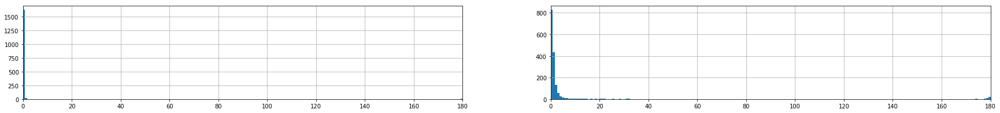

1643
OpenCV 5-point:
error_R = 0.0610 ± 0.2156 error_t = 1.9050 ± 7.7711
1643 [8.22926395 2.51257822 0.61887378 0.58341558 0.53224036 0.33633016
 0.31322209 0.29939356 0.29258254 0.26192854]


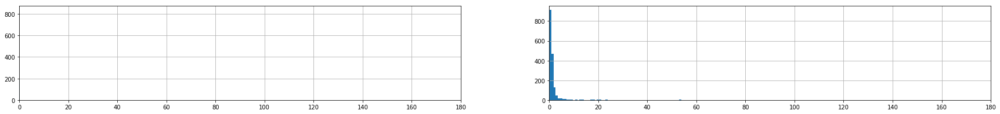

1643


In [97]:
def get_mean_std(errors):
    errors_R = [errors[key][0] for key in errors.keys()]
    errors_t = [errors[key][1] for key in errors.keys()]
    print('error_R = %.4f ± %.4f'%(np.mean(errors_R), np.std(errors_R)), 'error_t = %.4f ± %.4f'%(np.mean(errors_t), np.std(errors_t)))
    
    error_R_lim = 180.
    errors_R = [error_R for error_R in errors_R if error_R<error_R_lim]
    print(len(errors_R), np.sort(errors_R)[::-1][:10])
    plt.figure(figsize=(30, 3))
    plt.subplot(121)
    plt.hist(errors_R, 200)
    plt.xlim(0., error_R_lim)
    plt.grid()
    plt.subplot(122)
    plt.hist(errors_t, 200)
    plt.xlim(0., 180.)
    plt.grid()
    plt.show()
    print(len(errors_R))
    #     errors_t = [error[1] for error in errors]
print('gtW_errors:'); get_mean_std(gtW_errors)
print('OpenCV 5-point:'); get_mean_std(opencv_5point_errors)
# print('OpenCV 8-point:'); get_mean_std(opencv_8point_errors)

# Show epipolar for normalized points

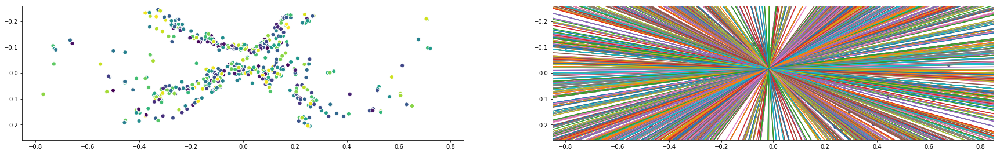

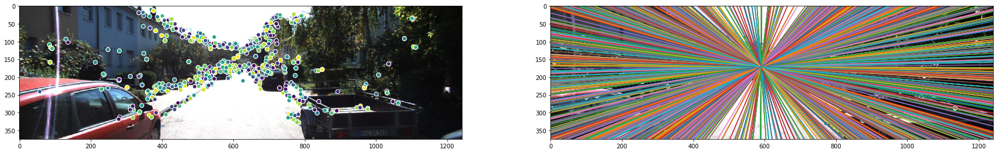

In [141]:
f = 707.0912
H = 183.1104*2
W = 601.8873*2
def show_epipolar_cust(x1, x2, img1_rgb, img2_rgb, F_gt, im_shape):
    N_points = x1.shape[0]
    x1_homo = utils_misc.homo_np(x1)
    x2_homo = utils_misc.homo_np(x2)
    right_P = np.matmul(F_gt, x1_homo.T)
    right_epipolar_x = np.tile(np.array([[-1.], [1.]]), N_points) * im_shape[1]
    # Using the eqn of line: ax+by+c=0; y = (-c-ax)/b, http://ai.stanford.edu/~mitul/cs223b/draw_epipolar.m
    right_epipolar_y = (-right_P[2:3, :] - right_P[0:1, :] * right_epipolar_x) / right_P[1:2, :]

    colors = np.random.rand(x2.shape[0])
    plt.figure(figsize=(30, 8))
    plt.subplot(121)
#     plt.imshow(img1_rgb)
#     plt.scatter(x1[:, 0]*f+W/2., x1[:, 1]*f+H/2., s=50, c=colors, edgecolors='w')
    plt.scatter(x1[:, 0], x1[:, 1], s=50, c=colors, edgecolors='w')
    plt.xlim(-im_shape[1], im_shape[1])
    plt.ylim(im_shape[0], -im_shape[0])
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.subplot(122)
#     plt.imshow(img2_rgb)
    plt.plot(right_epipolar_x, right_epipolar_y)
    plt.scatter(x2[:, 0], x2[:, 1], s=50, c=colors, edgecolors='w')
#     plt.axis('equal')
    plt.xlim(-im_shape[1], im_shape[1])
    plt.ylim(im_shape[0], -im_shape[0])
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

F = F_gts.to(torch.float32)[0].numpy()
K = Ks[0].numpy()
F_test = K.T@F@K
show_epipolar_cust(x1_normalizedK[0].numpy(), x2_normalizedK[0].numpy(), im1, im2, F_test, [K[1, 2]/K[1, 1], K[0, 2]/K[0, 0]])
utils_opencv.show_epipolar_rui(x1[0].numpy(), x2[0].numpy(), im1, im2, F_gts.to(torch.float32)[0].numpy(), im1.shape[:2])

# Test matching

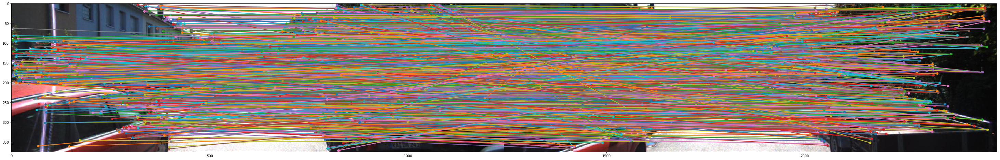

In [88]:
sift_kps1 = sift_kps[0][0].numpy()
sift_kps2 = sift_kps[1][0].numpy()
desc_ii = sift_deses[0][0].numpy()
desc_jj = sift_deses[1][0].numpy()
distmat = np.sqrt(
    np.sum(
        (np.expand_dims(desc_ii, 1) - np.expand_dims(desc_jj, 0))**2,
        axis=2))
# Choose K best from N
obj_num_nn = 1
idx_sort = np.argsort(distmat, axis=1)[:, :obj_num_nn]
idx_sort = (
    np.repeat(
        np.arange(distmat.shape[0])[..., None],
        idx_sort.shape[1], axis=1
    ),
    idx_sort
)
matches_1nn = np.hstack((sift_kps1, sift_kps2[idx_sort[1].flatten(), :]))
utils_vis.draw_corr(im1, im2, matches_1nn[:, :2], matches_1nn[:, 2:], linewidth=2)

In [93]:
print(idx_sort[1].flatten().tolist())
bf = cv2.BFMatcher(normType=cv2.NORM_L2)
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(desc_ii.astype(np.float32), desc_jj.astype(np.float32), k=2) # another option is https://github.com/MagicLeapResearch/SuperPointPretrainedNetwork/blob/master/demo_superpoint.py#L309
# store all the good matches as per Lowe's ratio test.
good = []
all_m = []
for m,n in matches:
    all_m.append(m)
    if m.distance < 0.7*n.distance:
        good.append(m)

good_ij = [[mat.queryIdx for mat in good], [mat.trainIdx for mat in good]]
all_ij = [[mat.queryIdx for mat in all_m], [mat.trainIdx for mat in all_m]]
print(all_ij[1])


[1962, 1713, 1338, 636, 387, 354, 657, 610, 718, 267, 1885, 335, 305, 1106, 891, 266, 704, 517, 1696, 1812, 1156, 827, 128, 540, 1325, 772, 671, 1110, 427, 1168, 1215, 1214, 1581, 1483, 436, 1323, 173, 920, 501, 1401, 1506, 295, 1, 937, 200, 1540, 577, 59, 1168, 1015, 92, 1747, 1532, 1671, 270, 1816, 1032, 1062, 1211, 1610, 250, 686, 924, 17, 1532, 947, 1538, 710, 1816, 622, 1215, 13, 738, 67, 1078, 1253, 1969, 481, 658, 779, 1720, 318, 1011, 260, 837, 1310, 915, 110, 422, 671, 1366, 826, 1537, 4, 100, 1836, 1302, 886, 792, 274, 94, 1653, 1219, 947, 753, 1788, 175, 942, 92, 1622, 503, 1772, 1665, 1341, 857, 36, 1081, 1422, 579, 80, 466, 1109, 1934, 14, 1868, 426, 894, 1574, 303, 1187, 1329, 1311, 1684, 91, 1374, 786, 1060, 1786, 597, 634, 1847, 114, 998, 710, 1766, 1987, 1616, 1094, 1500, 698, 584, 610, 721, 701, 1110, 1781, 861, 421, 1816, 1031, 980, 925, 1290, 154, 966, 56, 165, 1291, 272, 584, 1451, 67, 1295, 1742, 1986, 1272, 1959, 1917, 1074, 1475, 307, 286, 1239, 836, 1796, 1538,

[1962, 1713, 1338, 636, 387, 354, 657, 610, 718, 267, 1885, 335, 305, 1106, 891, 266, 704, 517, 1696, 1812, 1156, 827, 128, 540, 1325, 772, 671, 1110, 427, 1168, 1215, 1214, 1581, 1483, 436, 1323, 173, 920, 501, 1401, 1506, 295, 1, 937, 200, 1540, 577, 59, 1168, 1015, 92, 1747, 1532, 1671, 270, 1816, 1032, 1062, 1211, 1610, 250, 686, 924, 17, 1532, 947, 1538, 710, 1816, 622, 1215, 13, 738, 67, 1078, 1253, 1969, 481, 658, 779, 1720, 318, 1011, 260, 837, 1310, 915, 110, 422, 671, 1366, 826, 1537, 4, 100, 1836, 1302, 886, 792, 274, 94, 1653, 1219, 947, 753, 1788, 175, 942, 92, 1622, 503, 1772, 1665, 1341, 857, 36, 1081, 1422, 579, 80, 466, 1109, 1934, 14, 1868, 426, 894, 1574, 303, 1187, 1329, 1311, 1684, 91, 1374, 786, 1060, 1786, 597, 634, 1847, 114, 998, 710, 1766, 1987, 1616, 1094, 1500, 698, 584, 610, 721, 701, 1110, 1781, 861, 421, 1816, 1031, 980, 925, 1290, 154, 966, 56, 165, 1291, 272, 584, 1451, 67, 1295, 1742, 1986, 1272, 1959, 1917, 1074, 1475, 307, 286, 1239, 836, 1796, 1538,

In [78]:
desc_ii.astype(np.float64)

array([[  9.,  93.,  26., ...,   0.,   1.,  14.],
       [  0.,   0.,   0., ...,  17.,  32.,  49.],
       [  2.,   1.,   9., ...,   0.,   5.,  38.],
       ...,
       [  1.,   1.,   3., ...,   2.,  22.,  53.],
       [ 14.,  69.,  28., ...,   0.,   0.,   4.],
       [ 80., 111.,  21., ...,   2.,   0.,   0.]])